In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import polars as pl
import matplotlib.pyplot as plt
from matplotlib import pyplot

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [3]:
# import all lagged data
df_lagged_added_stats_sa199m2e = pd.read_csv('sa199m2e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa196m2e = pd.read_csv('sa196m2e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa196m1e = pd.read_csv('sa196m1e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa198m2e = pd.read_csv('sa198m2e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa196m3e = pd.read_csv('sa196m3e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa199m3e = pd.read_csv('sa199m3e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa199m1e = pd.read_csv('sa199m1e_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa78m1 = pd.read_csv('sa78m1_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa78m3 = pd.read_csv('sa78m3_new_newest_lagged_added_stats.csv')
df_lagged_added_stats_sa78m5 = pd.read_csv('sa78m5_new_newest_lagged_added_stats.csv')

In [4]:
grouped_lagged_added_stats = pd.concat([df_lagged_added_stats_sa199m2e,df_lagged_added_stats_sa196m2e,
df_lagged_added_stats_sa196m1e,df_lagged_added_stats_sa198m2e,df_lagged_added_stats_sa196m3e,df_lagged_added_stats_sa199m3e,
df_lagged_added_stats_sa199m1e,df_lagged_added_stats_sa78m1,df_lagged_added_stats_sa78m3,df_lagged_added_stats_sa78m5]).iloc[:,1:]

In [5]:
grouped_lagged_added_stats_ri = grouped_lagged_added_stats.reset_index(drop=True)

# Low 127(failed a new 4th - _2, _3) vs High 192 (did a new 4th - 23, _4, _5)
# including lag3

In [7735]:
grouped_lagged_added_stats_ri_low = grouped_lagged_added_stats_ri[(grouped_lagged_added_stats_ri['Choice Output']==2) | ((grouped_lagged_added_stats_ri['Choice Output']==3) & (grouped_lagged_added_stats_ri['lagged_1_choice_ago']>2))]

In [7736]:
grouped_lagged_added_stats_ri_low['Binary'] = 0

C:\Users\Josue Regalado\AppData\Local\Temp\ipykernel_29860\24646402.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped_lagged_added_stats_ri_low['Binary'] = 0


In [7737]:
grouped_lagged_added_stats_ri_low

,Middle Duration,lagged_1_mid_duration,lagged_2_mid_duration,lagged_3_mid_duration,lagged_4_mid_duration,Middle Nose Movement,lagged_1_mid_nose_mov,lagged_2_mid_nose_mov,lagged_3_mid_nose_mov,lagged_4_mid_nose_mov,...,mean_2_past_exitmidentry_duration,mean_3_past_exitmidentry_duration,mean_4_past_exitmidentry_duration,mean_5_past_exitmidentry_duration,Choice Output,lagged_1_choice_ago,lagged_2_choice_ago,lagged_3_choice_ago,lagged_4_choice_ago,Binary
0,0.395349,0.279070,0.441860,0.000000,0.000000,0.499066,0.443050,0.375489,0.000000,0.000000,...,0.472222,0.518519,0.496528,0.397222,3,4,3,2,1,0
1,0.302326,0.395349,0.279070,0.441860,0.000000,0.291543,0.499066,0.443050,0.375489,0.000000,...,0.458333,0.462963,0.500000,0.486111,3,3,4,3,2,0
3,0.139535,0.279070,0.302326,0.395349,0.279070,0.226293,0.239721,0.291543,0.499066,0.443050,...,0.465278,0.458333,0.461806,0.463889,3,4,3,3,4,0
4,0.139535,0.139535,0.279070,0.302326,0.395349,0.212414,0.226293,0.239721,0.291543,0.499066,...,0.541667,0.527778,0.506944,0.500000,3,3,4,3,3,0
5,0.255814,0.139535,0.139535,0.279070,0.302326,0.470011,0.212414,0.226293,0.239721,0.291543,...,0.597222,0.541667,0.531250,0.513889,2,3,3,4,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,0.292453,0.485849,0.117925,0.089623,0.000000,0.305776,0.296705,0.183453,0.113333,0.011136,...,0.397106,0.330118,0.284566,0.248875,3,3,2,4,4,0
305,0.084906,0.075472,0.037736,0.014151,0.061321,0.163662,0.134791,0.049044,0.025347,0.113172,...,0.196141,0.161844,0.142283,0.145338,3,5,5,5,5,0
309,0.066038,0.141509,0.037736,0.084906,0.084906,0.096689,0.133200,0.105555,0.121430,0.163662,...,0.147910,0.138264,0.156752,0.160129,3,5,5,4,3,0
310,0.528302,0.066038,0.141509,0.037736,0.084906,0.648750,0.096689,0.133200,0.105555,0.121430,...,0.353698,0.295820,0.251608,0.243730,3,3,5,5,4,0


In [7738]:
grouped_lagged_added_stats_ri_high = grouped_lagged_added_stats_ri[(grouped_lagged_added_stats_ri['Choice Output']>3) | ((grouped_lagged_added_stats_ri['Choice Output']==3) & (grouped_lagged_added_stats_ri['lagged_1_choice_ago']==2))]

In [7739]:
grouped_lagged_added_stats_ri_high['Binary'] = 1

C:\Users\Josue Regalado\AppData\Local\Temp\ipykernel_29860\2828041089.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  grouped_lagged_added_stats_ri_high['Binary'] = 1


In [7740]:
grouped_lagged_added_stats_ri_high

,Middle Duration,lagged_1_mid_duration,lagged_2_mid_duration,lagged_3_mid_duration,lagged_4_mid_duration,Middle Nose Movement,lagged_1_mid_nose_mov,lagged_2_mid_nose_mov,lagged_3_mid_nose_mov,lagged_4_mid_nose_mov,...,mean_2_past_exitmidentry_duration,mean_3_past_exitmidentry_duration,mean_4_past_exitmidentry_duration,mean_5_past_exitmidentry_duration,Choice Output,lagged_1_choice_ago,lagged_2_choice_ago,lagged_3_choice_ago,lagged_4_choice_ago,Binary
2,0.279070,0.302326,0.395349,0.279070,0.441860,0.239721,0.291543,0.499066,0.443050,0.375489,...,0.472222,0.472222,0.472222,0.500000,4,3,3,4,3,1
6,0.488372,0.255814,0.139535,0.139535,0.279070,0.516920,0.470011,0.212414,0.226293,0.239721,...,0.555556,0.587963,0.548611,0.538889,3,2,3,3,4,1
8,0.255814,0.279070,0.488372,0.255814,0.139535,0.460563,0.431110,0.516920,0.470011,0.212414,...,0.402778,0.458333,0.479167,0.513889,4,3,3,2,3,1
12,0.139535,0.139535,0.255814,0.116279,0.255814,0.261105,0.320118,0.378745,0.263726,0.460563,...,0.354167,0.356481,0.347222,0.355556,3,2,2,2,4,1
13,0.511628,0.139535,0.139535,0.255814,0.116279,0.493775,0.261105,0.320118,0.378745,0.263726,...,0.506944,0.449074,0.427083,0.405556,4,3,2,2,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
315,0.070755,0.028302,0.023585,0.891509,0.103774,0.135402,0.059617,0.074648,1.000000,0.161598,...,0.112540,0.108253,0.299839,0.272669,4,4,5,4,4,1
316,0.009434,0.070755,0.028302,0.023585,0.891509,0.029302,0.135402,0.059617,0.074648,1.000000,...,0.114148,0.108253,0.106109,0.259807,5,4,4,5,4,1
317,0.004717,0.009434,0.070755,0.028302,0.023585,0.016390,0.029302,0.135402,0.059617,0.074648,...,0.120579,0.123258,0.116559,0.113183,4,5,4,4,5,1
318,0.150943,0.004717,0.009434,0.070755,0.028302,0.224511,0.016390,0.029302,0.135402,0.059617,...,0.217042,0.177921,0.165595,0.151768,4,4,5,4,4,1


In [7741]:
grouped_lagged_lowhigh_dt = pd.concat([grouped_lagged_added_stats_ri_low, grouped_lagged_added_stats_ri_high])

In [7742]:
grouped_lagged_lowhigh_dt_ri = grouped_lagged_lowhigh_dt.reset_index(drop=True)

In [7744]:
x_lowhigh_main= grouped_lagged_lowhigh_dt_ri.drop(columns = ['Choice Output', 'Duration', 'Exit Latency', 
        'Nose Max Distance', 'Nose Time to Max Dist', 'Tail Base Max Distance', 'Tail Base Time to Max Dist', 'Entry Tortuosity', 'Exit Tortuosity',
        'Other Tortuosity', 'Arm Nose Movement', 'Arm Nose Velocity', 'Arm Tail Movement', 'Arm Tail Velocity',
       
        'lagged_1_lagged_1_cur_coeff',
       'lagged_2_lagged_1_cur_coeff', 'lagged_3_lagged_1_cur_coeff',
       'lagged_4_lagged_1_cur_coeff',
       'lagged_1_lagged_2_cur_coeff', 'lagged_2_lagged_2_cur_coeff',
       'lagged_3_lagged_2_cur_coeff', 'lagged_4_lagged_2_cur_coeff',
       'lagged_1_lagged_3_cur_coeff',
       'lagged_2_lagged_3_cur_coeff', 'lagged_3_lagged_3_cur_coeff',
       'lagged_4_lagged_3_cur_coeff', 
       'lagged_1_lagged_4_cur_coeff', 'lagged_2_lagged_4_cur_coeff',
       'lagged_3_lagged_4_cur_coeff', 'lagged_4_lagged_4_cur_coeff',
       
       
       'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop',
       'lagged_3_lagged_1_cur_coeff_time_prop',
       'lagged_4_lagged_1_cur_coeff_time_prop',
       
       'lagged_1_lagged_2_cur_coeff_time_prop',
       'lagged_2_lagged_2_cur_coeff_time_prop',
       'lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop',
       
       'lagged_1_lagged_3_cur_coeff_time_prop',
       'lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop',
       'lagged_4_lagged_3_cur_coeff_time_prop',
       
       'lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop',
       'lagged_3_lagged_4_cur_coeff_time_prop',
       'lagged_4_lagged_4_cur_coeff_time_prop',
                                                                                                             
                                                                                                             
        'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop','lagged_3_lagged_1_cur_coeff_time_prop','lagged_4_lagged_1_cur_coeff_time_prop',
       'lagged_1_lagged_2_cur_coeff_time_prop','lagged_2_lagged_2_cur_coeff_time_prop','lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop','lagged_1_lagged_3_cur_coeff_time_prop','lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop','lagged_4_lagged_3_cur_coeff_time_prop','lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop','lagged_3_lagged_4_cur_coeff_time_prop','lagged_4_lagged_4_cur_coeff_time_prop', 
        'Turn', 'lagged_1_turn_ago', 'lagged_2_turn_ago', 'lagged_3_turn_ago', 'lagged_4_turn_ago', 
        '2_cur_arm_duration', '3_cur_arm_duration', '4_cur_arm_duration',
       '5_cur_arm_duration', 'mean_2_cur_arm_duration',
       'mean_3_cur_arm_duration', 'mean_4_cur_arm_duration',
       'mean_5_cur_arm_duration', '2_past_arm_duration', '3_past_arm_duration',
       '4_past_arm_duration', 'mean_2_past_arm_duration',
       'mean_3_past_arm_duration', 'mean_4_past_arm_duration',
       '2_past_mid_duration', '3_past_mid_duration', '4_past_mid_duration',
       '5_past_mid_duration', 'mean_2_past_mid_duration',
       'mean_3_past_mid_duration', 'mean_4_past_mid_duration',
       'mean_5_past_mid_duration', '2_past_exitmid_duration',
       '3_past_exitmid_duration', '4_past_exitmid_duration',
       '5_past_exitmid_duration', 'mean_2_past_exitmid_duration',
       'mean_3_past_exitmid_duration', 'mean_4_past_exitmid_duration',
       'mean_5_past_exitmid_duration', '2_past_midentry_duration',
       '3_past_midentry_duration', '4_past_midentry_duration',
       '5_past_midentry_duration', 'mean_2_past_midentry_duration',
       'mean_3_past_midentry_duration', 'mean_4_past_midentry_duration',
       'mean_5_past_midentry_duration', '2_past_exitmidentry_duration',
       '3_past_exitmidentry_duration', '4_past_exitmidentry_duration',
       '5_past_exitmidentry_duration', 'mean_2_past_exitmidentry_duration',
       'mean_3_past_exitmidentry_duration',
       'mean_4_past_exitmidentry_duration',
       'mean_5_past_exitmidentry_duration',
                                                                                                               
        'lagged_1_choice_ago', 'lagged_2_choice_ago', 'lagged_3_choice_ago',
       'lagged_4_choice_ago',
        'lagged_1_new_lagged_1_cur_coeff',
        'lagged_2_new_lagged_1_cur_coeff', 
        'lagged_3_new_lagged_1_cur_coeff','lagged_4_new_lagged_1_cur_coeff','lagged_1_new_lagged_2_cur_coeff', 'lagged_2_new_lagged_2_cur_coeff', 
        'lagged_3_new_lagged_2_cur_coeff', 'lagged_4_new_lagged_2_cur_coeff','lagged_1_new_lagged_3_cur_coeff','lagged_2_new_lagged_3_cur_coeff', 
        'lagged_3_new_lagged_3_cur_coeff','lagged_4_new_lagged_3_cur_coeff','lagged_1_new_lagged_4_cur_coeff', 'lagged_2_new_lagged_4_cur_coeff',
        'lagged_3_new_lagged_4_cur_coeff', 'lagged_4_new_lagged_4_cur_coeff','lagged_1_new_lagged_1_cur_coeff_time_prop',
       'lagged_2_new_lagged_1_cur_coeff_time_prop','lagged_3_new_lagged_1_cur_coeff_time_prop','lagged_4_new_lagged_1_cur_coeff_time_prop',
       'lagged_1_new_lagged_2_cur_coeff_time_prop','lagged_2_new_lagged_2_cur_coeff_time_prop','lagged_3_new_lagged_2_cur_coeff_time_prop',
       'lagged_4_new_lagged_2_cur_coeff_time_prop','lagged_1_new_lagged_3_cur_coeff_time_prop','lagged_2_new_lagged_3_cur_coeff_time_prop',
       'lagged_3_new_lagged_3_cur_coeff_time_prop','lagged_4_new_lagged_3_cur_coeff_time_prop','lagged_1_new_lagged_4_cur_coeff_time_prop',
       'lagged_2_new_lagged_4_cur_coeff_time_prop','lagged_3_new_lagged_4_cur_coeff_time_prop','lagged_4_new_lagged_4_cur_coeff_time_prop',
        'Exit Latency Nose Movement', 'Exit Latency Nose Velocity', 'Exit Latency Tail Movement', 'Exit Latency Tail Velocity',
       'lagged_4_mid_duration', 
       'lagged_4_mid_nose_mov', 'lagged_4_mid_nose_vel', 
       'lagged_4_mid_tail_mov', 'lagged_4_mid_tail_vel', 'lagged_4_mid_tortuosity',                                              
         'lagged_4_current_coeff', 'Lagged 3 Cur Coeff', 'Lagged 4 Cur Coeff', 
        'lagged_4_new_current_coeff',  'New Lagged 3 Cur Coeff', 'New Lagged 4 Cur Coeff',                                          
        'lagged_4_current_coeff_time_prop', 'Lagged 3 Cur Coeff Time Proportional',                                               
         'Lagged 4 Cur Coeff Time Proportional',
       'lagged_4_new_current_coeff_time_prop', 'New Lagged 3 Cur Coeff Time Proportional',  'New Lagged 4 Cur Coeff Time Proportional',                                            
       'lagged_4_entry_lat', 'lagged_4_entry_lat_nose_mov',
       'lagged_4_entry_lat_nose_vel', 'lagged_4_entry_lat_tail_mov',
       'lagged_4_entry_lat_tail_vel', 'lagged_4_duration',
       'lagged_4_nose_max_distance', 'lagged_4_nose_time_to_max_dist',
       'lagged_4_tail_max_distance', 'lagged_4_tail_time_to_max_dist',                                         
       'lagged_4_arm_nose_mov', 'lagged_4_arm_nose_vel',                                                 
       'lagged_4_arm_tail_mov', 'lagged_4_arm_tail_vel',
       'lagged_4_entry_tortuosity', 'lagged_4_exit_tortuosity',
       'lagged_4_other_tortuosity', 'lagged_4_exit_lat',
       'lagged_4_exit_lat_nose_mov', 'lagged_4_exit_lat_nose_vel',
       'lagged_4_exit_lat_tail_mov', 'lagged_4_exit_lat_tail_vel',
       'lagged_4_exitmid_duration', 'lagged_4_midentry_duration',
       'lagged_4_exitmidentry_duration', 'Binary',
       'Lagged 2 Cur Coeff',  'New Lagged 2 Cur Coeff', 'Lagged 2 Cur Coeff Time Proportional', 'New Lagged 2 Cur Coeff Time Proportional',                                             
       'Lagged 1 Cur Coeff','New Lagged 1 Cur Coeff', 'Lagged 1 Cur Coeff Time Proportional','New Lagged 1 Cur Coeff Time Proportional',
       'Lagged 3 Cur Coeff','New Lagged 3 Cur Coeff', 'Lagged 3 Cur Coeff Time Proportional','New Lagged 3 Cur Coeff Time Proportional'                                                      
                                                        ])


In [7745]:
x_lowhigh_main.columns[:100]

Index(['Middle Duration', 'lagged_1_mid_duration', 'lagged_2_mid_duration',
       'lagged_3_mid_duration', 'Middle Nose Movement',
       'lagged_1_mid_nose_mov', 'lagged_2_mid_nose_mov',
       'lagged_3_mid_nose_mov', 'Middle Nose Velocity',
       'lagged_1_mid_nose_vel', 'lagged_2_mid_nose_vel',
       'lagged_3_mid_nose_vel', 'Middle Tail Movement',
       'lagged_1_mid_tail_mov', 'lagged_2_mid_tail_mov',
       'lagged_3_mid_tail_mov', 'Middle Tail Velocity',
       'lagged_1_mid_tail_vel', 'lagged_2_mid_tail_vel',
       'lagged_3_mid_tail_vel', 'Middle Tortuosity', 'lagged_1_mid_tortuosity',
       'lagged_2_mid_tortuosity', 'lagged_3_mid_tortuosity', 'Current Coeff',
       'lagged_1_current_coeff', 'lagged_2_current_coeff',
       'lagged_3_current_coeff', 'New Current Coeff',
       'lagged_1_new_current_coeff', 'lagged_2_new_current_coeff',
       'lagged_3_new_current_coeff', 'Current Coeff Time Proportional',
       'lagged_1_current_coeff_time_prop', 'lagged_2_current_c

In [7746]:
x_lh = x_lowhigh_main.values

In [7747]:
y_lh = grouped_lagged_lowhigh_dt_ri['Binary'].values

In [7748]:
X_train_lh, X_test_lh, y_train_lh, y_test_lh = train_test_split(x_lh, y_lh, test_size=0.2, random_state=5)

In [7749]:
from sklearn.ensemble import HistGradientBoostingClassifier

In [7750]:
mod_lh =  HistGradientBoostingClassifier(learning_rate = 0.02, n_iter_no_change=20, random_state=57)
mod_lh.fit(X_train_lh, y_train_lh)
y_pred_lh=mod_lh.predict(X_test_lh)

In [7751]:
mod_lh.n_iter_

100

In [7752]:
target_names = ['0', '1']

In [7753]:
f1_sc_lh = f1_score(y_test_lh, y_pred_lh, average = 'weighted')
f1_sc_lh

0.5482022708158116

In [7754]:
p_sc_lh = precision_score(y_test_lh, y_pred_lh, average = 'weighted')
p_sc_lh

0.5531037414965987

In [7755]:
cf_matrix_lh = confusion_matrix(y_test_lh, y_pred_lh)
cf_matrix_lh

array([[ 7, 19],
       [ 8, 30]], dtype=int64)

In [7756]:
print(classification_report(y_test_lh, y_pred_lh, target_names=target_names))

              precision    recall  f1-score   support

           0       0.47      0.27      0.34        26
           1       0.61      0.79      0.69        38

    accuracy                           0.58        64
   macro avg       0.54      0.53      0.52        64
weighted avg       0.55      0.58      0.55        64



In [7757]:
from sklearn.inspection import permutation_importance

In [7758]:
def plot_permutation_importance(clf, X, y, col, ax):
    result = permutation_importance(clf, X, y, n_repeats=30, random_state=0, n_jobs=2)
    perm_sorted_idx = result.importances_mean.argsort()

    # `labels` argument in boxplot is deprecated in matplotlib 3.9 and has been
    # renamed to `tick_labels`. The following code handles this, but as a
    # scikit-learn user you probably can write simpler code by using `labels=...`
    # (matplotlib < 3.9) or `tick_labels=...` (matplotlib >= 3.9).
    tick_labels_parameter_name = (
        "tick_labels"
        #if parse_version(matplotlib.__version__) >= parse_version("3.9")
        #else "labels"
    )
    tick_labels_dict = {tick_labels_parameter_name: col.columns[perm_sorted_idx]}
    ax.boxplot(result.importances[perm_sorted_idx].T, vert=False)
    ax.set_yticklabels(col.columns[perm_sorted_idx])
    ax.axvline(x=0, color="k", linestyle="--")
    return ax

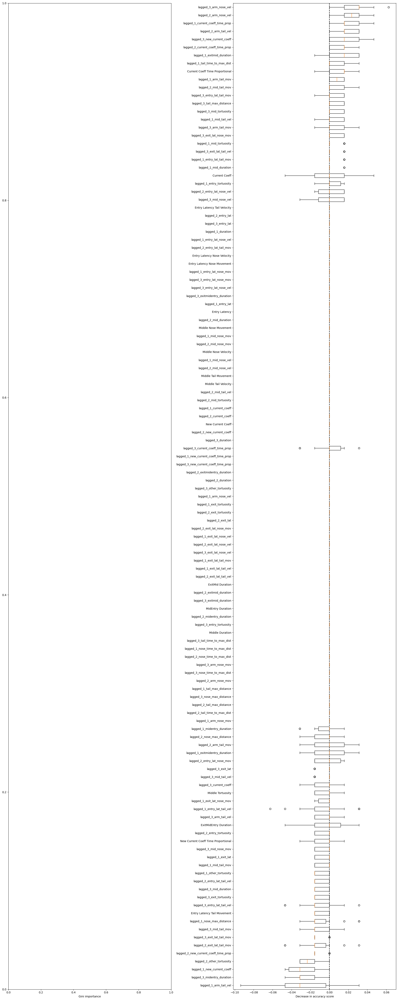

In [7759]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(mod_lh, X_test_lh, y_test_lh, x_lowhigh_main,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

In [5220]:
# try tuning part2

In [5221]:
X_train_lhTT2, X_test_lhTT2, y_train_lhTT2, y_test_lhTT2 = train_test_split(x_lh, y_lh, stratify=y_lh, random_state=55)

In [5222]:
pos_label, neg_label = 0,1 # dont want to misclassify lows as highs

In [5223]:
def fpr_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    tn, fp, _, _ = cm.ravel()
    tnr = tn / (tn + fp)
    return 1 - tnr

In [5224]:
from sklearn.metrics import make_scorer, precision_score, recall_score

In [5225]:
tpr_score = recall_score  # TPR and recall are the same metric
scoring = {
    "precision": make_scorer(precision_score, pos_label=pos_label),
    "recall": make_scorer(recall_score, pos_label=pos_label),
    "fpr": make_scorer(fpr_score, neg_label=neg_label, pos_label=pos_label),
    "tpr": make_scorer(tpr_score, pos_label=pos_label),
}

In [5355]:
def credit_gain_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    gain_matrix = np.array(
        [
            [0, -8],  # -1 gain for false positives (when a high is classified as low)
            [-13, 0],  # -5 gain for false negatives (when a low is classified as high)
        ]
    )
    return np.sum(cm * gain_matrix)


scoring["credit_gain"] = make_scorer(
    credit_gain_score, neg_label=neg_label, pos_label=pos_label
)

In [5356]:
mod_lhTT2 = HistGradientBoostingClassifier(learning_rate = 0.2, n_iter_no_change=20, random_state=57)

In [5357]:
mod_lhTT2.fit(X_train_lhTT2, y_train_lhTT2)

HistGradientBoostingClassifier(learning_rate=0.2, n_iter_no_change=20,
                               random_state=57)

[[38 10]
 [23  9]]


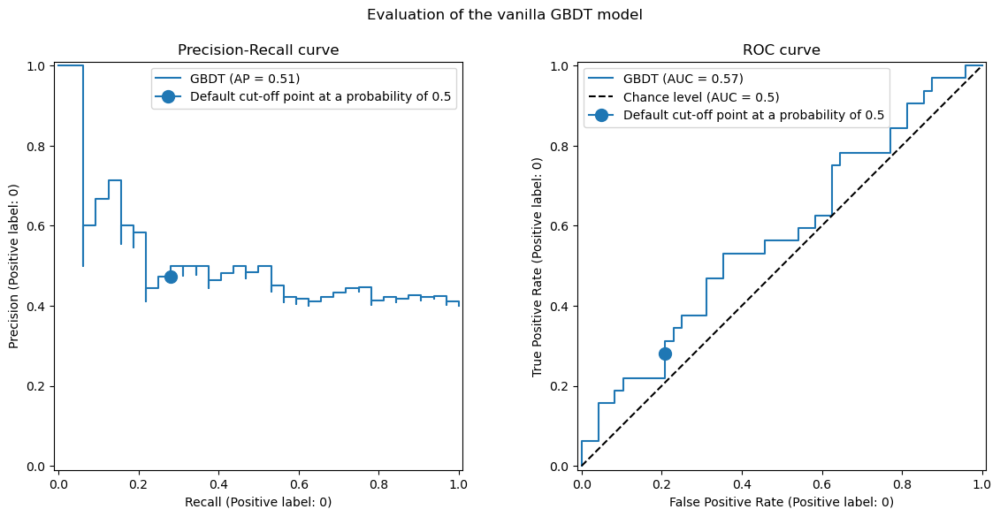

In [5358]:
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

PrecisionRecallDisplay.from_estimator(
    mod_lhTT2, X_test_lhTT2, y_test_lhTT2, pos_label=pos_label, ax=axs[0], name="GBDT"
)
axs[0].plot(
    scoring["recall"](mod_lhTT2, X_test_lhTT2, y_test_lhTT2),
    scoring["precision"](mod_lhTT2, X_test_lhTT2, y_test_lhTT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[0].set_title("Precision-Recall curve")
axs[0].legend()

RocCurveDisplay.from_estimator(
    mod_lhTT2,
    X_test_lhTT2,
    y_test_lhTT2,
    pos_label=pos_label,
    ax=axs[1],
    name="GBDT",
    plot_chance_level=True,
)
axs[1].plot(
    scoring["fpr"](mod_lhTT2, X_test_lhTT2, y_test_lhTT2),
    scoring["tpr"](mod_lhTT2, X_test_lhTT2, y_test_lhTT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[1].set_title("ROC curve")
axs[1].legend()
_ = fig.suptitle("Evaluation of the vanilla GBDT model")

In [5359]:
print(f"Business defined metric: {scoring['credit_gain'](mod_lhTT2, X_test_lhTT2, y_test_lhTT2)}")

[[38 10]
 [23  9]]
Business defined metric: -379


In [5360]:
from sklearn.model_selection import TunedThresholdClassifierCV

In [5361]:
tuned_model_lhTT2 = TunedThresholdClassifierCV(
    estimator=mod_lhTT2,
    scoring=scoring["credit_gain"],
    store_cv_results=True,  # necessary to inspect all results
)
tuned_model_lhTT2.fit(X_train_lhTT2, y_train_lhTT2)
print(f"{tuned_model_lhTT2.best_threshold_=:0.2f}")

[[ 0 29]
 [ 0 19]]
[[ 6 23]
 [ 2 17]]
[[ 8 21]
 [ 4 15]]
[[10 19]
 [ 5 14]]
[[11 18]
 [ 6 13]]
[[11 18]
 [ 7 12]]
[[12 17]
 [ 7 12]]
[[12 17]
 [ 8 11]]
[[12 17]
 [ 8 11]]
[[12 17]
 [ 8 11]]
[[12 17]
 [ 8 11]]
[[12 17]
 [ 8 11]]
[[13 16]
 [ 8 11]]
[[14 15]
 [ 8 11]]
[[14 15]
 [ 8 11]]
[[14 15]
 [ 8 11]]
[[14 15]
 [ 8 11]]
[[14 15]
 [ 8 11]]
[[14 15]
 [ 8 11]]
[[15 14]
 [ 8 11]]
[[15 14]
 [ 9 10]]
[[15 14]
 [ 9 10]]
[[15 14]
 [ 9 10]]
[[15 14]
 [10  9]]
[[15 14]
 [11  8]]
[[15 14]
 [11  8]]
[[15 14]
 [11  8]]
[[15 14]
 [11  8]]
[[16 13]
 [11  8]]
[[16 13]
 [11  8]]
[[16 13]
 [11  8]]
[[16 13]
 [11  8]]
[[16 13]
 [11  8]]
[[16 13]
 [11  8]]
[[16 13]
 [11  8]]
[[16 13]
 [11  8]]
[[16 13]
 [11  8]]
[[16 13]
 [11  8]]
[[16 13]
 [11  8]]
[[16 13]
 [11  8]]
[[16 13]
 [11  8]]
[[16 13]
 [12  7]]
[[16 13]
 [12  7]]
[[16 13]
 [12  7]]
[[17 12]
 [12  7]]
[[17 12]
 [12  7]]
[[18 11]
 [12  7]]
[[18 11]
 [12  7]]
[[19 10]
 [12  7]]
[[19 10]
 [12  7]]
[[19 10]
 [12  7]]
[[19 10]
 [12  7]]
[[20  9]
 [1

In [5362]:
def plot_roc_pr_curves(vanilla_model, tuned_model, *, title):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(21, 6))

    linestyles = ("dashed", "dotted")
    markerstyles = ("o", ">")
    colors = ("tab:blue", "tab:orange")
    names = ("Vanilla GBDT", "Tuned GBDT")
    for idx, (est, linestyle, marker, color, name) in enumerate(
        zip((vanilla_model, tuned_model), linestyles, markerstyles, colors, names)
    ):
        decision_threshold = getattr(est, "best_threshold_", 0.5)
        PrecisionRecallDisplay.from_estimator(
            est,
            X_test_lhTT2,
            y_test_lhTT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[0],
            name=name,
        )
        axs[0].plot(
            scoring["recall"](est, X_test_lhTT2, y_test_lhTT2),
            scoring["precision"](est, X_test_lhTT2, y_test_lhTT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )
        RocCurveDisplay.from_estimator(
            est,
            X_test_lhTT2,
            y_test_lhTT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[1],
            name=name,
            plot_chance_level=idx == 1,
        )
        axs[1].plot(
            scoring["fpr"](est, X_test_lhTT2, y_test_lhTT2),
            scoring["tpr"](est, X_test_lhTT2, y_test_lhTT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )

    axs[0].set_title("Precision-Recall curve")
    axs[0].legend()
    axs[1].set_title("ROC curve")
    axs[1].legend()

    axs[2].plot(
        tuned_model.cv_results_["thresholds"],
        tuned_model.cv_results_["scores"],
        color="tab:orange",
    )
    axs[2].plot(
        tuned_model.best_threshold_,
        tuned_model.best_score_,
        "o",
        markersize=10,
        color="tab:orange",
        label="Optimal cut-off point for the business metric",
    )
    axs[2].legend()
    axs[2].set_xlabel("Decision threshold (probability)")
    axs[2].set_ylabel("Objective score (using cost-matrix)")
    axs[2].set_title("Objective score as a function of the decision threshold")
    fig.suptitle(title)

[[38 10]
 [23  9]]
[[28 20]
 [15 17]]


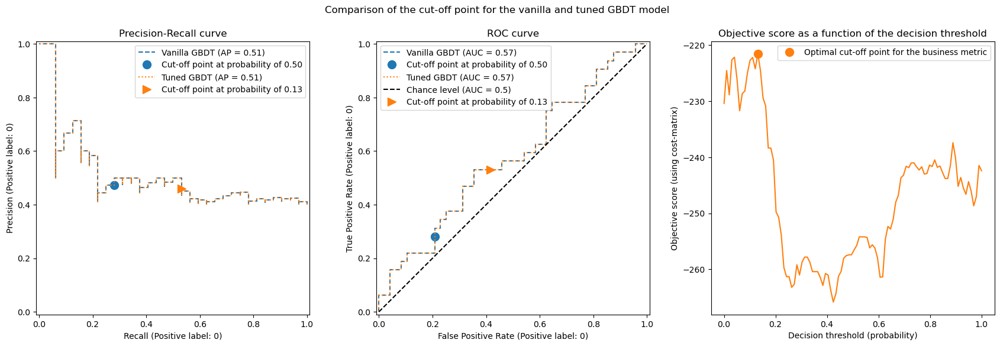

In [5363]:
title = "Comparison of the cut-off point for the vanilla and tuned GBDT model"
plot_roc_pr_curves(mod_lhTT2, tuned_model_lhTT2, title=title)

In [5354]:
print(f"Business defined metric: {scoring['credit_gain'](tuned_model_lhTT2, X_test_lhTT2, y_test_lhTT2)}")

[[28 20]
 [15 17]]
Business defined metric: -347.5


In [251]:
sum(y_test_lhTT2==0)

32

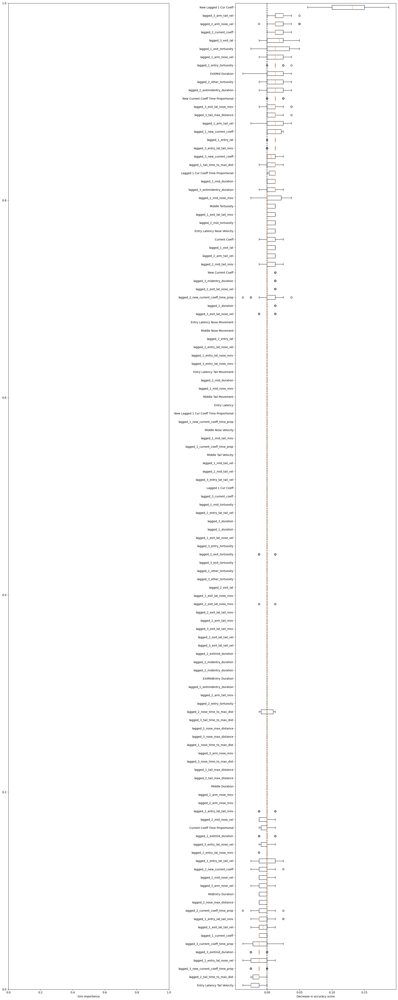

In [252]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(tuned_model_lhTT2, X_test_lhTT2, y_test_lhTT2, x_lowhigh_main,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

In [ ]:
# SAME AS ABOVE BUT WITH GRADIENT BOOSTING CLF

In [284]:
mod_lh_GB =  GradientBoostingClassifier(n_estimators = 1000, learning_rate = 0.05, validation_fraction=0.1, n_iter_no_change=20, random_state=59)
mod_lh_GB.fit(X_train_lh, y_train_lh)
y_pred_lh_GB=mod_lh_GB.predict(X_test_lh)

In [285]:
mod_lh_GB.n_estimators_

55

In [286]:
target_names = ['0', '1']

In [287]:
f1_sc_lh_GB = f1_score(y_test_lh, y_pred_lh_GB, average = 'weighted')
f1_sc_lh_GB

0.6061320754716981

In [288]:
p_sc_lh_GB = precision_score(y_test_lh, y_pred_lh_GB, average = 'weighted')
p_sc_lh_GB

0.6055769230769231

In [289]:
cf_matrix_lh_GB = confusion_matrix(y_test_lh, y_pred_lh_GB)
cf_matrix_lh_GB

array([[14, 14],
       [11, 25]], dtype=int64)

In [290]:
print(classification_report(y_test_lh, y_pred_lh_GB, target_names=target_names))

              precision    recall  f1-score   support

           0       0.56      0.50      0.53        28
           1       0.64      0.69      0.67        36

    accuracy                           0.61        64
   macro avg       0.60      0.60      0.60        64
weighted avg       0.61      0.61      0.61        64



In [291]:
from sklearn.inspection import permutation_importance

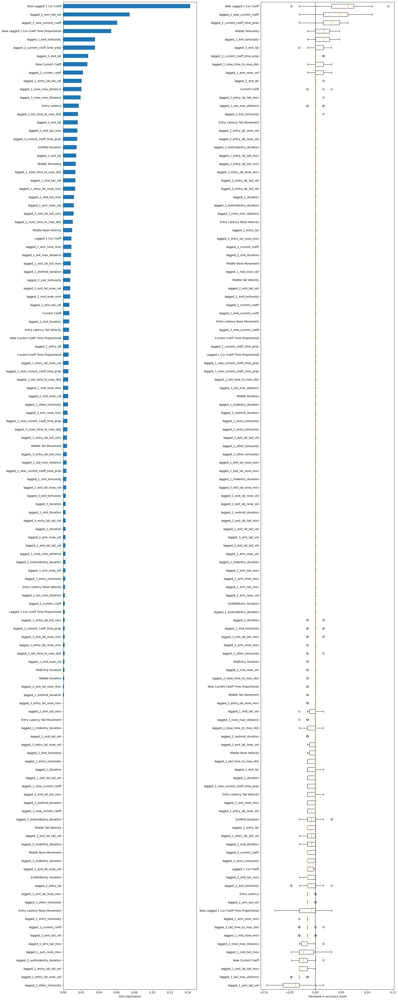

In [292]:
mdi_importances_lh_GB= pd.Series(mod_lh_GB.feature_importances_, index=x_lowhigh_main.columns)
tree_importance_sorted_idx_lh_GB = np.argsort(mod_lh_GB.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
mdi_importances_lh_GB.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(mod_lh_GB, X_test_lh, y_test_lh, x_lowhigh_main,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

In [ ]:
# try tuning part2

In [293]:
X_train_lhTT2_GB, X_test_lhTT2_GB, y_train_lhTT2_GB, y_test_lhTT2_GB = train_test_split(x_lh, y_lh, stratify=y_lh, random_state=55)

In [294]:
pos_label, neg_label = 0,1 # dont want to misclassify lows as highs

In [295]:
def fpr_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    tn, fp, _, _ = cm.ravel()
    tnr = tn / (tn + fp)
    return 1 - tnr

In [296]:
from sklearn.metrics import make_scorer, precision_score, recall_score

In [297]:
tpr_score = recall_score  # TPR and recall are the same metric
scoring = {
    "precision": make_scorer(precision_score, pos_label=pos_label),
    "recall": make_scorer(recall_score, pos_label=pos_label),
    "fpr": make_scorer(fpr_score, neg_label=neg_label, pos_label=pos_label),
    "tpr": make_scorer(tpr_score, pos_label=pos_label),
}

In [391]:
def credit_gain_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    gain_matrix = np.array(
        [
            [0, -1.79],  # -1 gain for false positives (when a high is classified as low)
            [-2, 0],  # -5 gain for false negatives (when a low is classified as high)
        ]
    )
    return np.sum(cm * gain_matrix)


scoring["credit_gain"] = make_scorer(
    credit_gain_score, neg_label=neg_label, pos_label=pos_label
)

In [392]:
mod_lhTT2_GB = GradientBoostingClassifier(n_estimators = 1000, learning_rate = 0.05, n_iter_no_change=20, random_state=59)

In [393]:
mod_lhTT2_GB.fit(X_train_lhTT2_GB, y_train_lhTT2_GB)

GradientBoostingClassifier(learning_rate=0.05, n_estimators=1000,
                           n_iter_no_change=20, random_state=59)

[[43  5]
 [18 14]]


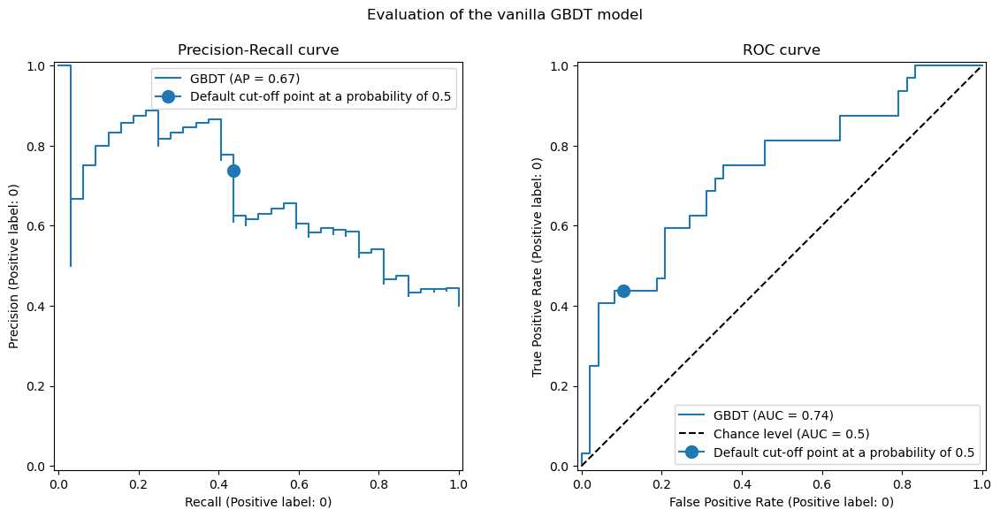

In [394]:
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

PrecisionRecallDisplay.from_estimator(
    mod_lhTT2_GB, X_test_lhTT2_GB, y_test_lhTT2_GB, pos_label=pos_label, ax=axs[0], name="GBDT"
)
axs[0].plot(
    scoring["recall"](mod_lhTT2_GB, X_test_lhTT2_GB, y_test_lhTT2_GB),
    scoring["precision"](mod_lhTT2_GB, X_test_lhTT2_GB, y_test_lhTT2_GB),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[0].set_title("Precision-Recall curve")
axs[0].legend()

RocCurveDisplay.from_estimator(
    mod_lhTT2_GB,
    X_test_lhTT2_GB,
    y_test_lhTT2_GB,
    pos_label=pos_label,
    ax=axs[1],
    name="GBDT",
    plot_chance_level=True,
)
axs[1].plot(
    scoring["fpr"](mod_lhTT2_GB, X_test_lhTT2_GB, y_test_lhTT2_GB),
    scoring["tpr"](mod_lhTT2_GB, X_test_lhTT2_GB, y_test_lhTT2_GB),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[1].set_title("ROC curve")
axs[1].legend()
_ = fig.suptitle("Evaluation of the vanilla GBDT model")

In [395]:
print(f"Business defined metric: {scoring['credit_gain'](mod_lhTT2_GB, X_test_lhTT2_GB, y_test_lhTT2_GB)}")

[[43  5]
 [18 14]]
Business defined metric: -44.95


In [396]:
from sklearn.model_selection import TunedThresholdClassifierCV

In [397]:
tuned_model_lhTT2_GB = TunedThresholdClassifierCV(
    estimator=mod_lhTT2_GB,
    scoring=scoring["credit_gain"],
    store_cv_results=True,  # necessary to inspect all results
)
tuned_model_lhTT2_GB.fit(X_train_lhTT2_GB, y_train_lhTT2_GB)
print(f"{tuned_model_lhTT2_GB.best_threshold_=:0.2f}")

[[ 0 29]
 [ 0 19]]
[[ 1 28]
 [ 0 19]]
[[ 3 26]
 [ 0 19]]
[[ 3 26]
 [ 1 18]]
[[ 4 25]
 [ 1 18]]
[[ 4 25]
 [ 1 18]]
[[ 6 23]
 [ 1 18]]
[[ 6 23]
 [ 1 18]]
[[ 6 23]
 [ 1 18]]
[[ 6 23]
 [ 1 18]]
[[ 6 23]
 [ 1 18]]
[[ 8 21]
 [ 1 18]]
[[ 8 21]
 [ 1 18]]
[[ 8 21]
 [ 1 18]]
[[ 8 21]
 [ 1 18]]
[[ 8 21]
 [ 1 18]]
[[ 8 21]
 [ 1 18]]
[[ 8 21]
 [ 1 18]]
[[ 8 21]
 [ 1 18]]
[[ 8 21]
 [ 1 18]]
[[10 19]
 [ 2 17]]
[[10 19]
 [ 2 17]]
[[11 18]
 [ 2 17]]
[[11 18]
 [ 3 16]]
[[11 18]
 [ 3 16]]
[[11 18]
 [ 3 16]]
[[11 18]
 [ 3 16]]
[[12 17]
 [ 4 15]]
[[12 17]
 [ 4 15]]
[[12 17]
 [ 4 15]]
[[12 17]
 [ 4 15]]
[[12 17]
 [ 5 14]]
[[12 17]
 [ 6 13]]
[[13 16]
 [ 6 13]]
[[13 16]
 [ 6 13]]
[[14 15]
 [ 7 12]]
[[14 15]
 [ 7 12]]
[[14 15]
 [ 7 12]]
[[15 14]
 [ 7 12]]
[[15 14]
 [ 7 12]]
[[15 14]
 [ 7 12]]
[[15 14]
 [ 7 12]]
[[16 13]
 [ 7 12]]
[[17 12]
 [ 7 12]]
[[17 12]
 [ 7 12]]
[[17 12]
 [ 7 12]]
[[17 12]
 [ 7 12]]
[[17 12]
 [ 7 12]]
[[18 11]
 [ 7 12]]
[[19 10]
 [ 8 11]]
[[19 10]
 [ 8 11]]
[[19 10]
 [ 8 11]]
[[19 10]
 [ 

In [398]:
def plot_roc_pr_curves(vanilla_model, tuned_model, *, title):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(21, 6))

    linestyles = ("dashed", "dotted")
    markerstyles = ("o", ">")
    colors = ("tab:blue", "tab:orange")
    names = ("Vanilla GBDT", "Tuned GBDT")
    for idx, (est, linestyle, marker, color, name) in enumerate(
        zip((vanilla_model, tuned_model), linestyles, markerstyles, colors, names)
    ):
        decision_threshold = getattr(est, "best_threshold_", 0.5)
        PrecisionRecallDisplay.from_estimator(
            est,
            X_test_lhTT2,
            y_test_lhTT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[0],
            name=name,
        )
        axs[0].plot(
            scoring["recall"](est, X_test_lhTT2, y_test_lhTT2),
            scoring["precision"](est, X_test_lhTT2, y_test_lhTT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )
        RocCurveDisplay.from_estimator(
            est,
            X_test_lhTT2,
            y_test_lhTT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[1],
            name=name,
            plot_chance_level=idx == 1,
        )
        axs[1].plot(
            scoring["fpr"](est, X_test_lhTT2, y_test_lhTT2),
            scoring["tpr"](est, X_test_lhTT2, y_test_lhTT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )

    axs[0].set_title("Precision-Recall curve")
    axs[0].legend()
    axs[1].set_title("ROC curve")
    axs[1].legend()

    axs[2].plot(
        tuned_model.cv_results_["thresholds"],
        tuned_model.cv_results_["scores"],
        color="tab:orange",
    )
    axs[2].plot(
        tuned_model.best_threshold_,
        tuned_model.best_score_,
        "o",
        markersize=10,
        color="tab:orange",
        label="Optimal cut-off point for the business metric",
    )
    axs[2].legend()
    axs[2].set_xlabel("Decision threshold (probability)")
    axs[2].set_ylabel("Objective score (using cost-matrix)")
    axs[2].set_title("Objective score as a function of the decision threshold")
    fig.suptitle(title)

[[43  5]
 [18 14]]
[[31 17]
 [ 9 23]]


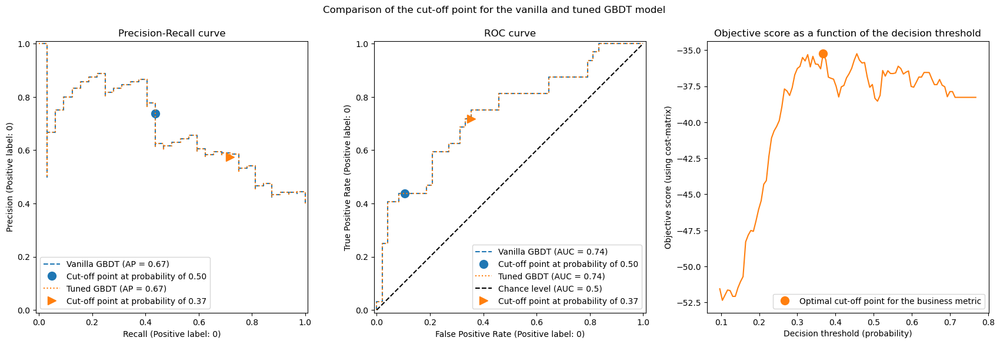

In [399]:
title = "Comparison of the cut-off point for the vanilla and tuned GBDT model"
plot_roc_pr_curves(mod_lhTT2_GB, tuned_model_lhTT2_GB, title=title)

In [400]:
print(f"Business defined metric: {scoring['credit_gain'](tuned_model_lhTT2_GB, X_test_lhTT2_GB, y_test_lhTT2_GB)}")

[[31 17]
 [ 9 23]]
Business defined metric: -48.43


In [401]:
sum(y_test_lhTT2_GB==0)

32

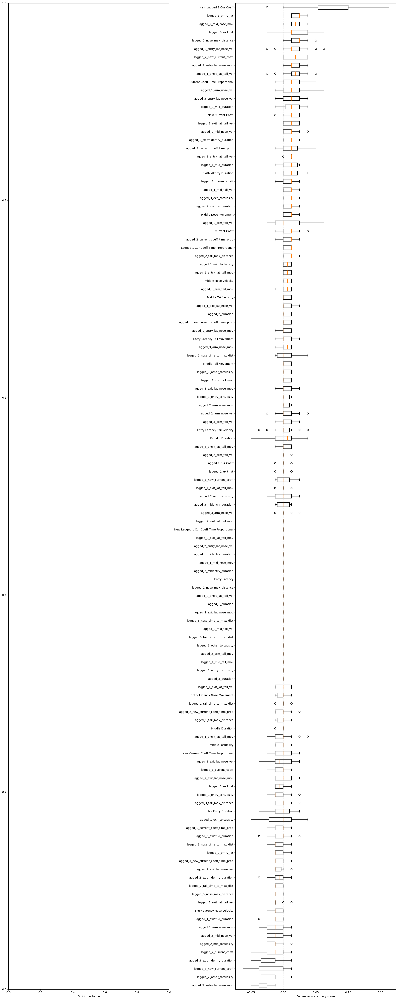

In [403]:
#mdi_importances_lhTT2_GB= pd.Series(tuned_model_lhTT2.feature_importances_, index=x_lowhigh_main.columns)
#tree_importance_sorted_idx_lhTT2_GB = np.argsort(tuned_model_lhTT2.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_lhTT2_GB.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(tuned_model_lhTT2, X_test_lhTT2_GB, y_test_lhTT2_GB, x_lowhigh_main,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

# _2(57) vs _3(111) - are 2s distinguishable from 3s?

In [7970]:
grouped_lagged_added_stats_ri_2 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']==2]

In [7971]:
grouped_lagged_added_stats_ri_2['Binary']=0

In [7972]:
grouped_lagged_added_stats_ri_3 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']==3]

In [7973]:
grouped_lagged_added_stats_ri_3['Binary']=1

In [7974]:
grouped_lagged_binary23 = pd.concat([grouped_lagged_added_stats_ri_2, grouped_lagged_added_stats_ri_3])

In [7975]:
grouped_lagged_binary23_ri = grouped_lagged_binary23.reset_index(drop=True)

In [7976]:
x_main_2v3= grouped_lagged_binary23_ri.drop(columns = ['Choice Output', 'Duration', 'Exit Latency', 
        'Nose Max Distance', 'Nose Time to Max Dist', 'Tail Base Max Distance', 'Tail Base Time to Max Dist', 'Entry Tortuosity', 'Exit Tortuosity',
        'Other Tortuosity', 'Arm Nose Movement', 'Arm Nose Velocity', 'Arm Tail Movement', 'Arm Tail Velocity',
       
        'lagged_1_lagged_1_cur_coeff',
       'lagged_2_lagged_1_cur_coeff', 'lagged_3_lagged_1_cur_coeff',
       'lagged_4_lagged_1_cur_coeff',
       'lagged_1_lagged_2_cur_coeff', 'lagged_2_lagged_2_cur_coeff',
       'lagged_3_lagged_2_cur_coeff', 'lagged_4_lagged_2_cur_coeff',
       'lagged_1_lagged_3_cur_coeff',
       'lagged_2_lagged_3_cur_coeff', 'lagged_3_lagged_3_cur_coeff',
       'lagged_4_lagged_3_cur_coeff', 
       'lagged_1_lagged_4_cur_coeff', 'lagged_2_lagged_4_cur_coeff',
       'lagged_3_lagged_4_cur_coeff', 'lagged_4_lagged_4_cur_coeff',
       
       
       'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop',
       'lagged_3_lagged_1_cur_coeff_time_prop',
       'lagged_4_lagged_1_cur_coeff_time_prop',
       
       'lagged_1_lagged_2_cur_coeff_time_prop',
       'lagged_2_lagged_2_cur_coeff_time_prop',
       'lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop',
       
       'lagged_1_lagged_3_cur_coeff_time_prop',
       'lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop',
       'lagged_4_lagged_3_cur_coeff_time_prop',
       
       'lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop',
       'lagged_3_lagged_4_cur_coeff_time_prop',
       'lagged_4_lagged_4_cur_coeff_time_prop',
                                                                                                             
                                                                                                             
        'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop','lagged_3_lagged_1_cur_coeff_time_prop','lagged_4_lagged_1_cur_coeff_time_prop',
       'lagged_1_lagged_2_cur_coeff_time_prop','lagged_2_lagged_2_cur_coeff_time_prop','lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop','lagged_1_lagged_3_cur_coeff_time_prop','lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop','lagged_4_lagged_3_cur_coeff_time_prop','lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop','lagged_3_lagged_4_cur_coeff_time_prop','lagged_4_lagged_4_cur_coeff_time_prop', 
        'Turn', 'lagged_1_turn_ago', 'lagged_2_turn_ago', 'lagged_3_turn_ago', 'lagged_4_turn_ago', 
        '2_cur_arm_duration', '3_cur_arm_duration', '4_cur_arm_duration',
       '5_cur_arm_duration', 'mean_2_cur_arm_duration',
       'mean_3_cur_arm_duration', 'mean_4_cur_arm_duration',
       'mean_5_cur_arm_duration', '2_past_arm_duration', '3_past_arm_duration',
       '4_past_arm_duration', 'mean_2_past_arm_duration',
       'mean_3_past_arm_duration', 'mean_4_past_arm_duration',
       '2_past_mid_duration', '3_past_mid_duration', '4_past_mid_duration',
       '5_past_mid_duration', 'mean_2_past_mid_duration',
       'mean_3_past_mid_duration', 'mean_4_past_mid_duration',
       'mean_5_past_mid_duration', '2_past_exitmid_duration',
       '3_past_exitmid_duration', '4_past_exitmid_duration',
       '5_past_exitmid_duration', 'mean_2_past_exitmid_duration',
       'mean_3_past_exitmid_duration', 'mean_4_past_exitmid_duration',
       'mean_5_past_exitmid_duration', '2_past_midentry_duration',
       '3_past_midentry_duration', '4_past_midentry_duration',
       '5_past_midentry_duration', 'mean_2_past_midentry_duration',
       'mean_3_past_midentry_duration', 'mean_4_past_midentry_duration',
       'mean_5_past_midentry_duration', '2_past_exitmidentry_duration',
       '3_past_exitmidentry_duration', '4_past_exitmidentry_duration',
       '5_past_exitmidentry_duration', 'mean_2_past_exitmidentry_duration',
       'mean_3_past_exitmidentry_duration',
       'mean_4_past_exitmidentry_duration',
       'mean_5_past_exitmidentry_duration',
                                                                                                               
        'lagged_1_choice_ago', 'lagged_2_choice_ago', 'lagged_3_choice_ago',
       'lagged_4_choice_ago',
        'lagged_1_new_lagged_1_cur_coeff',
        'lagged_2_new_lagged_1_cur_coeff', 
        'lagged_3_new_lagged_1_cur_coeff','lagged_4_new_lagged_1_cur_coeff','lagged_1_new_lagged_2_cur_coeff', 'lagged_2_new_lagged_2_cur_coeff', 
        'lagged_3_new_lagged_2_cur_coeff', 'lagged_4_new_lagged_2_cur_coeff','lagged_1_new_lagged_3_cur_coeff','lagged_2_new_lagged_3_cur_coeff', 
        'lagged_3_new_lagged_3_cur_coeff','lagged_4_new_lagged_3_cur_coeff','lagged_1_new_lagged_4_cur_coeff', 'lagged_2_new_lagged_4_cur_coeff',
        'lagged_3_new_lagged_4_cur_coeff', 'lagged_4_new_lagged_4_cur_coeff','lagged_1_new_lagged_1_cur_coeff_time_prop',
       'lagged_2_new_lagged_1_cur_coeff_time_prop','lagged_3_new_lagged_1_cur_coeff_time_prop','lagged_4_new_lagged_1_cur_coeff_time_prop',
       'lagged_1_new_lagged_2_cur_coeff_time_prop','lagged_2_new_lagged_2_cur_coeff_time_prop','lagged_3_new_lagged_2_cur_coeff_time_prop',
       'lagged_4_new_lagged_2_cur_coeff_time_prop','lagged_1_new_lagged_3_cur_coeff_time_prop','lagged_2_new_lagged_3_cur_coeff_time_prop',
       'lagged_3_new_lagged_3_cur_coeff_time_prop','lagged_4_new_lagged_3_cur_coeff_time_prop','lagged_1_new_lagged_4_cur_coeff_time_prop',
       'lagged_2_new_lagged_4_cur_coeff_time_prop','lagged_3_new_lagged_4_cur_coeff_time_prop','lagged_4_new_lagged_4_cur_coeff_time_prop',
        'Exit Latency Nose Movement', 'Exit Latency Nose Velocity', 'Exit Latency Tail Movement', 'Exit Latency Tail Velocity',
        'lagged_3_mid_duration', 'lagged_4_mid_duration', 'lagged_3_mid_nose_mov',
       'lagged_4_mid_nose_mov', 'lagged_3_mid_nose_vel', 'lagged_4_mid_nose_vel', 'lagged_3_mid_tail_mov',
       'lagged_4_mid_tail_mov', 'lagged_3_mid_tail_vel', 'lagged_4_mid_tail_vel', 'lagged_3_mid_tortuosity', 'lagged_4_mid_tortuosity',                                              
         'lagged_4_current_coeff', 'Lagged 3 Cur Coeff', 'Lagged 4 Cur Coeff', 
        'lagged_4_new_current_coeff',  'New Lagged 3 Cur Coeff', 'New Lagged 4 Cur Coeff',                                          
        'lagged_4_current_coeff_time_prop', 'Lagged 3 Cur Coeff Time Proportional',                                               
         'Lagged 4 Cur Coeff Time Proportional',
       'lagged_4_new_current_coeff_time_prop', 'New Lagged 3 Cur Coeff Time Proportional',  'New Lagged 4 Cur Coeff Time Proportional',                                            
       'lagged_3_entry_lat',
       'lagged_4_entry_lat', 'lagged_4_entry_lat_nose_mov',
       'lagged_4_entry_lat_nose_vel', 'lagged_4_entry_lat_tail_mov',
       'lagged_4_entry_lat_tail_vel', 'lagged_4_duration',
       'lagged_4_nose_max_distance', 'lagged_4_nose_time_to_max_dist',
       'lagged_4_tail_max_distance', 'lagged_4_tail_time_to_max_dist',                                         
       'lagged_4_arm_nose_mov', 'lagged_4_arm_nose_vel',                                                 
        'lagged_3_arm_tail_mov', 'lagged_4_arm_tail_mov', 'lagged_4_arm_tail_vel',
       'lagged_4_entry_tortuosity', 'lagged_4_exit_tortuosity',
       'lagged_4_other_tortuosity', 'lagged_4_exit_lat',
       'lagged_4_exit_lat_nose_mov', 'lagged_4_exit_lat_nose_vel',
       'lagged_4_exit_lat_tail_mov', 'lagged_4_exit_lat_tail_vel',
       'lagged_4_exitmid_duration', 'lagged_4_midentry_duration',
       'lagged_4_exitmidentry_duration', 'Binary',
       'Lagged 2 Cur Coeff',  'New Lagged 2 Cur Coeff', 'Lagged 2 Cur Coeff Time Proportional', 'New Lagged 2 Cur Coeff Time Proportional',                                             
       'Lagged 1 Cur Coeff','New Lagged 1 Cur Coeff', 'Lagged 1 Cur Coeff Time Proportional','New Lagged 1 Cur Coeff Time Proportional'                                                 
                                                        ])


In [7977]:
x_2v3 = x_main_2v3.values

In [7978]:
y_2v3 = grouped_lagged_binary23_ri['Binary'].values

In [7979]:
X_train_2v3, X_test_2v3, y_train_2v3, y_test_2v3 = train_test_split(x_2v3, y_2v3, test_size=0.2, random_state=5)

In [7980]:
mod_2v3 =  HistGradientBoostingClassifier(learning_rate = 0.1, validation_fraction=0.1, n_iter_no_change=20, random_state=54)
mod_2v3.fit(X_train_2v3, y_train_2v3)
y_pred_2v3=mod_2v3.predict(X_test_2v3)

In [7981]:
mod_2v3.n_iter_

100

In [7982]:
target_names = ['0', '1']

In [7983]:
f1_sc_2v3 = f1_score(y_test_2v3, y_pred_2v3, average = 'weighted')
f1_sc_2v3

0.6336898395721926

In [7984]:
p_sc_2v3 = precision_score(y_test_2v3, y_pred_2v3, average = 'weighted')
p_sc_2v3

0.6392156862745099

In [7985]:
cf_matrix_2v3 = confusion_matrix(y_test_2v3, y_pred_2v3)
cf_matrix_2v3

array([[ 6,  8],
       [ 4, 16]], dtype=int64)

In [7986]:
print(classification_report(y_test_2v3, y_pred_2v3, target_names=target_names))

              precision    recall  f1-score   support

           0       0.60      0.43      0.50        14
           1       0.67      0.80      0.73        20

    accuracy                           0.65        34
   macro avg       0.63      0.61      0.61        34
weighted avg       0.64      0.65      0.63        34



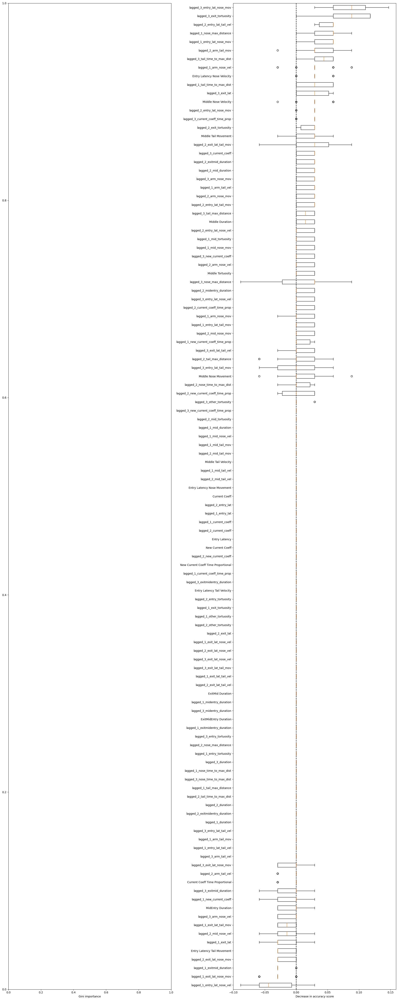

In [7987]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(mod_2v3, X_test_2v3, y_test_2v3, x_main_2v3,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

In [7988]:
# try tuning part2

In [7989]:
X_train_2v3TT2, X_test_2v3TT2, y_train_2v3TT2, y_test_2v3TT2 = train_test_split(x_2v3, y_2v3, stratify=y_2v3, random_state=55)

In [7990]:
pos_label, neg_label = 0,1 # dont want to misclassify lows as highs

In [7991]:
def fpr_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    tn, fp, _, _ = cm.ravel()
    tnr = tn / (tn + fp)
    return 1 - tnr

In [7992]:
from sklearn.metrics import make_scorer, precision_score, recall_score

In [7993]:
tpr_score = recall_score  # TPR and recall are the same metric
scoring = {
    "precision": make_scorer(precision_score, pos_label=pos_label),
    "recall": make_scorer(recall_score, pos_label=pos_label),
    "fpr": make_scorer(fpr_score, neg_label=neg_label, pos_label=pos_label),
    "tpr": make_scorer(tpr_score, pos_label=pos_label),
}

In [7994]:
def credit_gain_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    gain_matrix = np.array(
        [
            [0, -3.5],  # -1 gain for false positives (when a high is classified as low)
            [-6, 0],  # -5 gain for false negatives (when a low is classified as high)
        ]
    )
    return np.sum(cm * gain_matrix)


scoring["credit_gain"] = make_scorer(
    credit_gain_score, neg_label=neg_label, pos_label=pos_label
)

In [7995]:
mod_2v3TT2 = HistGradientBoostingClassifier(learning_rate = 0.025, n_iter_no_change=20, random_state=57)

In [7996]:
mod_2v3TT2.fit(X_train_2v3TT2, y_train_2v3TT2)

HistGradientBoostingClassifier(learning_rate=0.025, n_iter_no_change=20,
                               random_state=57)

[[24  4]
 [ 9  5]]


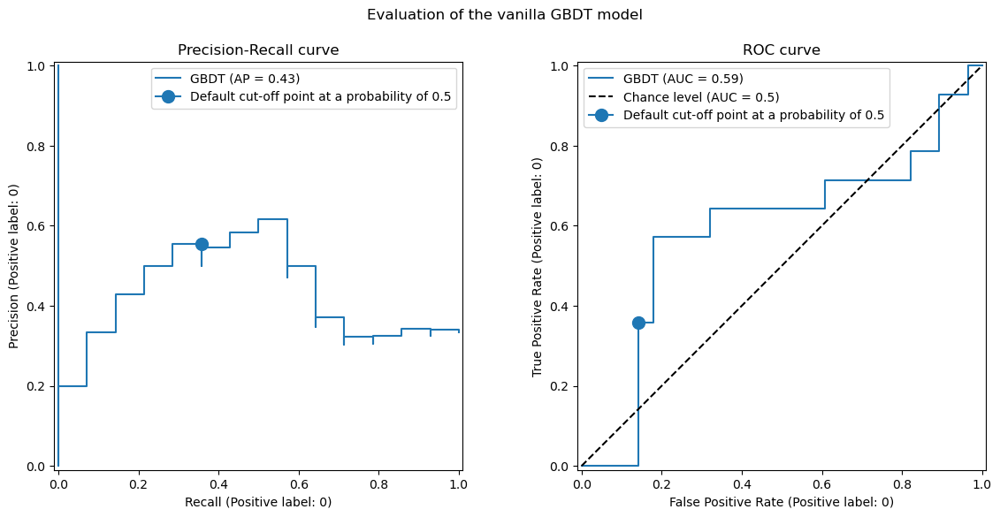

In [7997]:
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

PrecisionRecallDisplay.from_estimator(
    mod_2v3TT2, X_test_2v3TT2, y_test_2v3TT2, pos_label=pos_label, ax=axs[0], name="GBDT"
)
axs[0].plot(
    scoring["recall"](mod_2v3TT2, X_test_2v3TT2, y_test_2v3TT2),
    scoring["precision"](mod_2v3TT2, X_test_2v3TT2, y_test_2v3TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[0].set_title("Precision-Recall curve")
axs[0].legend()

RocCurveDisplay.from_estimator(
    mod_2v3TT2,
    X_test_2v3TT2,
    y_test_2v3TT2,
    pos_label=pos_label,
    ax=axs[1],
    name="GBDT",
    plot_chance_level=True,
)
axs[1].plot(
    scoring["fpr"](mod_2v3TT2, X_test_2v3TT2, y_test_2v3TT2),
    scoring["tpr"](mod_2v3TT2, X_test_2v3TT2, y_test_2v3TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[1].set_title("ROC curve")
axs[1].legend()
_ = fig.suptitle("Evaluation of the vanilla GBDT model")

In [7998]:
sum(y_test_2v3TT2==1)

28

In [7999]:
print(f"Business defined metric: {scoring['credit_gain'](mod_2v3TT2, X_test_2v3TT2, y_test_2v3TT2)}")

[[24  4]
 [ 9  5]]
Business defined metric: -68.0


In [8000]:
from sklearn.model_selection import TunedThresholdClassifierCV

In [8001]:
tuned_model_2v3TT2 = TunedThresholdClassifierCV(
    estimator=mod_2v3TT2,
    scoring=scoring["credit_gain"],
    store_cv_results=True,  # necessary to inspect all results
)
tuned_model_2v3TT2.fit(X_train_2v3TT2, y_train_2v3TT2)
print(f"{tuned_model_2v3TT2.best_threshold_=:0.2f}")

[[ 0 17]
 [ 0  9]]
[[ 2 15]
 [ 0  9]]
[[ 2 15]
 [ 0  9]]
[[ 2 15]
 [ 0  9]]
[[ 3 14]
 [ 0  9]]
[[ 4 13]
 [ 0  9]]
[[ 4 13]
 [ 0  9]]
[[ 4 13]
 [ 0  9]]
[[ 5 12]
 [ 0  9]]
[[ 6 11]
 [ 0  9]]
[[ 6 11]
 [ 1  8]]
[[ 6 11]
 [ 1  8]]
[[ 7 10]
 [ 1  8]]
[[ 7 10]
 [ 1  8]]
[[ 7 10]
 [ 1  8]]
[[ 7 10]
 [ 1  8]]
[[ 7 10]
 [ 1  8]]
[[ 7 10]
 [ 1  8]]
[[ 7 10]
 [ 1  8]]
[[ 7 10]
 [ 1  8]]
[[ 7 10]
 [ 1  8]]
[[8 9]
 [1 8]]
[[8 9]
 [1 8]]
[[9 8]
 [1 8]]
[[9 8]
 [1 8]]
[[9 8]
 [1 8]]
[[9 8]
 [1 8]]
[[10  7]
 [ 1  8]]
[[10  7]
 [ 1  8]]
[[10  7]
 [ 1  8]]
[[11  6]
 [ 1  8]]
[[11  6]
 [ 1  8]]
[[11  6]
 [ 2  7]]
[[11  6]
 [ 2  7]]
[[11  6]
 [ 2  7]]
[[11  6]
 [ 2  7]]
[[11  6]
 [ 2  7]]
[[11  6]
 [ 2  7]]
[[11  6]
 [ 2  7]]
[[12  5]
 [ 3  6]]
[[12  5]
 [ 3  6]]
[[12  5]
 [ 3  6]]
[[13  4]
 [ 3  6]]
[[13  4]
 [ 3  6]]
[[13  4]
 [ 3  6]]
[[13  4]
 [ 4  5]]
[[13  4]
 [ 4  5]]
[[13  4]
 [ 4  5]]
[[13  4]
 [ 4  5]]
[[13  4]
 [ 4  5]]
[[13  4]
 [ 4  5]]
[[13  4]
 [ 4  5]]
[[13  4]
 [ 4  5]]
[[13  4]
 [ 5  4]

In [8002]:
def plot_roc_pr_curves(vanilla_model, tuned_model, *, title):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(21, 6))

    linestyles = ("dashed", "dotted")
    markerstyles = ("o", ">")
    colors = ("tab:blue", "tab:orange")
    names = ("Vanilla GBDT", "Tuned GBDT")
    for idx, (est, linestyle, marker, color, name) in enumerate(
        zip((vanilla_model, tuned_model), linestyles, markerstyles, colors, names)
    ):
        decision_threshold = getattr(est, "best_threshold_", 0.5)
        PrecisionRecallDisplay.from_estimator(
            est,
            X_test_2v3TT2,
            y_test_2v3TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[0],
            name=name,
        )
        axs[0].plot(
            scoring["recall"](est, X_test_2v3TT2, y_test_2v3TT2),
            scoring["precision"](est, X_test_2v3TT2, y_test_2v3TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )
        RocCurveDisplay.from_estimator(
            est,
            X_test_2v3TT2,
            y_test_2v3TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[1],
            name=name,
            plot_chance_level=idx == 1,
        )
        axs[1].plot(
            scoring["fpr"](est, X_test_2v3TT2, y_test_2v3TT2),
            scoring["tpr"](est, X_test_2v3TT2, y_test_2v3TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )

    axs[0].set_title("Precision-Recall curve")
    axs[0].legend()
    axs[1].set_title("ROC curve")
    axs[1].legend()

    axs[2].plot(
        tuned_model.cv_results_["thresholds"],
        tuned_model.cv_results_["scores"],
        color="tab:orange",
    )
    axs[2].plot(
        tuned_model.best_threshold_,
        tuned_model.best_score_,
        "o",
        markersize=10,
        color="tab:orange",
        label="Optimal cut-off point for the business metric",
    )
    axs[2].legend()
    axs[2].set_xlabel("Decision threshold (probability)")
    axs[2].set_ylabel("Objective score (using cost-matrix)")
    axs[2].set_title("Objective score as a function of the decision threshold")
    fig.suptitle(title)

[[24  4]
 [ 9  5]]
[[18 10]
 [ 5  9]]


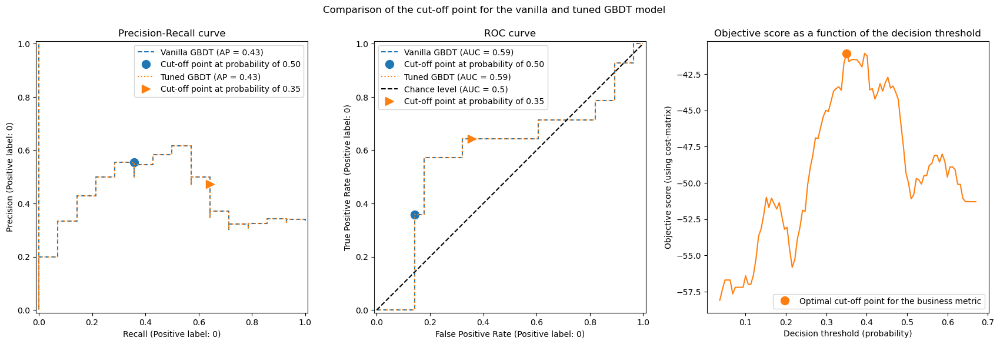

In [8003]:
title = "Comparison of the cut-off point for the vanilla and tuned GBDT model"
plot_roc_pr_curves(mod_2v3TT2, tuned_model_2v3TT2, title=title)

In [8004]:
print(f"Business defined metric: {scoring['credit_gain'](tuned_model_2v3TT2, X_test_2v3TT2, y_test_2v3TT2)}")

[[18 10]
 [ 5  9]]
Business defined metric: -65.0


In [8005]:
sum(y_test_2v3TT2==0)

14

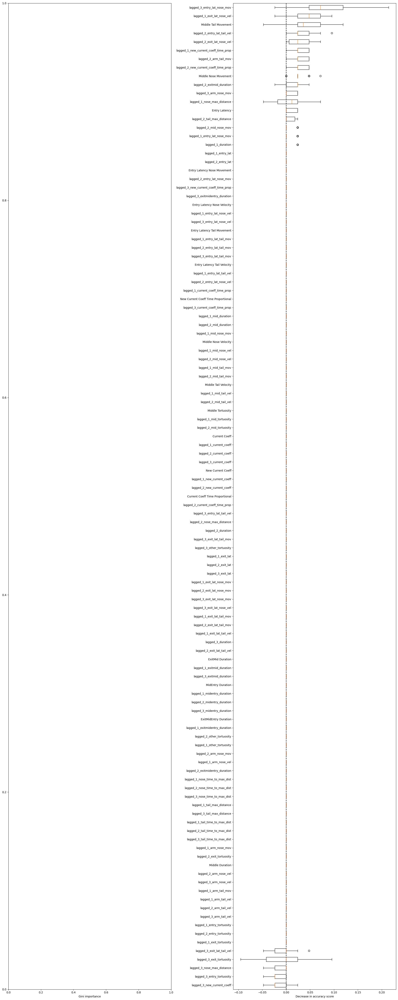

In [8006]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(tuned_model_2v3TT2, X_test_2v3TT2, y_test_2v3TT2, x_main_2v3,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

# _2(57) vs _3(70) - are 2s distinguishable from 3s? - excluding 23

In [5940]:
grouped_lagged_added_stats_ri_2 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']==2]

In [5941]:
grouped_lagged_added_stats_ri_2['Binary']=0

In [5959]:
grouped_lagged_added_stats_ri_e3 = grouped_lagged_added_stats_ri.iloc[:,:][(grouped_lagged_added_stats_ri['Choice Output']==3)&(grouped_lagged_added_stats_ri['lagged_1_choice_ago']>2)]

In [5943]:
grouped_lagged_added_stats_ri_e3['Binary']=1

In [5944]:
grouped_lagged_binary2e3 = pd.concat([grouped_lagged_added_stats_ri_2, grouped_lagged_added_stats_ri_e3])

In [5945]:
grouped_lagged_binary2e3_ri = grouped_lagged_binary2e3.reset_index(drop=True)

In [5947]:
x_main_2e3= grouped_lagged_binary2e3_ri.drop(columns = ['Choice Output', 'Duration', 'Exit Latency', 
        'Nose Max Distance', 'Nose Time to Max Dist', 'Tail Base Max Distance', 'Tail Base Time to Max Dist', 'Entry Tortuosity', 'Exit Tortuosity',
        'Other Tortuosity', 'Arm Nose Movement', 'Arm Nose Velocity', 'Arm Tail Movement', 'Arm Tail Velocity',
       
        'lagged_1_lagged_1_cur_coeff',
       'lagged_2_lagged_1_cur_coeff', 'lagged_3_lagged_1_cur_coeff',
       'lagged_4_lagged_1_cur_coeff',
       'lagged_1_lagged_2_cur_coeff', 'lagged_2_lagged_2_cur_coeff',
       'lagged_3_lagged_2_cur_coeff', 'lagged_4_lagged_2_cur_coeff',
       'lagged_1_lagged_3_cur_coeff',
       'lagged_2_lagged_3_cur_coeff', 'lagged_3_lagged_3_cur_coeff',
       'lagged_4_lagged_3_cur_coeff', 
       'lagged_1_lagged_4_cur_coeff', 'lagged_2_lagged_4_cur_coeff',
       'lagged_3_lagged_4_cur_coeff', 'lagged_4_lagged_4_cur_coeff',
       
       
       'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop',
       'lagged_3_lagged_1_cur_coeff_time_prop',
       'lagged_4_lagged_1_cur_coeff_time_prop',
       
       'lagged_1_lagged_2_cur_coeff_time_prop',
       'lagged_2_lagged_2_cur_coeff_time_prop',
       'lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop',
       
       'lagged_1_lagged_3_cur_coeff_time_prop',
       'lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop',
       'lagged_4_lagged_3_cur_coeff_time_prop',
       
       'lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop',
       'lagged_3_lagged_4_cur_coeff_time_prop',
       'lagged_4_lagged_4_cur_coeff_time_prop',
                                                                                                             
                                                                                                             
        'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop','lagged_3_lagged_1_cur_coeff_time_prop','lagged_4_lagged_1_cur_coeff_time_prop',
       'lagged_1_lagged_2_cur_coeff_time_prop','lagged_2_lagged_2_cur_coeff_time_prop','lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop','lagged_1_lagged_3_cur_coeff_time_prop','lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop','lagged_4_lagged_3_cur_coeff_time_prop','lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop','lagged_3_lagged_4_cur_coeff_time_prop','lagged_4_lagged_4_cur_coeff_time_prop', 
        'Turn', 'lagged_1_turn_ago', 'lagged_2_turn_ago', 'lagged_3_turn_ago', 'lagged_4_turn_ago', 
        '2_cur_arm_duration', '3_cur_arm_duration', '4_cur_arm_duration',
       '5_cur_arm_duration', 'mean_2_cur_arm_duration',
       'mean_3_cur_arm_duration', 'mean_4_cur_arm_duration',
       'mean_5_cur_arm_duration', '2_past_arm_duration', '3_past_arm_duration',
       '4_past_arm_duration', 'mean_2_past_arm_duration',
       'mean_3_past_arm_duration', 'mean_4_past_arm_duration',
       '2_past_mid_duration', '3_past_mid_duration', '4_past_mid_duration',
       '5_past_mid_duration', 'mean_2_past_mid_duration',
       'mean_3_past_mid_duration', 'mean_4_past_mid_duration',
       'mean_5_past_mid_duration', '2_past_exitmid_duration',
       '3_past_exitmid_duration', '4_past_exitmid_duration',
       '5_past_exitmid_duration', 'mean_2_past_exitmid_duration',
       'mean_3_past_exitmid_duration', 'mean_4_past_exitmid_duration',
       'mean_5_past_exitmid_duration', '2_past_midentry_duration',
       '3_past_midentry_duration', '4_past_midentry_duration',
       '5_past_midentry_duration', 'mean_2_past_midentry_duration',
       'mean_3_past_midentry_duration', 'mean_4_past_midentry_duration',
       'mean_5_past_midentry_duration', '2_past_exitmidentry_duration',
       '3_past_exitmidentry_duration', '4_past_exitmidentry_duration',
       '5_past_exitmidentry_duration', 'mean_2_past_exitmidentry_duration',
       'mean_3_past_exitmidentry_duration',
       'mean_4_past_exitmidentry_duration',
       'mean_5_past_exitmidentry_duration',
                                                                                                               
        'lagged_1_choice_ago', 'lagged_2_choice_ago', 'lagged_3_choice_ago',
       'lagged_4_choice_ago',
        'lagged_1_new_lagged_1_cur_coeff',
        'lagged_2_new_lagged_1_cur_coeff', 
        'lagged_3_new_lagged_1_cur_coeff','lagged_4_new_lagged_1_cur_coeff','lagged_1_new_lagged_2_cur_coeff', 'lagged_2_new_lagged_2_cur_coeff', 
        'lagged_3_new_lagged_2_cur_coeff', 'lagged_4_new_lagged_2_cur_coeff','lagged_1_new_lagged_3_cur_coeff','lagged_2_new_lagged_3_cur_coeff', 
        'lagged_3_new_lagged_3_cur_coeff','lagged_4_new_lagged_3_cur_coeff','lagged_1_new_lagged_4_cur_coeff', 'lagged_2_new_lagged_4_cur_coeff',
        'lagged_3_new_lagged_4_cur_coeff', 'lagged_4_new_lagged_4_cur_coeff','lagged_1_new_lagged_1_cur_coeff_time_prop',
       'lagged_2_new_lagged_1_cur_coeff_time_prop','lagged_3_new_lagged_1_cur_coeff_time_prop','lagged_4_new_lagged_1_cur_coeff_time_prop',
       'lagged_1_new_lagged_2_cur_coeff_time_prop','lagged_2_new_lagged_2_cur_coeff_time_prop','lagged_3_new_lagged_2_cur_coeff_time_prop',
       'lagged_4_new_lagged_2_cur_coeff_time_prop','lagged_1_new_lagged_3_cur_coeff_time_prop','lagged_2_new_lagged_3_cur_coeff_time_prop',
       'lagged_3_new_lagged_3_cur_coeff_time_prop','lagged_4_new_lagged_3_cur_coeff_time_prop','lagged_1_new_lagged_4_cur_coeff_time_prop',
       'lagged_2_new_lagged_4_cur_coeff_time_prop','lagged_3_new_lagged_4_cur_coeff_time_prop','lagged_4_new_lagged_4_cur_coeff_time_prop',
        'Exit Latency Nose Movement', 'Exit Latency Nose Velocity', 'Exit Latency Tail Movement', 'Exit Latency Tail Velocity',
        'lagged_3_mid_duration', 'lagged_4_mid_duration', 'lagged_3_mid_nose_mov',
       'lagged_4_mid_nose_mov', 'lagged_3_mid_nose_vel', 'lagged_4_mid_nose_vel', 'lagged_3_mid_tail_mov',
       'lagged_4_mid_tail_mov', 'lagged_3_mid_tail_vel', 'lagged_4_mid_tail_vel', 'lagged_3_mid_tortuosity', 'lagged_4_mid_tortuosity',                                              
         'lagged_4_current_coeff', 'Lagged 3 Cur Coeff', 'Lagged 4 Cur Coeff', 
        'lagged_4_new_current_coeff',  'New Lagged 3 Cur Coeff', 'New Lagged 4 Cur Coeff',                                          
        'lagged_4_current_coeff_time_prop', 'Lagged 3 Cur Coeff Time Proportional',                                               
         'Lagged 4 Cur Coeff Time Proportional',
       'lagged_4_new_current_coeff_time_prop', 'New Lagged 3 Cur Coeff Time Proportional',  'New Lagged 4 Cur Coeff Time Proportional',                                            
       'lagged_3_entry_lat',
       'lagged_4_entry_lat', 'lagged_4_entry_lat_nose_mov',
       'lagged_4_entry_lat_nose_vel', 'lagged_4_entry_lat_tail_mov',
       'lagged_4_entry_lat_tail_vel', 'lagged_4_duration',
       'lagged_4_nose_max_distance', 'lagged_4_nose_time_to_max_dist',
       'lagged_4_tail_max_distance', 'lagged_4_tail_time_to_max_dist',                                         
       'lagged_4_arm_nose_mov', 'lagged_4_arm_nose_vel',                                                 
        'lagged_3_arm_tail_mov', 'lagged_4_arm_tail_mov', 'lagged_4_arm_tail_vel',
       'lagged_4_entry_tortuosity', 'lagged_4_exit_tortuosity',
       'lagged_4_other_tortuosity', 'lagged_4_exit_lat',
       'lagged_4_exit_lat_nose_mov', 'lagged_4_exit_lat_nose_vel',
       'lagged_4_exit_lat_tail_mov', 'lagged_4_exit_lat_tail_vel',
       'lagged_4_exitmid_duration', 'lagged_4_midentry_duration',
       'lagged_4_exitmidentry_duration', 'Binary',
       'Lagged 2 Cur Coeff',  'New Lagged 2 Cur Coeff', 'Lagged 2 Cur Coeff Time Proportional', 'New Lagged 2 Cur Coeff Time Proportional',                                             
        'Lagged 1 Cur Coeff','New Lagged 1 Cur Coeff', 'Lagged 1 Cur Coeff Time Proportional','New Lagged 1 Cur Coeff Time Proportional'                                                
                                                        ])


In [5948]:
x_main_2e3.columns[:100]

Index(['Middle Duration', 'lagged_1_mid_duration', 'lagged_2_mid_duration',
       'Middle Nose Movement', 'lagged_1_mid_nose_mov',
       'lagged_2_mid_nose_mov', 'Middle Nose Velocity',
       'lagged_1_mid_nose_vel', 'lagged_2_mid_nose_vel',
       'Middle Tail Movement', 'lagged_1_mid_tail_mov',
       'lagged_2_mid_tail_mov', 'Middle Tail Velocity',
       'lagged_1_mid_tail_vel', 'lagged_2_mid_tail_vel', 'Middle Tortuosity',
       'lagged_1_mid_tortuosity', 'lagged_2_mid_tortuosity', 'Current Coeff',
       'lagged_1_current_coeff', 'lagged_2_current_coeff',
       'lagged_3_current_coeff', 'New Current Coeff',
       'lagged_1_new_current_coeff', 'lagged_2_new_current_coeff',
       'lagged_3_new_current_coeff', 'Current Coeff Time Proportional',
       'lagged_1_current_coeff_time_prop', 'lagged_2_current_coeff_time_prop',
       'lagged_3_current_coeff_time_prop',
       'New Current Coeff Time Proportional',
       'lagged_1_new_current_coeff_time_prop',
       'lagged_2_new

In [5949]:
x_2e3 = x_main_2e3.values

In [5950]:
y_2e3 = grouped_lagged_binary2e3_ri['Binary'].values

In [5951]:
X_train_2e3, X_test_2e3, y_train_2e3, y_test_2e3 = train_test_split(x_2e3, y_2e3, test_size=0.2, random_state=5)

In [5987]:
mod_2e3 =  HistGradientBoostingClassifier(learning_rate = 0.12, validation_fraction=0.1, n_iter_no_change=20, random_state=54)
mod_2e3.fit(X_train_2e3, y_train_2e3)
y_pred_2e3=mod_2e3.predict(X_test_2e3)

In [5988]:
mod_2e3.n_iter_

100

In [5989]:
target_names = ['0', '1']

In [5990]:
f1_sc_2e3 = f1_score(y_test_2e3, y_pred_2e3, average = 'weighted')
f1_sc_2e3

0.724714565794026

In [5991]:
p_sc_2e3 = precision_score(y_test_2e3, y_pred_2e3, average = 'weighted')
p_sc_2e3

0.7772750125691302

In [5992]:
cf_matrix_2e3 = confusion_matrix(y_test_2e3, y_pred_2e3)
cf_matrix_2e3

array([[ 8,  6],
       [ 1, 11]], dtype=int64)

In [5993]:
print(classification_report(y_test_2e3, y_pred_2e3, target_names=target_names))

              precision    recall  f1-score   support

           0       0.89      0.57      0.70        14
           1       0.65      0.92      0.76        12

    accuracy                           0.73        26
   macro avg       0.77      0.74      0.73        26
weighted avg       0.78      0.73      0.72        26



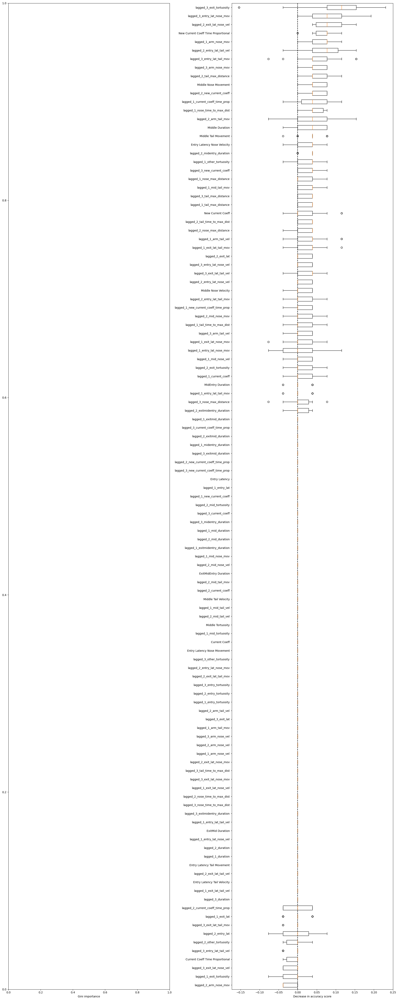

In [5994]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(mod_2e3, X_test_2e3, y_test_2e3, x_main_2e3,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

In [5995]:
# try tuning part2

In [5996]:
X_train_2e3TT2, X_test_2e3TT2, y_train_2e3TT2, y_test_2e3TT2 = train_test_split(x_2e3, y_2e3, stratify=y_2e3, random_state=55)

In [5997]:
pos_label, neg_label = 0,1 # dont want to misclassify lows as highs

In [5998]:
def fpr_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    tn, fp, _, _ = cm.ravel()
    tnr = tn / (tn + fp)
    return 1 - tnr

In [5999]:
from sklearn.metrics import make_scorer, precision_score, recall_score

In [6000]:
tpr_score = recall_score  # TPR and recall are the same metric
scoring = {
    "precision": make_scorer(precision_score, pos_label=pos_label),
    "recall": make_scorer(recall_score, pos_label=pos_label),
    "fpr": make_scorer(fpr_score, neg_label=neg_label, pos_label=pos_label),
    "tpr": make_scorer(tpr_score, pos_label=pos_label),
}

In [6391]:
def credit_gain_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    gain_matrix = np.array(
        [
            [0, -7],  # -1 gain for false positives (when a high is classified as low)
            [-9, 0],  # -5 gain for false negatives (when a low is classified as high)
        ]
    )
    return np.sum(cm * gain_matrix)


scoring["credit_gain"] = make_scorer(
    credit_gain_score, neg_label=neg_label, pos_label=pos_label
)

In [6401]:
mod_2e3TT2 = HistGradientBoostingClassifier(learning_rate = 0.028, n_iter_no_change=20, random_state=57)

In [6402]:
mod_2e3TT2.fit(X_train_2e3TT2, y_train_2e3TT2)

HistGradientBoostingClassifier(learning_rate=0.028, n_iter_no_change=20,
                               random_state=57)

[[10  8]
 [ 5  9]]


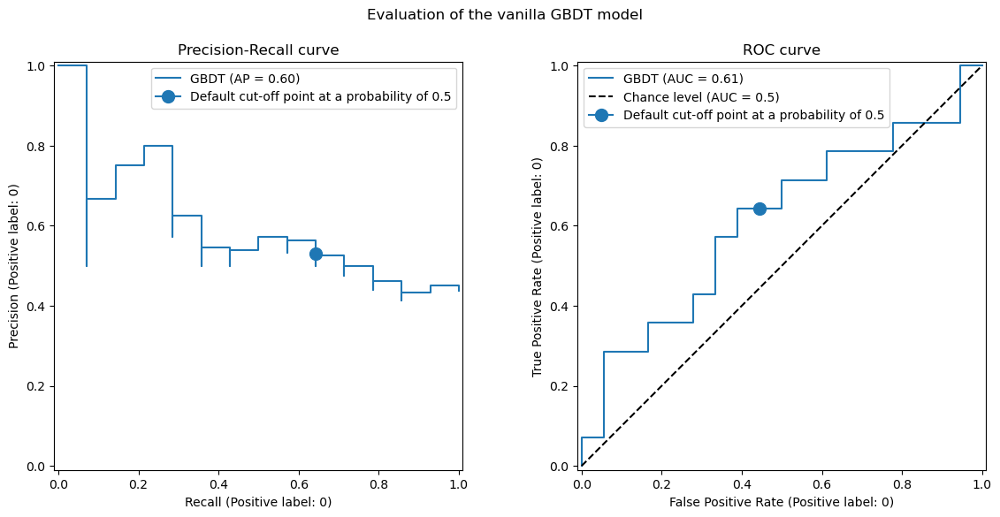

In [6403]:
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

PrecisionRecallDisplay.from_estimator(
    mod_2e3TT2, X_test_2e3TT2, y_test_2e3TT2, pos_label=pos_label, ax=axs[0], name="GBDT"
)
axs[0].plot(
    scoring["recall"](mod_2e3TT2, X_test_2e3TT2, y_test_2e3TT2),
    scoring["precision"](mod_2e3TT2, X_test_2e3TT2, y_test_2e3TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[0].set_title("Precision-Recall curve")
axs[0].legend()

RocCurveDisplay.from_estimator(
    mod_2e3TT2,
    X_test_2e3TT2,
    y_test_2e3TT2,
    pos_label=pos_label,
    ax=axs[1],
    name="GBDT",
    plot_chance_level=True,
)
axs[1].plot(
    scoring["fpr"](mod_2e3TT2, X_test_2e3TT2, y_test_2e3TT2),
    scoring["tpr"](mod_2e3TT2, X_test_2e3TT2, y_test_2e3TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[1].set_title("ROC curve")
axs[1].legend()
_ = fig.suptitle("Evaluation of the vanilla GBDT model")

In [6404]:
sum(y_test_2e3TT2==1)

18

In [6405]:
print(f"Business defined metric: {scoring['credit_gain'](mod_2e3TT2, X_test_2e3TT2, y_test_2e3TT2)}")

[[10  8]
 [ 5  9]]
Business defined metric: -101


In [6406]:
from sklearn.model_selection import TunedThresholdClassifierCV

In [6407]:
tuned_model_2e3TT2 = TunedThresholdClassifierCV(
    estimator=mod_2e3TT2,
    scoring=scoring["credit_gain"],
    store_cv_results=True,  # necessary to inspect all results
)
tuned_model_2e3TT2.fit(X_train_2e3TT2, y_train_2e3TT2)
print(f"{tuned_model_2e3TT2.best_threshold_=:0.2f}")

[[ 0 11]
 [ 0  8]]
[[ 1 10]
 [ 0  8]]
[[ 1 10]
 [ 0  8]]
[[2 9]
 [0 8]]
[[2 9]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[3 8]
 [0 8]]
[[4 7]
 [0 8]]
[[4 7]
 [0 8]]
[[4 7]
 [0 8]]
[[4 7]
 [0 8]]
[[4 7]
 [0 8]]
[[4 7]
 [0 8]]
[[4 7]
 [0 8]]
[[4 7]
 [1 7]]
[[4 7]
 [1 7]]
[[4 7]
 [1 7]]
[[4 7]
 [1 7]]
[[4 7]
 [1 7]]
[[4 7]
 [1 7]]
[[4 7]
 [1 7]]
[[5 6]
 [1 7]]
[[5 6]
 [1 7]]
[[6 5]
 [1 7]]
[[6 5]
 [2 6]]
[[6 5]
 [3 5]]
[[6 5]
 [3 5]]
[[6 5]
 [3 5]]
[[6 5]
 [3 5]]
[[6 5]
 [3 5]]
[[6 5]
 [3 5]]
[[6 5]
 [3 5]]
[[6 5]
 [3 5]]
[[6 5]
 [3 5]]
[[7 4]
 [3 5]]
[[7 4]
 [3 5]]
[[7 4]
 [3 5]]
[[7 4]
 [3 5]]
[[7 4]
 [3 5]]
[[7 4]
 [3 5]]
[[8 3]
 [3 5]

In [6408]:
def plot_roc_pr_curves(vanilla_model, tuned_model, *, title):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(21, 6))

    linestyles = ("dashed", "dotted")
    markerstyles = ("o", ">")
    colors = ("tab:blue", "tab:orange")
    names = ("Vanilla GBDT", "Tuned GBDT")
    for idx, (est, linestyle, marker, color, name) in enumerate(
        zip((vanilla_model, tuned_model), linestyles, markerstyles, colors, names)
    ):
        decision_threshold = getattr(est, "best_threshold_", 0.5)
        PrecisionRecallDisplay.from_estimator(
            est,
            X_test_2e3TT2,
            y_test_2e3TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[0],
            name=name,
        )
        axs[0].plot(
            scoring["recall"](est, X_test_2e3TT2, y_test_2e3TT2),
            scoring["precision"](est, X_test_2e3TT2, y_test_2e3TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )
        RocCurveDisplay.from_estimator(
            est,
            X_test_2e3TT2,
            y_test_2e3TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[1],
            name=name,
            plot_chance_level=idx == 1,
        )
        axs[1].plot(
            scoring["fpr"](est, X_test_2e3TT2, y_test_2e3TT2),
            scoring["tpr"](est, X_test_2e3TT2, y_test_2e3TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )

    axs[0].set_title("Precision-Recall curve")
    axs[0].legend()
    axs[1].set_title("ROC curve")
    axs[1].legend()

    axs[2].plot(
        tuned_model.cv_results_["thresholds"],
        tuned_model.cv_results_["scores"],
        color="tab:orange",
    )
    axs[2].plot(
        tuned_model.best_threshold_,
        tuned_model.best_score_,
        "o",
        markersize=10,
        color="tab:orange",
        label="Optimal cut-off point for the business metric",
    )
    axs[2].legend()
    axs[2].set_xlabel("Decision threshold (probability)")
    axs[2].set_ylabel("Objective score (using cost-matrix)")
    axs[2].set_title("Objective score as a function of the decision threshold")
    fig.suptitle(title)

[[10  8]
 [ 5  9]]
[[ 9  9]
 [ 4 10]]


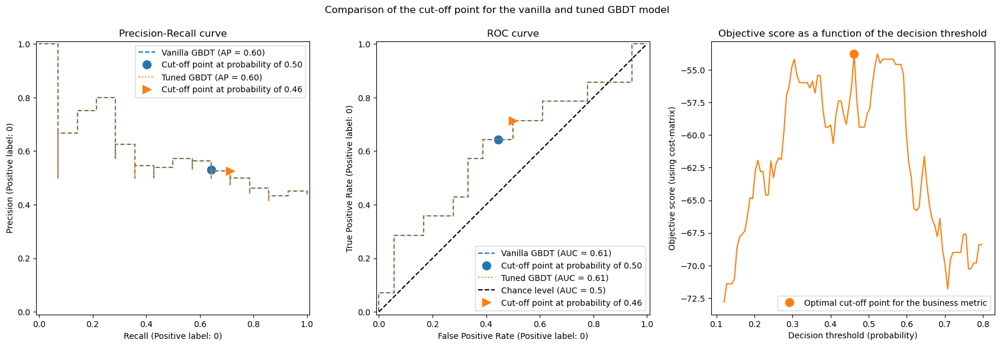

In [6409]:
title = "Comparison of the cut-off point for the vanilla and tuned GBDT model"
plot_roc_pr_curves(mod_2e3TT2, tuned_model_2e3TT2, title=title)

In [6410]:
print(f"Business defined metric: {scoring['credit_gain'](tuned_model_2e3TT2, X_test_2e3TT2, y_test_2e3TT2)}")

[[ 9  9]
 [ 4 10]]
Business defined metric: -99


In [6411]:
sum(y_test_2e3TT2==0)

14

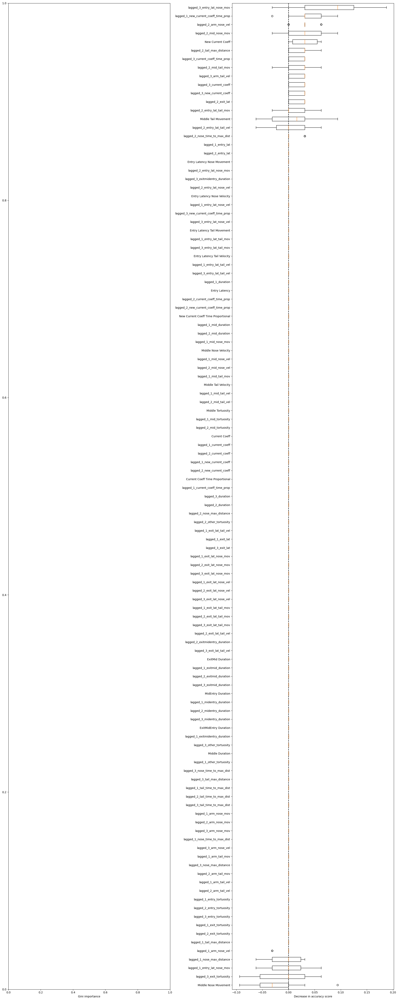

In [6412]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(tuned_model_2e3TT2, X_test_2e3TT2, y_test_2e3TT2, x_main_2e3,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

# 23(41) vs _3(70) - are 23s distinguishable from other _3s?

In [6435]:
grouped_lagged_added_stats_ri_23 = grouped_lagged_added_stats_ri.iloc[:,:][(grouped_lagged_added_stats_ri['Choice Output']==3)&(grouped_lagged_added_stats_ri['lagged_1_choice_ago']==2)]

In [6436]:
grouped_lagged_added_stats_ri_23['Binary']=0

In [6437]:
grouped_lagged_added_stats_ri_e3 = grouped_lagged_added_stats_ri.iloc[:,:][(grouped_lagged_added_stats_ri['Choice Output']==3)&(grouped_lagged_added_stats_ri['lagged_1_choice_ago']>2)]

In [6438]:
grouped_lagged_added_stats_ri_e3['Binary']=1

In [6439]:
grouped_lagged_binary23e3 = pd.concat([grouped_lagged_added_stats_ri_23, grouped_lagged_added_stats_ri_e3])

In [6440]:
grouped_lagged_binary23e3_ri = grouped_lagged_binary23e3.reset_index(drop=True)

In [6441]:
x_main_23e3= grouped_lagged_binary23e3_ri.drop(columns = ['Choice Output', 'Duration', 'Exit Latency', 
        'Nose Max Distance', 'Nose Time to Max Dist', 'Tail Base Max Distance', 'Tail Base Time to Max Dist', 'Entry Tortuosity', 'Exit Tortuosity',
        'Other Tortuosity', 'Arm Nose Movement', 'Arm Nose Velocity', 'Arm Tail Movement', 'Arm Tail Velocity',
       
        'lagged_1_lagged_1_cur_coeff',
       'lagged_2_lagged_1_cur_coeff', 'lagged_3_lagged_1_cur_coeff',
       'lagged_4_lagged_1_cur_coeff',
       'lagged_1_lagged_2_cur_coeff', 'lagged_2_lagged_2_cur_coeff',
       'lagged_3_lagged_2_cur_coeff', 'lagged_4_lagged_2_cur_coeff',
       'lagged_1_lagged_3_cur_coeff',
       'lagged_2_lagged_3_cur_coeff', 'lagged_3_lagged_3_cur_coeff',
       'lagged_4_lagged_3_cur_coeff', 
       'lagged_1_lagged_4_cur_coeff', 'lagged_2_lagged_4_cur_coeff',
       'lagged_3_lagged_4_cur_coeff', 'lagged_4_lagged_4_cur_coeff',
       
       
       'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop',
       'lagged_3_lagged_1_cur_coeff_time_prop',
       'lagged_4_lagged_1_cur_coeff_time_prop',
       
       'lagged_1_lagged_2_cur_coeff_time_prop',
       'lagged_2_lagged_2_cur_coeff_time_prop',
       'lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop',
       
       'lagged_1_lagged_3_cur_coeff_time_prop',
       'lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop',
       'lagged_4_lagged_3_cur_coeff_time_prop',
       
       'lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop',
       'lagged_3_lagged_4_cur_coeff_time_prop',
       'lagged_4_lagged_4_cur_coeff_time_prop',
                                                                                                             
                                                                                                             
        'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop','lagged_3_lagged_1_cur_coeff_time_prop','lagged_4_lagged_1_cur_coeff_time_prop',
       'lagged_1_lagged_2_cur_coeff_time_prop','lagged_2_lagged_2_cur_coeff_time_prop','lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop','lagged_1_lagged_3_cur_coeff_time_prop','lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop','lagged_4_lagged_3_cur_coeff_time_prop','lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop','lagged_3_lagged_4_cur_coeff_time_prop','lagged_4_lagged_4_cur_coeff_time_prop', 
        'Turn', 'lagged_1_turn_ago', 'lagged_2_turn_ago', 'lagged_3_turn_ago', 'lagged_4_turn_ago', 
        '2_cur_arm_duration', '3_cur_arm_duration', '4_cur_arm_duration',
       '5_cur_arm_duration', 'mean_2_cur_arm_duration',
       'mean_3_cur_arm_duration', 'mean_4_cur_arm_duration',
       'mean_5_cur_arm_duration', '2_past_arm_duration', '3_past_arm_duration',
       '4_past_arm_duration', 'mean_2_past_arm_duration',
       'mean_3_past_arm_duration', 'mean_4_past_arm_duration',
       '2_past_mid_duration', '3_past_mid_duration', '4_past_mid_duration',
       '5_past_mid_duration', 'mean_2_past_mid_duration',
       'mean_3_past_mid_duration', 'mean_4_past_mid_duration',
       'mean_5_past_mid_duration', '2_past_exitmid_duration',
       '3_past_exitmid_duration', '4_past_exitmid_duration',
       '5_past_exitmid_duration', 'mean_2_past_exitmid_duration',
       'mean_3_past_exitmid_duration', 'mean_4_past_exitmid_duration',
       'mean_5_past_exitmid_duration', '2_past_midentry_duration',
       '3_past_midentry_duration', '4_past_midentry_duration',
       '5_past_midentry_duration', 'mean_2_past_midentry_duration',
       'mean_3_past_midentry_duration', 'mean_4_past_midentry_duration',
       'mean_5_past_midentry_duration', '2_past_exitmidentry_duration',
       '3_past_exitmidentry_duration', '4_past_exitmidentry_duration',
       '5_past_exitmidentry_duration', 'mean_2_past_exitmidentry_duration',
       'mean_3_past_exitmidentry_duration',
       'mean_4_past_exitmidentry_duration',
       'mean_5_past_exitmidentry_duration',
                                                                                                               
        'lagged_1_choice_ago', 'lagged_2_choice_ago', 'lagged_3_choice_ago',
       'lagged_4_choice_ago',
        'lagged_1_new_lagged_1_cur_coeff',
        'lagged_2_new_lagged_1_cur_coeff', 
        'lagged_3_new_lagged_1_cur_coeff','lagged_4_new_lagged_1_cur_coeff','lagged_1_new_lagged_2_cur_coeff', 'lagged_2_new_lagged_2_cur_coeff', 
        'lagged_3_new_lagged_2_cur_coeff', 'lagged_4_new_lagged_2_cur_coeff','lagged_1_new_lagged_3_cur_coeff','lagged_2_new_lagged_3_cur_coeff', 
        'lagged_3_new_lagged_3_cur_coeff','lagged_4_new_lagged_3_cur_coeff','lagged_1_new_lagged_4_cur_coeff', 'lagged_2_new_lagged_4_cur_coeff',
        'lagged_3_new_lagged_4_cur_coeff', 'lagged_4_new_lagged_4_cur_coeff','lagged_1_new_lagged_1_cur_coeff_time_prop',
       'lagged_2_new_lagged_1_cur_coeff_time_prop','lagged_3_new_lagged_1_cur_coeff_time_prop','lagged_4_new_lagged_1_cur_coeff_time_prop',
       'lagged_1_new_lagged_2_cur_coeff_time_prop','lagged_2_new_lagged_2_cur_coeff_time_prop','lagged_3_new_lagged_2_cur_coeff_time_prop',
       'lagged_4_new_lagged_2_cur_coeff_time_prop','lagged_1_new_lagged_3_cur_coeff_time_prop','lagged_2_new_lagged_3_cur_coeff_time_prop',
       'lagged_3_new_lagged_3_cur_coeff_time_prop','lagged_4_new_lagged_3_cur_coeff_time_prop','lagged_1_new_lagged_4_cur_coeff_time_prop',
       'lagged_2_new_lagged_4_cur_coeff_time_prop','lagged_3_new_lagged_4_cur_coeff_time_prop','lagged_4_new_lagged_4_cur_coeff_time_prop',
        'Exit Latency Nose Movement', 'Exit Latency Nose Velocity', 'Exit Latency Tail Movement', 'Exit Latency Tail Velocity',
        'lagged_4_mid_duration', 
       'lagged_4_mid_nose_mov', 'lagged_4_mid_nose_vel', 
       'lagged_4_mid_tail_mov', 'lagged_4_mid_tail_vel', 'lagged_4_mid_tortuosity',                                              
         'lagged_4_current_coeff', 'Lagged 3 Cur Coeff', 'Lagged 4 Cur Coeff', 
        'lagged_4_new_current_coeff',  'New Lagged 3 Cur Coeff', 'New Lagged 4 Cur Coeff',                                          
        'lagged_4_current_coeff_time_prop', 'Lagged 3 Cur Coeff Time Proportional',                                               
         'Lagged 4 Cur Coeff Time Proportional',
       'lagged_4_new_current_coeff_time_prop', 'New Lagged 3 Cur Coeff Time Proportional',  'New Lagged 4 Cur Coeff Time Proportional',                                            
       
       'lagged_4_entry_lat', 'lagged_4_entry_lat_nose_mov',
       'lagged_4_entry_lat_nose_vel', 'lagged_4_entry_lat_tail_mov',
       'lagged_4_entry_lat_tail_vel', 'lagged_4_duration',
       'lagged_4_nose_max_distance', 'lagged_4_nose_time_to_max_dist',
       'lagged_4_tail_max_distance', 'lagged_4_tail_time_to_max_dist',                                         
       'lagged_4_arm_nose_mov', 'lagged_4_arm_nose_vel',                                                 
       'lagged_4_arm_tail_mov', 'lagged_4_arm_tail_vel',
       'lagged_4_entry_tortuosity', 'lagged_4_exit_tortuosity',
       'lagged_4_other_tortuosity', 'lagged_4_exit_lat',
       'lagged_4_exit_lat_nose_mov', 'lagged_4_exit_lat_nose_vel',
       'lagged_4_exit_lat_tail_mov', 'lagged_4_exit_lat_tail_vel',
       'lagged_4_exitmid_duration', 'lagged_4_midentry_duration',
       'lagged_4_exitmidentry_duration', 'Binary',
        'Lagged 2 Cur Coeff',  'New Lagged 2 Cur Coeff', 'Lagged 2 Cur Coeff Time Proportional', 'New Lagged 2 Cur Coeff Time Proportional'                                            
                                                        
                                                        ])
#'Lagged 2 Cur Coeff',  'New Lagged 2 Cur Coeff', 'Lagged 2 Cur Coeff Time Proportional', 'New Lagged 2 Cur Coeff Time Proportional' 

In [6442]:
x_23e3 = x_main_23e3.values

In [6443]:
y_23e3 = grouped_lagged_binary23e3_ri['Binary'].values

In [6466]:
X_train_23e3, X_test_23e3, y_train_23e3, y_test_23e3 = train_test_split(x_23e3, y_23e3, test_size=0.2, random_state=9)

In [6481]:
mod_23e3 =  HistGradientBoostingClassifier(learning_rate = 0.1, validation_fraction=0.1, n_iter_no_change=20, random_state=59)
mod_23e3.fit(X_train_23e3, y_train_23e3)
y_pred_23e3=mod_23e3.predict(X_test_23e3)

In [6482]:
mod_23e3.n_iter_

100

In [6483]:
target_names = ['0', '1']

In [6484]:
f1_sc_23e3 = f1_score(y_test_23e3, y_pred_23e3, average = 'weighted')
f1_sc_23e3

0.5128105590062112

In [6485]:
p_sc_23e3 = precision_score(y_test_23e3, y_pred_23e3, average = 'weighted')
p_sc_23e3

0.5446224256292906

In [6486]:
cf_matrix_23e3 = confusion_matrix(y_test_23e3, y_pred_23e3)
cf_matrix_23e3

array([[ 2,  8],
       [ 2, 11]], dtype=int64)

In [6487]:
print(classification_report(y_test_23e3, y_pred_23e3, target_names=target_names))

              precision    recall  f1-score   support

           0       0.50      0.20      0.29        10
           1       0.58      0.85      0.69        13

    accuracy                           0.57        23
   macro avg       0.54      0.52      0.49        23
weighted avg       0.54      0.57      0.51        23



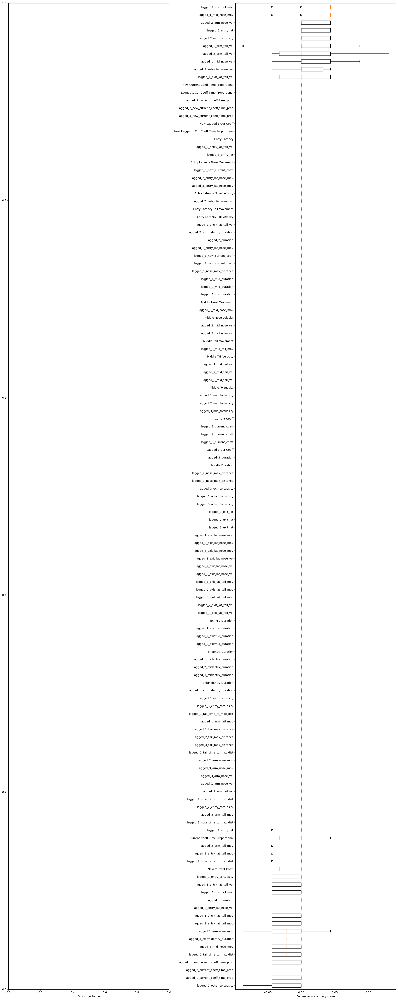

In [6488]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(mod_23e3, X_test_23e3, y_test_23e3, x_main_23e3,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

In [6489]:
# try tuning part2

In [6490]:
X_train_23e3TT2, X_test_23e3TT2, y_train_23e3TT2, y_test_23e3TT2 = train_test_split(x_23e3, y_23e3, stratify=y_23e3, random_state=55)

In [6491]:
pos_label, neg_label = 0,1 # dont want to misclassify lows as highs

In [6492]:
def fpr_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    tn, fp, _, _ = cm.ravel()
    tnr = tn / (tn + fp)
    return 1 - tnr

In [6493]:
from sklearn.metrics import make_scorer, precision_score, recall_score

In [6494]:
tpr_score = recall_score  # TPR and recall are the same metric
scoring = {
    "precision": make_scorer(precision_score, pos_label=pos_label),
    "recall": make_scorer(recall_score, pos_label=pos_label),
    "fpr": make_scorer(fpr_score, neg_label=neg_label, pos_label=pos_label),
    "tpr": make_scorer(tpr_score, pos_label=pos_label),
}

In [6554]:
def credit_gain_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    gain_matrix = np.array(
        [
            [0, -1.7],  # -1 gain for false positives (when a high is classified as low)
            [-3, 0],  # -5 gain for false negatives (when a low is classified as high)
        ]
    )
    return np.sum(cm * gain_matrix)


scoring["credit_gain"] = make_scorer(
    credit_gain_score, neg_label=neg_label, pos_label=pos_label
)

In [6555]:
mod_23e3TT2 = HistGradientBoostingClassifier(learning_rate = 0.025, n_iter_no_change=10, random_state=59)

In [6556]:
mod_23e3TT2.fit(X_train_23e3TT2, y_train_23e3TT2)

HistGradientBoostingClassifier(learning_rate=0.025, random_state=59)

[[14  4]
 [ 8  2]]


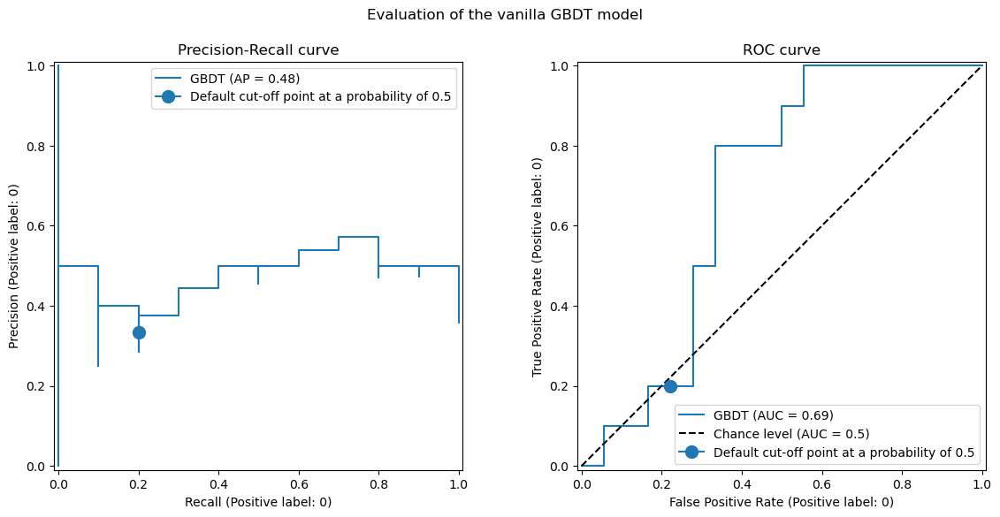

In [6557]:
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

PrecisionRecallDisplay.from_estimator(
    mod_23e3TT2, X_test_23e3TT2, y_test_23e3TT2, pos_label=pos_label, ax=axs[0], name="GBDT"
)
axs[0].plot(
    scoring["recall"](mod_23e3TT2, X_test_23e3TT2, y_test_23e3TT2),
    scoring["precision"](mod_23e3TT2, X_test_23e3TT2, y_test_23e3TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[0].set_title("Precision-Recall curve")
axs[0].legend()

RocCurveDisplay.from_estimator(
    mod_23e3TT2,
    X_test_23e3TT2,
    y_test_23e3TT2,
    pos_label=pos_label,
    ax=axs[1],
    name="GBDT",
    plot_chance_level=True,
)
axs[1].plot(
    scoring["fpr"](mod_23e3TT2, X_test_23e3TT2, y_test_23e3TT2),
    scoring["tpr"](mod_23e3TT2, X_test_23e3TT2, y_test_23e3TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[1].set_title("ROC curve")
axs[1].legend()
_ = fig.suptitle("Evaluation of the vanilla GBDT model")

In [6558]:
sum(y_test_23e3TT2==1)

18

In [6559]:
print(f"Business defined metric: {scoring['credit_gain'](mod_23e3TT2, X_test_23e3TT2, y_test_23e3TT2)}")

[[14  4]
 [ 8  2]]
Business defined metric: -30.8


In [6560]:
from sklearn.model_selection import TunedThresholdClassifierCV

In [6561]:
tuned_model_23e3TT2 = TunedThresholdClassifierCV(
    estimator=mod_23e3TT2,
    scoring=scoring["credit_gain"],
    store_cv_results=True,  # necessary to inspect all results
)
tuned_model_23e3TT2.fit(X_train_23e3TT2, y_train_23e3TT2)
print(f"{tuned_model_23e3TT2.best_threshold_=:0.2f}")

[[ 0 11]
 [ 0  6]]
[[ 1 10]
 [ 0  6]]
[[ 1 10]
 [ 0  6]]
[[ 1 10]
 [ 0  6]]
[[ 1 10]
 [ 0  6]]
[[ 1 10]
 [ 0  6]]
[[ 1 10]
 [ 0  6]]
[[ 1 10]
 [ 0  6]]
[[2 9]
 [0 6]]
[[2 9]
 [0 6]]
[[2 9]
 [0 6]]
[[2 9]
 [0 6]]
[[2 9]
 [0 6]]
[[2 9]
 [0 6]]
[[2 9]
 [0 6]]
[[2 9]
 [0 6]]
[[2 9]
 [1 5]]
[[2 9]
 [1 5]]
[[2 9]
 [1 5]]
[[3 8]
 [1 5]]
[[3 8]
 [1 5]]
[[3 8]
 [1 5]]
[[3 8]
 [1 5]]
[[3 8]
 [1 5]]
[[3 8]
 [1 5]]
[[3 8]
 [1 5]]
[[3 8]
 [1 5]]
[[3 8]
 [1 5]]
[[4 7]
 [1 5]]
[[4 7]
 [1 5]]
[[4 7]
 [2 4]]
[[4 7]
 [3 3]]
[[4 7]
 [3 3]]
[[4 7]
 [3 3]]
[[4 7]
 [3 3]]
[[4 7]
 [3 3]]
[[4 7]
 [3 3]]
[[4 7]
 [3 3]]
[[4 7]
 [3 3]]
[[6 5]
 [3 3]]
[[6 5]
 [3 3]]
[[6 5]
 [3 3]]
[[6 5]
 [3 3]]
[[6 5]
 [3 3]]
[[6 5]
 [3 3]]
[[6 5]
 [3 3]]
[[7 4]
 [3 3]]
[[7 4]
 [3 3]]
[[8 3]
 [4 2]]
[[9 2]
 [4 2]]
[[9 2]
 [5 1]]
[[9 2]
 [5 1]]
[[9 2]
 [5 1]]
[[9 2]
 [5 1]]
[[10  1]
 [ 5  1]]
[[10  1]
 [ 5  1]]
[[10  1]
 [ 5  1]]
[[10  1]
 [ 5  1]]
[[10  1]
 [ 5  1]]
[[10  1]
 [ 5  1]]
[[10  1]
 [ 5  1]]
[[10  1]
 [ 5  1]]
[[10  

In [6562]:
def plot_roc_pr_curves(vanilla_model, tuned_model, *, title):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(21, 6))

    linestyles = ("dashed", "dotted")
    markerstyles = ("o", ">")
    colors = ("tab:blue", "tab:orange")
    names = ("Vanilla GBDT", "Tuned GBDT")
    for idx, (est, linestyle, marker, color, name) in enumerate(
        zip((vanilla_model, tuned_model), linestyles, markerstyles, colors, names)
    ):
        decision_threshold = getattr(est, "best_threshold_", 0.5)
        PrecisionRecallDisplay.from_estimator(
            est,
            X_test_23e3TT2,
            y_test_23e3TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[0],
            name=name,
        )
        axs[0].plot(
            scoring["recall"](est, X_test_23e3TT2, y_test_23e3TT2),
            scoring["precision"](est, X_test_23e3TT2, y_test_23e3TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )
        RocCurveDisplay.from_estimator(
            est,
            X_test_23e3TT2,
            y_test_23e3TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[1],
            name=name,
            plot_chance_level=idx == 1,
        )
        axs[1].plot(
            scoring["fpr"](est, X_test_23e3TT2, y_test_23e3TT2),
            scoring["tpr"](est, X_test_23e3TT2, y_test_23e3TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )

    axs[0].set_title("Precision-Recall curve")
    axs[0].legend()
    axs[1].set_title("ROC curve")
    axs[1].legend()

    axs[2].plot(
        tuned_model.cv_results_["thresholds"],
        tuned_model.cv_results_["scores"],
        color="tab:orange",
    )
    axs[2].plot(
        tuned_model.best_threshold_,
        tuned_model.best_score_,
        "o",
        markersize=10,
        color="tab:orange",
        label="Optimal cut-off point for the business metric",
    )
    axs[2].legend()
    axs[2].set_xlabel("Decision threshold (probability)")
    axs[2].set_ylabel("Objective score (using cost-matrix)")
    axs[2].set_title("Objective score as a function of the decision threshold")
    fig.suptitle(title)

[[14  4]
 [ 8  2]]
[[12  6]
 [ 2  8]]


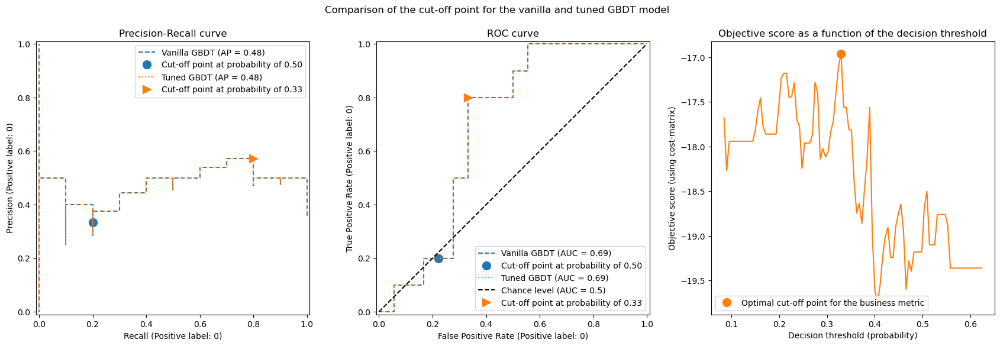

In [6563]:
title = "Comparison of the cut-off point for the vanilla and tuned GBDT model"
plot_roc_pr_curves(mod_23e3TT2, tuned_model_23e3TT2, title=title)

In [6564]:
print(f"Business defined metric: {scoring['credit_gain'](tuned_model_23e3TT2, X_test_23e3TT2, y_test_23e3TT2)}")

[[12  6]
 [ 2  8]]
Business defined metric: -16.2


In [6565]:
sum(y_test_23e3TT2==0)

10

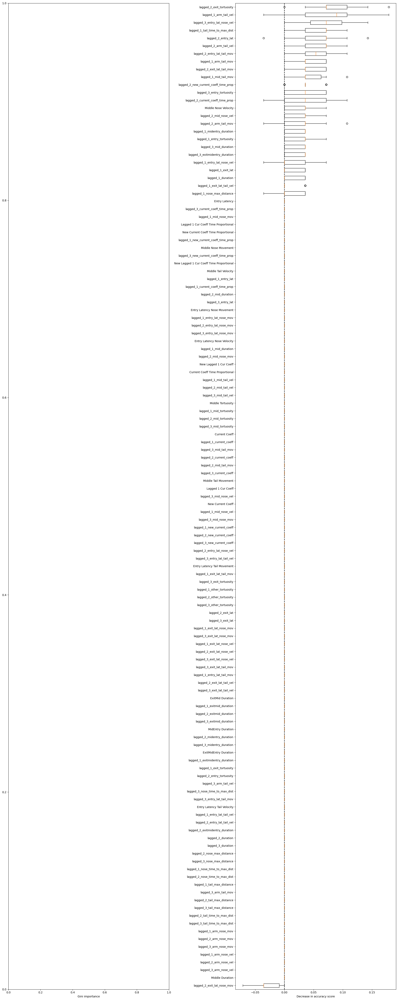

In [6566]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(tuned_model_23e3TT2, X_test_23e3TT2, y_test_23e3TT2, x_main_23e3,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

# _2(57) vs _4(100) - are 2s distinguishable from 4s?

In [6567]:
grouped_lagged_added_stats_ri_2 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']==2]

In [6568]:
grouped_lagged_added_stats_ri_2['Binary']=0

In [6569]:
grouped_lagged_added_stats_ri_4 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']==4]

In [6570]:
grouped_lagged_added_stats_ri_4['Binary']=1

In [6571]:
grouped_lagged_binary24 = pd.concat([grouped_lagged_added_stats_ri_2, grouped_lagged_added_stats_ri_4])

In [6572]:
grouped_lagged_binary24_ri = grouped_lagged_binary24.reset_index(drop=True)

In [6573]:
x_main_24= grouped_lagged_binary24_ri.drop(columns = ['Choice Output', 'Duration', 'Exit Latency', 
        'Nose Max Distance', 'Nose Time to Max Dist', 'Tail Base Max Distance', 'Tail Base Time to Max Dist', 'Entry Tortuosity', 'Exit Tortuosity',
        'Other Tortuosity', 'Arm Nose Movement', 'Arm Nose Velocity', 'Arm Tail Movement', 'Arm Tail Velocity',
       
        'lagged_1_lagged_1_cur_coeff',
       'lagged_2_lagged_1_cur_coeff', 'lagged_3_lagged_1_cur_coeff',
       'lagged_4_lagged_1_cur_coeff',
       'lagged_1_lagged_2_cur_coeff', 'lagged_2_lagged_2_cur_coeff',
       'lagged_3_lagged_2_cur_coeff', 'lagged_4_lagged_2_cur_coeff',
       'lagged_1_lagged_3_cur_coeff',
       'lagged_2_lagged_3_cur_coeff', 'lagged_3_lagged_3_cur_coeff',
       'lagged_4_lagged_3_cur_coeff', 
       'lagged_1_lagged_4_cur_coeff', 'lagged_2_lagged_4_cur_coeff',
       'lagged_3_lagged_4_cur_coeff', 'lagged_4_lagged_4_cur_coeff',
       
       
       'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop',
       'lagged_3_lagged_1_cur_coeff_time_prop',
       'lagged_4_lagged_1_cur_coeff_time_prop',
       
       'lagged_1_lagged_2_cur_coeff_time_prop',
       'lagged_2_lagged_2_cur_coeff_time_prop',
       'lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop',
       
       'lagged_1_lagged_3_cur_coeff_time_prop',
       'lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop',
       'lagged_4_lagged_3_cur_coeff_time_prop',
       
       'lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop',
       'lagged_3_lagged_4_cur_coeff_time_prop',
       'lagged_4_lagged_4_cur_coeff_time_prop',
                                                                                                             
                                                                                                             
        'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop','lagged_3_lagged_1_cur_coeff_time_prop','lagged_4_lagged_1_cur_coeff_time_prop',
       'lagged_1_lagged_2_cur_coeff_time_prop','lagged_2_lagged_2_cur_coeff_time_prop','lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop','lagged_1_lagged_3_cur_coeff_time_prop','lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop','lagged_4_lagged_3_cur_coeff_time_prop','lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop','lagged_3_lagged_4_cur_coeff_time_prop','lagged_4_lagged_4_cur_coeff_time_prop', 
        'Turn', 'lagged_1_turn_ago', 'lagged_2_turn_ago', 'lagged_3_turn_ago', 'lagged_4_turn_ago', 
        '2_cur_arm_duration', '3_cur_arm_duration', '4_cur_arm_duration',
       '5_cur_arm_duration', 'mean_2_cur_arm_duration',
       'mean_3_cur_arm_duration', 'mean_4_cur_arm_duration',
       'mean_5_cur_arm_duration', '2_past_arm_duration', '3_past_arm_duration',
       '4_past_arm_duration', 'mean_2_past_arm_duration',
       'mean_3_past_arm_duration', 'mean_4_past_arm_duration',
       '2_past_mid_duration', '3_past_mid_duration', '4_past_mid_duration',
       '5_past_mid_duration', 'mean_2_past_mid_duration',
       'mean_3_past_mid_duration', 'mean_4_past_mid_duration',
       'mean_5_past_mid_duration', '2_past_exitmid_duration',
       '3_past_exitmid_duration', '4_past_exitmid_duration',
       '5_past_exitmid_duration', 'mean_2_past_exitmid_duration',
       'mean_3_past_exitmid_duration', 'mean_4_past_exitmid_duration',
       'mean_5_past_exitmid_duration', '2_past_midentry_duration',
       '3_past_midentry_duration', '4_past_midentry_duration',
       '5_past_midentry_duration', 'mean_2_past_midentry_duration',
       'mean_3_past_midentry_duration', 'mean_4_past_midentry_duration',
       'mean_5_past_midentry_duration', '2_past_exitmidentry_duration',
       '3_past_exitmidentry_duration', '4_past_exitmidentry_duration',
       '5_past_exitmidentry_duration', 'mean_2_past_exitmidentry_duration',
       'mean_3_past_exitmidentry_duration',
       'mean_4_past_exitmidentry_duration',
       'mean_5_past_exitmidentry_duration',
                                                                                                               
        'lagged_1_choice_ago', 'lagged_2_choice_ago', 'lagged_3_choice_ago',
       'lagged_4_choice_ago',
        'lagged_1_new_lagged_1_cur_coeff',
        'lagged_2_new_lagged_1_cur_coeff', 
        'lagged_3_new_lagged_1_cur_coeff','lagged_4_new_lagged_1_cur_coeff','lagged_1_new_lagged_2_cur_coeff', 'lagged_2_new_lagged_2_cur_coeff', 
        'lagged_3_new_lagged_2_cur_coeff', 'lagged_4_new_lagged_2_cur_coeff','lagged_1_new_lagged_3_cur_coeff','lagged_2_new_lagged_3_cur_coeff', 
        'lagged_3_new_lagged_3_cur_coeff','lagged_4_new_lagged_3_cur_coeff','lagged_1_new_lagged_4_cur_coeff', 'lagged_2_new_lagged_4_cur_coeff',
        'lagged_3_new_lagged_4_cur_coeff', 'lagged_4_new_lagged_4_cur_coeff','lagged_1_new_lagged_1_cur_coeff_time_prop',
       'lagged_2_new_lagged_1_cur_coeff_time_prop','lagged_3_new_lagged_1_cur_coeff_time_prop','lagged_4_new_lagged_1_cur_coeff_time_prop',
       'lagged_1_new_lagged_2_cur_coeff_time_prop','lagged_2_new_lagged_2_cur_coeff_time_prop','lagged_3_new_lagged_2_cur_coeff_time_prop',
       'lagged_4_new_lagged_2_cur_coeff_time_prop','lagged_1_new_lagged_3_cur_coeff_time_prop','lagged_2_new_lagged_3_cur_coeff_time_prop',
       'lagged_3_new_lagged_3_cur_coeff_time_prop','lagged_4_new_lagged_3_cur_coeff_time_prop','lagged_1_new_lagged_4_cur_coeff_time_prop',
       'lagged_2_new_lagged_4_cur_coeff_time_prop','lagged_3_new_lagged_4_cur_coeff_time_prop','lagged_4_new_lagged_4_cur_coeff_time_prop',
        'Exit Latency Nose Movement', 'Exit Latency Nose Velocity', 'Exit Latency Tail Movement', 'Exit Latency Tail Velocity',
       'lagged_4_mid_duration',
       'lagged_4_mid_nose_mov','lagged_4_mid_nose_vel',
       'lagged_4_mid_tail_mov', 'lagged_4_mid_tail_vel', 'lagged_4_mid_tortuosity',                                              
         'lagged_4_current_coeff', 'Lagged 4 Cur Coeff', 
        'lagged_4_new_current_coeff',   'New Lagged 4 Cur Coeff',                                          
        'lagged_4_current_coeff_time_prop',                                                
         'Lagged 4 Cur Coeff Time Proportional',
       'lagged_4_new_current_coeff_time_prop',  'New Lagged 4 Cur Coeff Time Proportional',                                            
       'lagged_4_entry_lat', 'lagged_4_entry_lat_nose_mov',
       'lagged_4_entry_lat_nose_vel', 'lagged_4_entry_lat_tail_mov',
       'lagged_4_entry_lat_tail_vel', 'lagged_4_duration',
       'lagged_4_nose_max_distance', 'lagged_4_nose_time_to_max_dist',
       'lagged_4_tail_max_distance', 'lagged_4_tail_time_to_max_dist',                                         
       'lagged_4_arm_nose_mov', 'lagged_4_arm_nose_vel',                                                 
        'lagged_4_arm_tail_mov', 'lagged_4_arm_tail_vel',
       'lagged_4_entry_tortuosity', 'lagged_4_exit_tortuosity',
       'lagged_4_other_tortuosity', 'lagged_4_exit_lat',
       'lagged_4_exit_lat_nose_mov', 'lagged_4_exit_lat_nose_vel',
       'lagged_4_exit_lat_tail_mov', 'lagged_4_exit_lat_tail_vel',
       'lagged_4_exitmid_duration', 'lagged_4_midentry_duration',
       'lagged_4_exitmidentry_duration', 'Binary',
       'Lagged 2 Cur Coeff',  'New Lagged 2 Cur Coeff', 'Lagged 2 Cur Coeff Time Proportional', 'New Lagged 2 Cur Coeff Time Proportional',
        'Lagged 1 Cur Coeff','New Lagged 1 Cur Coeff', 'Lagged 1 Cur Coeff Time Proportional','New Lagged 1 Cur Coeff Time Proportional',
        'Lagged 3 Cur Coeff','New Lagged 3 Cur Coeff', 'Lagged 3 Cur Coeff Time Proportional','New Lagged 3 Cur Coeff Time Proportional'
                                                        
                                                        ])

#
# 'Lagged 3 Cur Coeff','New Lagged 3 Cur Coeff','Lagged 3 Cur Coeff Time Proportional', 'New Lagged 3 Cur Coeff Time Proportional',


In [6574]:
x_main_24.columns[:100]

Index(['Middle Duration', 'lagged_1_mid_duration', 'lagged_2_mid_duration',
       'lagged_3_mid_duration', 'Middle Nose Movement',
       'lagged_1_mid_nose_mov', 'lagged_2_mid_nose_mov',
       'lagged_3_mid_nose_mov', 'Middle Nose Velocity',
       'lagged_1_mid_nose_vel', 'lagged_2_mid_nose_vel',
       'lagged_3_mid_nose_vel', 'Middle Tail Movement',
       'lagged_1_mid_tail_mov', 'lagged_2_mid_tail_mov',
       'lagged_3_mid_tail_mov', 'Middle Tail Velocity',
       'lagged_1_mid_tail_vel', 'lagged_2_mid_tail_vel',
       'lagged_3_mid_tail_vel', 'Middle Tortuosity', 'lagged_1_mid_tortuosity',
       'lagged_2_mid_tortuosity', 'lagged_3_mid_tortuosity', 'Current Coeff',
       'lagged_1_current_coeff', 'lagged_2_current_coeff',
       'lagged_3_current_coeff', 'New Current Coeff',
       'lagged_1_new_current_coeff', 'lagged_2_new_current_coeff',
       'lagged_3_new_current_coeff', 'Current Coeff Time Proportional',
       'lagged_1_current_coeff_time_prop', 'lagged_2_current_c

In [6575]:
x_24 = x_main_24.values

In [6576]:
y_24 = grouped_lagged_binary24_ri['Binary'].values

In [6577]:
X_train_24, X_test_24, y_train_24, y_test_24 = train_test_split(x_24, y_24, test_size=0.2, random_state=5)

In [6578]:
mod_24 =  HistGradientBoostingClassifier(learning_rate = 0.1, validation_fraction=0.1, n_iter_no_change=20, random_state=54)
mod_24.fit(X_train_24, y_train_24)
y_pred_24=mod_24.predict(X_test_24)

In [6579]:
mod_24.n_iter_

100

In [6580]:
target_names = ['0', '1']

In [6581]:
f1_sc_24 = f1_score(y_test_24, y_pred_24, average = 'weighted')
f1_sc_24

0.6875

In [6582]:
p_sc_24 = precision_score(y_test_24, y_pred_24, average = 'weighted')
p_sc_24

0.6875

In [6583]:
cf_matrix_24 = confusion_matrix(y_test_24, y_pred_24)
cf_matrix_24

array([[ 7,  5],
       [ 5, 15]], dtype=int64)

In [6584]:
print(classification_report(y_test_24, y_pred_24, target_names=target_names))

              precision    recall  f1-score   support

           0       0.58      0.58      0.58        12
           1       0.75      0.75      0.75        20

    accuracy                           0.69        32
   macro avg       0.67      0.67      0.67        32
weighted avg       0.69      0.69      0.69        32



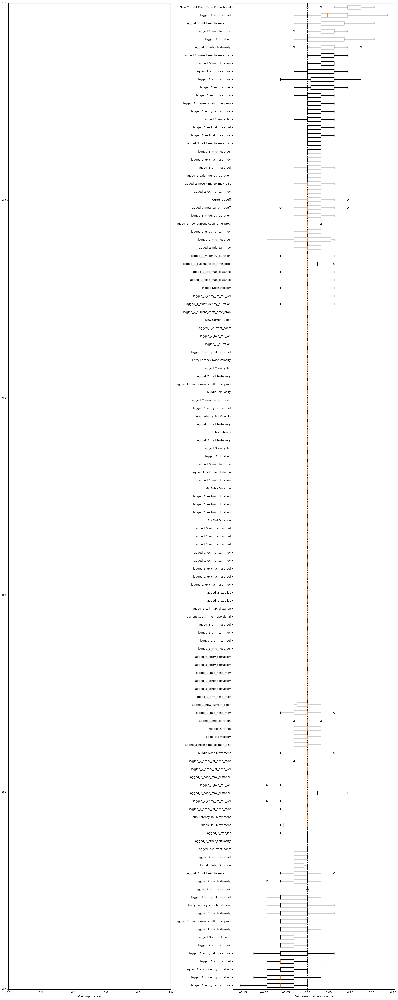

In [6585]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(mod_24, X_test_24, y_test_24, x_main_24,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

In [6586]:
# try tuning part2

In [7140]:
X_train_24TT2, X_test_24TT2, y_train_24TT2, y_test_24TT2 = train_test_split(x_24, y_24, stratify=y_24, random_state=11)

In [7141]:
pos_label, neg_label = 0,1 # dont want to misclassify lows as highs

In [7142]:
def fpr_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    tn, fp, _, _ = cm.ravel()
    tnr = tn / (tn + fp)
    return 1 - tnr

In [7143]:
from sklearn.metrics import make_scorer, precision_score, recall_score

In [7144]:
tpr_score = recall_score  # TPR and recall are the same metric
scoring = {
    "precision": make_scorer(precision_score, pos_label=pos_label),
    "recall": make_scorer(recall_score, pos_label=pos_label),
    "fpr": make_scorer(fpr_score, neg_label=neg_label, pos_label=pos_label),
    "tpr": make_scorer(tpr_score, pos_label=pos_label),
}

In [7145]:
def credit_gain_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    gain_matrix = np.array(
        [
            [0, -3],  # -1 gain for false positives (when a high is classified as low)
            [-5, 0],  # -5 gain for false negatives (when a low is classified as high)
        ]
    )
    return np.sum(cm * gain_matrix)


scoring["credit_gain"] = make_scorer(
    credit_gain_score, neg_label=neg_label, pos_label=pos_label
)

In [7146]:
mod_24TT2 = HistGradientBoostingClassifier(learning_rate = 0.07, n_iter_no_change=20, random_state=57)

In [7147]:
mod_24TT2.fit(X_train_24TT2, y_train_24TT2)

HistGradientBoostingClassifier(learning_rate=0.07, n_iter_no_change=20,
                               random_state=57)

[[23  2]
 [11  4]]


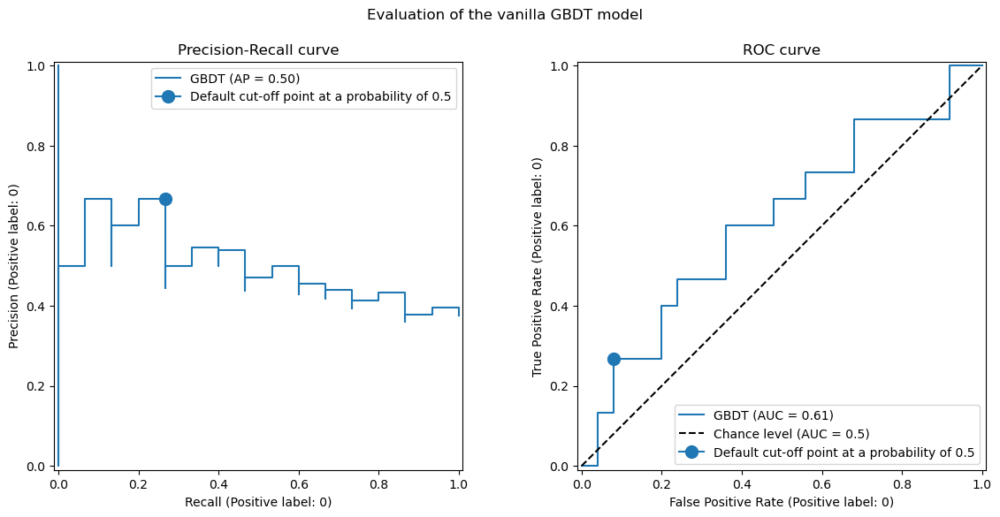

In [7148]:
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

PrecisionRecallDisplay.from_estimator(
    mod_24TT2, X_test_24TT2, y_test_24TT2, pos_label=pos_label, ax=axs[0], name="GBDT"
)
axs[0].plot(
    scoring["recall"](mod_24TT2, X_test_24TT2, y_test_24TT2),
    scoring["precision"](mod_24TT2, X_test_24TT2, y_test_24TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[0].set_title("Precision-Recall curve")
axs[0].legend()

RocCurveDisplay.from_estimator(
    mod_24TT2,
    X_test_24TT2,
    y_test_24TT2,
    pos_label=pos_label,
    ax=axs[1],
    name="GBDT",
    plot_chance_level=True,
)
axs[1].plot(
    scoring["fpr"](mod_24TT2, X_test_24TT2, y_test_24TT2),
    scoring["tpr"](mod_24TT2, X_test_24TT2, y_test_24TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[1].set_title("ROC curve")
axs[1].legend()
_ = fig.suptitle("Evaluation of the vanilla GBDT model")

In [7149]:
sum(y_test_24TT2==1)

25

In [7150]:
print(f"Business defined metric: {scoring['credit_gain'](mod_24TT2, X_test_24TT2, y_test_24TT2)}")

[[23  2]
 [11  4]]
Business defined metric: -61


In [7151]:
from sklearn.model_selection import TunedThresholdClassifierCV

In [7152]:
tuned_model_24TT2 = TunedThresholdClassifierCV(
    estimator=mod_24TT2,
    scoring=scoring["credit_gain"],
    store_cv_results=True,  # necessary to inspect all results
)
tuned_model_24TT2.fit(X_train_24TT2, y_train_24TT2)
print(f"{tuned_model_24TT2.best_threshold_=:0.2f}")

[[ 0 15]
 [ 0  9]]
[[ 1 14]
 [ 0  9]]
[[ 1 14]
 [ 0  9]]
[[ 1 14]
 [ 0  9]]
[[ 1 14]
 [ 0  9]]
[[ 3 12]
 [ 0  9]]
[[ 4 11]
 [ 0  9]]
[[ 5 10]
 [ 1  8]]
[[ 5 10]
 [ 1  8]]
[[ 5 10]
 [ 3  6]]
[[ 5 10]
 [ 3  6]]
[[ 5 10]
 [ 3  6]]
[[ 5 10]
 [ 3  6]]
[[ 5 10]
 [ 3  6]]
[[ 5 10]
 [ 3  6]]
[[ 5 10]
 [ 3  6]]
[[ 5 10]
 [ 3  6]]
[[6 9]
 [3 6]]
[[6 9]
 [3 6]]
[[6 9]
 [4 5]]
[[7 8]
 [4 5]]
[[7 8]
 [4 5]]
[[8 7]
 [4 5]]
[[8 7]
 [4 5]]
[[9 6]
 [4 5]]
[[9 6]
 [4 5]]
[[9 6]
 [4 5]]
[[9 6]
 [4 5]]
[[9 6]
 [4 5]]
[[9 6]
 [4 5]]
[[9 6]
 [5 4]]
[[9 6]
 [6 3]]
[[10  5]
 [ 6  3]]
[[10  5]
 [ 6  3]]
[[10  5]
 [ 6  3]]
[[10  5]
 [ 6  3]]
[[10  5]
 [ 6  3]]
[[10  5]
 [ 6  3]]
[[10  5]
 [ 6  3]]
[[10  5]
 [ 6  3]]
[[11  4]
 [ 6  3]]
[[11  4]
 [ 6  3]]
[[11  4]
 [ 6  3]]
[[11  4]
 [ 6  3]]
[[11  4]
 [ 6  3]]
[[11  4]
 [ 6  3]]
[[11  4]
 [ 6  3]]
[[11  4]
 [ 6  3]]
[[11  4]
 [ 7  2]]
[[11  4]
 [ 7  2]]
[[11  4]
 [ 7  2]]
[[11  4]
 [ 7  2]]
[[11  4]
 [ 7  2]]
[[11  4]
 [ 7  2]]
[[11  4]
 [ 7  2]]
[[11  4]
 [ 7  

In [7153]:
def plot_roc_pr_curves(vanilla_model, tuned_model, *, title):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(21, 6))

    linestyles = ("dashed", "dotted")
    markerstyles = ("o", ">")
    colors = ("tab:blue", "tab:orange")
    names = ("Vanilla GBDT", "Tuned GBDT")
    for idx, (est, linestyle, marker, color, name) in enumerate(
        zip((vanilla_model, tuned_model), linestyles, markerstyles, colors, names)
    ):
        decision_threshold = getattr(est, "best_threshold_", 0.5)
        PrecisionRecallDisplay.from_estimator(
            est,
            X_test_24TT2,
            y_test_24TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[0],
            name=name,
        )
        axs[0].plot(
            scoring["recall"](est, X_test_24TT2, y_test_24TT2),
            scoring["precision"](est, X_test_24TT2, y_test_24TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )
        RocCurveDisplay.from_estimator(
            est,
            X_test_24TT2,
            y_test_24TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[1],
            name=name,
            plot_chance_level=idx == 1,
        )
        axs[1].plot(
            scoring["fpr"](est, X_test_24TT2, y_test_24TT2),
            scoring["tpr"](est, X_test_24TT2, y_test_24TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )

    axs[0].set_title("Precision-Recall curve")
    axs[0].legend()
    axs[1].set_title("ROC curve")
    axs[1].legend()

    axs[2].plot(
        tuned_model.cv_results_["thresholds"],
        tuned_model.cv_results_["scores"],
        color="tab:orange",
    )
    axs[2].plot(
        tuned_model.best_threshold_,
        tuned_model.best_score_,
        "o",
        markersize=10,
        color="tab:orange",
        label="Optimal cut-off point for the business metric",
    )
    axs[2].legend()
    axs[2].set_xlabel("Decision threshold (probability)")
    axs[2].set_ylabel("Objective score (using cost-matrix)")
    axs[2].set_title("Objective score as a function of the decision threshold")
    fig.suptitle(title)

[[23  2]
 [11  4]]
[[11 14]
 [ 5 10]]


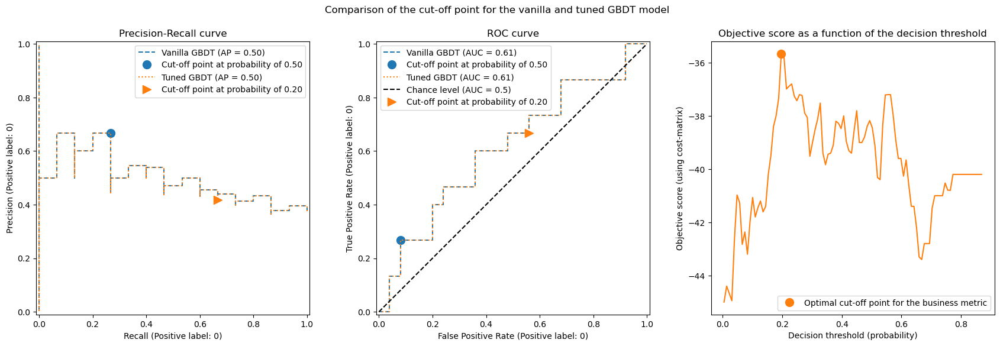

In [7154]:
title = "Comparison of the cut-off point for the vanilla and tuned GBDT model"
plot_roc_pr_curves(mod_24TT2, tuned_model_24TT2, title=title)

In [7155]:
print(f"Business defined metric: {scoring['credit_gain'](tuned_model_24TT2, X_test_24TT2, y_test_24TT2)}")

[[11 14]
 [ 5 10]]
Business defined metric: -67


In [7156]:
sum(y_test_24TT2==0)

15

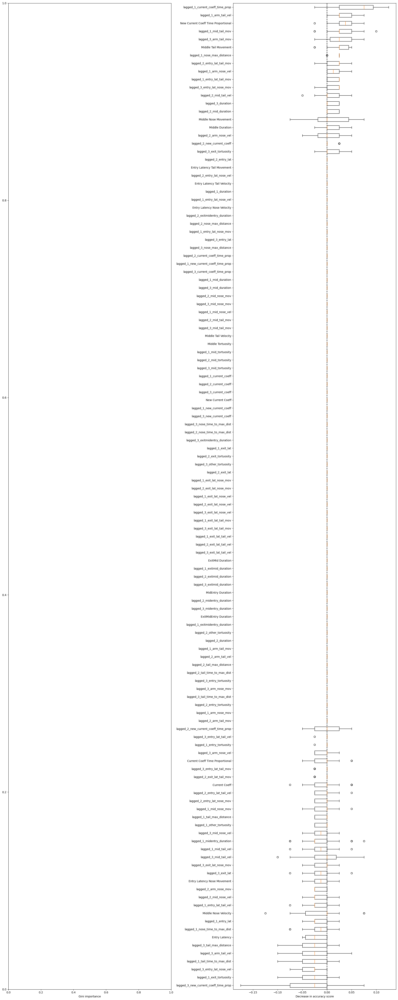

In [7157]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(tuned_model_24TT2, X_test_24TT2, y_test_24TT2, x_main_24,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

# _2(57) vs _4(100), _5(51) - are 2s distinguishable from 4s and 5s?

In [7159]:
grouped_lagged_added_stats_ri_2 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']==2]

In [7160]:
grouped_lagged_added_stats_ri_2['Binary']=0

In [7161]:
grouped_lagged_added_stats_ri_45 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']>3]

In [7162]:
grouped_lagged_added_stats_ri_45['Binary']=1

In [7163]:
grouped_lagged_binary245 = pd.concat([grouped_lagged_added_stats_ri_2, grouped_lagged_added_stats_ri_45])

In [7164]:
grouped_lagged_binary245_ri = grouped_lagged_binary245.reset_index(drop=True)

In [7165]:
x_main_245= grouped_lagged_binary245_ri.drop(columns = ['Choice Output', 'Duration', 'Exit Latency', 
        'Nose Max Distance', 'Nose Time to Max Dist', 'Tail Base Max Distance', 'Tail Base Time to Max Dist', 'Entry Tortuosity', 'Exit Tortuosity',
        'Other Tortuosity', 'Arm Nose Movement', 'Arm Nose Velocity', 'Arm Tail Movement', 'Arm Tail Velocity',
       
        'lagged_1_lagged_1_cur_coeff',
       'lagged_2_lagged_1_cur_coeff', 'lagged_3_lagged_1_cur_coeff',
       'lagged_4_lagged_1_cur_coeff',
       'lagged_1_lagged_2_cur_coeff', 'lagged_2_lagged_2_cur_coeff',
       'lagged_3_lagged_2_cur_coeff', 'lagged_4_lagged_2_cur_coeff',
       'lagged_1_lagged_3_cur_coeff',
       'lagged_2_lagged_3_cur_coeff', 'lagged_3_lagged_3_cur_coeff',
       'lagged_4_lagged_3_cur_coeff', 
       'lagged_1_lagged_4_cur_coeff', 'lagged_2_lagged_4_cur_coeff',
       'lagged_3_lagged_4_cur_coeff', 'lagged_4_lagged_4_cur_coeff',
       
       
       'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop',
       'lagged_3_lagged_1_cur_coeff_time_prop',
       'lagged_4_lagged_1_cur_coeff_time_prop',
       
       'lagged_1_lagged_2_cur_coeff_time_prop',
       'lagged_2_lagged_2_cur_coeff_time_prop',
       'lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop',
       
       'lagged_1_lagged_3_cur_coeff_time_prop',
       'lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop',
       'lagged_4_lagged_3_cur_coeff_time_prop',
       
       'lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop',
       'lagged_3_lagged_4_cur_coeff_time_prop',
       'lagged_4_lagged_4_cur_coeff_time_prop',
                                                                                                             
                                                                                                             
        'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop','lagged_3_lagged_1_cur_coeff_time_prop','lagged_4_lagged_1_cur_coeff_time_prop',
       'lagged_1_lagged_2_cur_coeff_time_prop','lagged_2_lagged_2_cur_coeff_time_prop','lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop','lagged_1_lagged_3_cur_coeff_time_prop','lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop','lagged_4_lagged_3_cur_coeff_time_prop','lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop','lagged_3_lagged_4_cur_coeff_time_prop','lagged_4_lagged_4_cur_coeff_time_prop', 
        'Turn', 'lagged_1_turn_ago', 'lagged_2_turn_ago', 'lagged_3_turn_ago', 'lagged_4_turn_ago', 
        '2_cur_arm_duration', '3_cur_arm_duration', '4_cur_arm_duration',
       '5_cur_arm_duration', 'mean_2_cur_arm_duration',
       'mean_3_cur_arm_duration', 'mean_4_cur_arm_duration',
       'mean_5_cur_arm_duration', '2_past_arm_duration', '3_past_arm_duration',
       '4_past_arm_duration', 'mean_2_past_arm_duration',
       'mean_3_past_arm_duration', 'mean_4_past_arm_duration',
       '2_past_mid_duration', '3_past_mid_duration', '4_past_mid_duration',
       '5_past_mid_duration', 'mean_2_past_mid_duration',
       'mean_3_past_mid_duration', 'mean_4_past_mid_duration',
       'mean_5_past_mid_duration', '2_past_exitmid_duration',
       '3_past_exitmid_duration', '4_past_exitmid_duration',
       '5_past_exitmid_duration', 'mean_2_past_exitmid_duration',
       'mean_3_past_exitmid_duration', 'mean_4_past_exitmid_duration',
       'mean_5_past_exitmid_duration', '2_past_midentry_duration',
       '3_past_midentry_duration', '4_past_midentry_duration',
       '5_past_midentry_duration', 'mean_2_past_midentry_duration',
       'mean_3_past_midentry_duration', 'mean_4_past_midentry_duration',
       'mean_5_past_midentry_duration', '2_past_exitmidentry_duration',
       '3_past_exitmidentry_duration', '4_past_exitmidentry_duration',
       '5_past_exitmidentry_duration', 'mean_2_past_exitmidentry_duration',
       'mean_3_past_exitmidentry_duration',
       'mean_4_past_exitmidentry_duration',
       'mean_5_past_exitmidentry_duration',
                                                                                                               
        'lagged_1_choice_ago', 'lagged_2_choice_ago', 'lagged_3_choice_ago',
       'lagged_4_choice_ago',
        'lagged_1_new_lagged_1_cur_coeff',
        'lagged_2_new_lagged_1_cur_coeff', 
        'lagged_3_new_lagged_1_cur_coeff','lagged_4_new_lagged_1_cur_coeff','lagged_1_new_lagged_2_cur_coeff', 'lagged_2_new_lagged_2_cur_coeff', 
        'lagged_3_new_lagged_2_cur_coeff', 'lagged_4_new_lagged_2_cur_coeff','lagged_1_new_lagged_3_cur_coeff','lagged_2_new_lagged_3_cur_coeff', 
        'lagged_3_new_lagged_3_cur_coeff','lagged_4_new_lagged_3_cur_coeff','lagged_1_new_lagged_4_cur_coeff', 'lagged_2_new_lagged_4_cur_coeff',
        'lagged_3_new_lagged_4_cur_coeff', 'lagged_4_new_lagged_4_cur_coeff','lagged_1_new_lagged_1_cur_coeff_time_prop',
       'lagged_2_new_lagged_1_cur_coeff_time_prop','lagged_3_new_lagged_1_cur_coeff_time_prop','lagged_4_new_lagged_1_cur_coeff_time_prop',
       'lagged_1_new_lagged_2_cur_coeff_time_prop','lagged_2_new_lagged_2_cur_coeff_time_prop','lagged_3_new_lagged_2_cur_coeff_time_prop',
       'lagged_4_new_lagged_2_cur_coeff_time_prop','lagged_1_new_lagged_3_cur_coeff_time_prop','lagged_2_new_lagged_3_cur_coeff_time_prop',
       'lagged_3_new_lagged_3_cur_coeff_time_prop','lagged_4_new_lagged_3_cur_coeff_time_prop','lagged_1_new_lagged_4_cur_coeff_time_prop',
       'lagged_2_new_lagged_4_cur_coeff_time_prop','lagged_3_new_lagged_4_cur_coeff_time_prop','lagged_4_new_lagged_4_cur_coeff_time_prop',
        'Exit Latency Nose Movement', 'Exit Latency Nose Velocity', 'Exit Latency Tail Movement', 'Exit Latency Tail Velocity',
       'lagged_4_mid_duration',
       'lagged_4_mid_nose_mov','lagged_4_mid_nose_vel',
       'lagged_4_mid_tail_mov', 'lagged_4_mid_tail_vel', 'lagged_4_mid_tortuosity',                                              
         'lagged_4_current_coeff', 'Lagged 4 Cur Coeff', 
        'lagged_4_new_current_coeff',   'New Lagged 4 Cur Coeff',                                          
        'lagged_4_current_coeff_time_prop',                                                
         'Lagged 4 Cur Coeff Time Proportional',
       'lagged_4_new_current_coeff_time_prop',  'New Lagged 4 Cur Coeff Time Proportional',                                            
       'lagged_4_entry_lat', 'lagged_4_entry_lat_nose_mov',
       'lagged_4_entry_lat_nose_vel', 'lagged_4_entry_lat_tail_mov',
       'lagged_4_entry_lat_tail_vel', 'lagged_4_duration',
       'lagged_4_nose_max_distance', 'lagged_4_nose_time_to_max_dist',
       'lagged_4_tail_max_distance', 'lagged_4_tail_time_to_max_dist',                                         
       'lagged_4_arm_nose_mov', 'lagged_4_arm_nose_vel',                                                 
        'lagged_4_arm_tail_mov', 'lagged_4_arm_tail_vel',
       'lagged_4_entry_tortuosity', 'lagged_4_exit_tortuosity',
       'lagged_4_other_tortuosity', 'lagged_4_exit_lat',
       'lagged_4_exit_lat_nose_mov', 'lagged_4_exit_lat_nose_vel',
       'lagged_4_exit_lat_tail_mov', 'lagged_4_exit_lat_tail_vel',
       'lagged_4_exitmid_duration', 'lagged_4_midentry_duration',
       'lagged_4_exitmidentry_duration', 'Binary',
       'Lagged 2 Cur Coeff',  'New Lagged 2 Cur Coeff', 'Lagged 2 Cur Coeff Time Proportional', 'New Lagged 2 Cur Coeff Time Proportional',                                             
       'Lagged 1 Cur Coeff','New Lagged 1 Cur Coeff', 'Lagged 1 Cur Coeff Time Proportional','New Lagged 1 Cur Coeff Time Proportional',                                                  
        'Lagged 3 Cur Coeff','New Lagged 3 Cur Coeff', 'Lagged 3 Cur Coeff Time Proportional','New Lagged 3 Cur Coeff Time Proportional'                                                ])

#
# 'Lagged 3 Cur Coeff','New Lagged 3 Cur Coeff','Lagged 3 Cur Coeff Time Proportional', 'New Lagged 3 Cur Coeff Time Proportional',


In [7166]:
x_main_245.columns[:100]

Index(['Middle Duration', 'lagged_1_mid_duration', 'lagged_2_mid_duration',
       'lagged_3_mid_duration', 'Middle Nose Movement',
       'lagged_1_mid_nose_mov', 'lagged_2_mid_nose_mov',
       'lagged_3_mid_nose_mov', 'Middle Nose Velocity',
       'lagged_1_mid_nose_vel', 'lagged_2_mid_nose_vel',
       'lagged_3_mid_nose_vel', 'Middle Tail Movement',
       'lagged_1_mid_tail_mov', 'lagged_2_mid_tail_mov',
       'lagged_3_mid_tail_mov', 'Middle Tail Velocity',
       'lagged_1_mid_tail_vel', 'lagged_2_mid_tail_vel',
       'lagged_3_mid_tail_vel', 'Middle Tortuosity', 'lagged_1_mid_tortuosity',
       'lagged_2_mid_tortuosity', 'lagged_3_mid_tortuosity', 'Current Coeff',
       'lagged_1_current_coeff', 'lagged_2_current_coeff',
       'lagged_3_current_coeff', 'New Current Coeff',
       'lagged_1_new_current_coeff', 'lagged_2_new_current_coeff',
       'lagged_3_new_current_coeff', 'Current Coeff Time Proportional',
       'lagged_1_current_coeff_time_prop', 'lagged_2_current_c

In [7167]:
x_245 = x_main_245.values

In [7168]:
y_245 = grouped_lagged_binary245_ri['Binary'].values

In [7255]:
X_train_245, X_test_245, y_train_245, y_test_245 = train_test_split(x_245, y_245, test_size=0.2, random_state=5)

In [7256]:
mod_245 =  HistGradientBoostingClassifier(learning_rate = 0.1, validation_fraction=0.1, n_iter_no_change=20, random_state=54)
mod_245.fit(X_train_245, y_train_245)
y_pred_245=mod_245.predict(X_test_245)

In [7257]:
mod_245.n_iter_

100

In [7258]:
target_names = ['0', '1']

In [7259]:
f1_sc_245 = f1_score(y_test_245, y_pred_245, average = 'weighted')
f1_sc_245

0.6975282781734394

In [7260]:
p_sc_245 = precision_score(y_test_245, y_pred_245, average = 'weighted')
p_sc_245

0.695045695045695

In [7261]:
cf_matrix_245 = confusion_matrix(y_test_245, y_pred_245)
cf_matrix_245

array([[ 5,  8],
       [ 4, 25]], dtype=int64)

In [7262]:
print(classification_report(y_test_245, y_pred_245, target_names=target_names))

              precision    recall  f1-score   support

           0       0.56      0.38      0.45        13
           1       0.76      0.86      0.81        29

    accuracy                           0.71        42
   macro avg       0.66      0.62      0.63        42
weighted avg       0.70      0.71      0.70        42



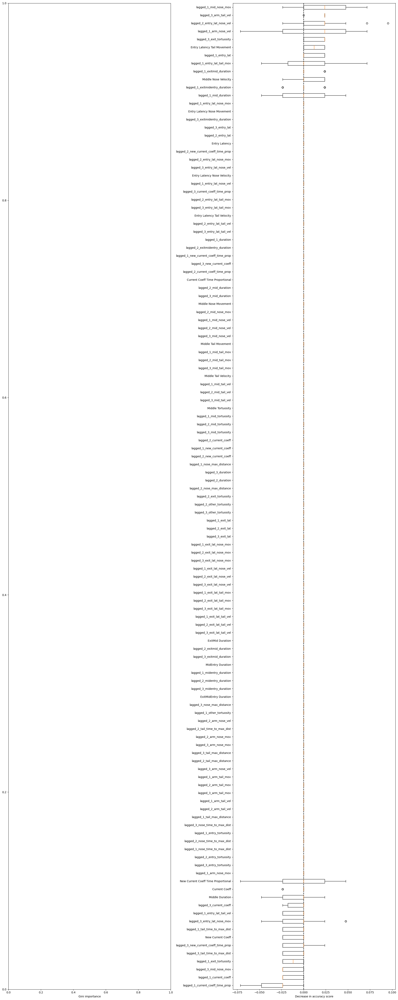

In [7263]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(mod_245, X_test_245, y_test_245, x_main_245,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

In [4899]:
# try tuning part2

In [7264]:
X_train_245TT2, X_test_245TT2, y_train_245TT2, y_test_245TT2 = train_test_split(x_245, y_245, stratify=y_245, random_state=55)

In [7265]:
pos_label, neg_label = 0,1 # dont want to misclassify lows as highs

In [7266]:
def fpr_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    tn, fp, _, _ = cm.ravel()
    tnr = tn / (tn + fp)
    return 1 - tnr

In [7267]:
from sklearn.metrics import make_scorer, precision_score, recall_score

In [7268]:
tpr_score = recall_score  # TPR and recall are the same metric
scoring = {
    "precision": make_scorer(precision_score, pos_label=pos_label),
    "recall": make_scorer(recall_score, pos_label=pos_label),
    "fpr": make_scorer(fpr_score, neg_label=neg_label, pos_label=pos_label),
    "tpr": make_scorer(tpr_score, pos_label=pos_label),
}

In [7321]:
def credit_gain_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    gain_matrix = np.array(
        [
            [0, -1.5],  # -1 gain for false positives (when a high is classified as low)
            [-2, 0],  # -5 gain for false negatives (when a low is classified as high)
        ]
    )
    return np.sum(cm * gain_matrix)


scoring["credit_gain"] = make_scorer(
    credit_gain_score, neg_label=neg_label, pos_label=pos_label
)

In [7322]:
mod_245TT2 = HistGradientBoostingClassifier(learning_rate = 0.025, n_iter_no_change=20, random_state=57)

In [7323]:
mod_245TT2.fit(X_train_245TT2, y_train_245TT2)

HistGradientBoostingClassifier(learning_rate=0.025, n_iter_no_change=20,
                               random_state=57)

[[30  8]
 [ 8  6]]


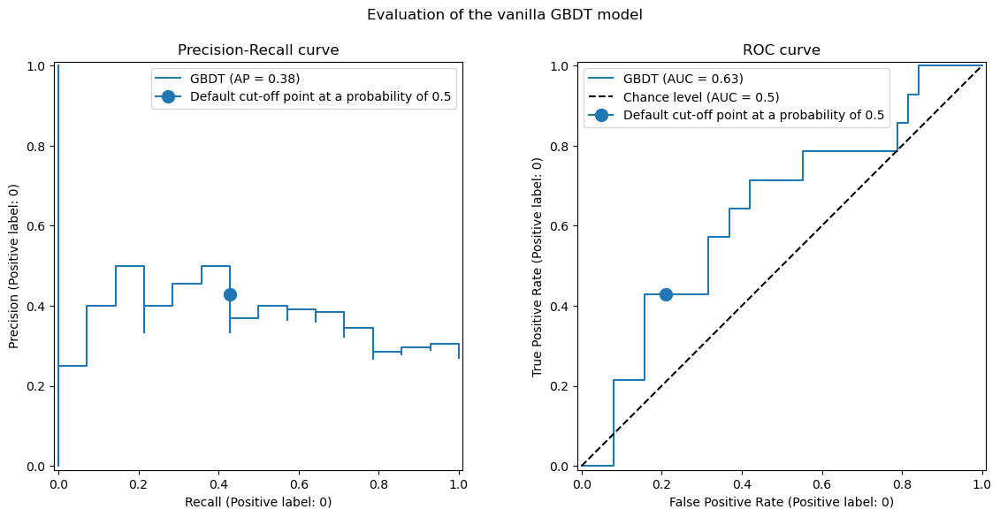

In [7324]:
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

PrecisionRecallDisplay.from_estimator(
    mod_245TT2, X_test_245TT2, y_test_245TT2, pos_label=pos_label, ax=axs[0], name="GBDT"
)
axs[0].plot(
    scoring["recall"](mod_245TT2, X_test_245TT2, y_test_245TT2),
    scoring["precision"](mod_245TT2, X_test_245TT2, y_test_245TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[0].set_title("Precision-Recall curve")
axs[0].legend()

RocCurveDisplay.from_estimator(
    mod_245TT2,
    X_test_245TT2,
    y_test_245TT2,
    pos_label=pos_label,
    ax=axs[1],
    name="GBDT",
    plot_chance_level=True,
)
axs[1].plot(
    scoring["fpr"](mod_245TT2, X_test_245TT2, y_test_245TT2),
    scoring["tpr"](mod_245TT2, X_test_245TT2, y_test_245TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[1].set_title("ROC curve")
axs[1].legend()
_ = fig.suptitle("Evaluation of the vanilla GBDT model")

In [7325]:
sum(y_test_245TT2==1)

38

In [7326]:
print(f"Business defined metric: {scoring['credit_gain'](mod_245TT2, X_test_245TT2, y_test_245TT2)}")

[[30  8]
 [ 8  6]]
Business defined metric: -28.0


In [7327]:
from sklearn.model_selection import TunedThresholdClassifierCV

In [7328]:
tuned_model_245TT2 = TunedThresholdClassifierCV(
    estimator=mod_245TT2,
    scoring=scoring["credit_gain"],
    store_cv_results=True,  # necessary to inspect all results
)
tuned_model_245TT2.fit(X_train_245TT2, y_train_245TT2)
print(f"{tuned_model_245TT2.best_threshold_=:0.2f}")

[[ 0 23]
 [ 0  9]]
[[ 3 20]
 [ 0  9]]
[[ 3 20]
 [ 0  9]]
[[ 3 20]
 [ 0  9]]
[[ 3 20]
 [ 0  9]]
[[ 7 16]
 [ 0  9]]
[[ 9 14]
 [ 0  9]]
[[ 9 14]
 [ 0  9]]
[[ 9 14]
 [ 0  9]]
[[ 9 14]
 [ 0  9]]
[[ 9 14]
 [ 0  9]]
[[10 13]
 [ 1  8]]
[[10 13]
 [ 1  8]]
[[10 13]
 [ 2  7]]
[[11 12]
 [ 2  7]]
[[11 12]
 [ 2  7]]
[[11 12]
 [ 2  7]]
[[11 12]
 [ 2  7]]
[[11 12]
 [ 2  7]]
[[11 12]
 [ 2  7]]
[[12 11]
 [ 2  7]]
[[13 10]
 [ 2  7]]
[[13 10]
 [ 2  7]]
[[14  9]
 [ 2  7]]
[[14  9]
 [ 2  7]]
[[14  9]
 [ 2  7]]
[[15  8]
 [ 2  7]]
[[15  8]
 [ 3  6]]
[[15  8]
 [ 3  6]]
[[15  8]
 [ 3  6]]
[[16  7]
 [ 3  6]]
[[16  7]
 [ 3  6]]
[[16  7]
 [ 3  6]]
[[16  7]
 [ 3  6]]
[[16  7]
 [ 3  6]]
[[16  7]
 [ 3  6]]
[[17  6]
 [ 3  6]]
[[18  5]
 [ 3  6]]
[[18  5]
 [ 3  6]]
[[18  5]
 [ 3  6]]
[[18  5]
 [ 3  6]]
[[18  5]
 [ 3  6]]
[[18  5]
 [ 3  6]]
[[18  5]
 [ 3  6]]
[[18  5]
 [ 4  5]]
[[18  5]
 [ 4  5]]
[[18  5]
 [ 4  5]]
[[18  5]
 [ 4  5]]
[[18  5]
 [ 4  5]]
[[19  4]
 [ 4  5]]
[[19  4]
 [ 4  5]]
[[19  4]
 [ 4  5]]
[[19  4]
 [ 

In [7329]:
def plot_roc_pr_curves(vanilla_model, tuned_model, *, title):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(21, 6))

    linestyles = ("dashed", "dotted")
    markerstyles = ("o", ">")
    colors = ("tab:blue", "tab:orange")
    names = ("Vanilla GBDT", "Tuned GBDT")
    for idx, (est, linestyle, marker, color, name) in enumerate(
        zip((vanilla_model, tuned_model), linestyles, markerstyles, colors, names)
    ):
        decision_threshold = getattr(est, "best_threshold_", 0.5)
        PrecisionRecallDisplay.from_estimator(
            est,
            X_test_245TT2,
            y_test_245TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[0],
            name=name,
        )
        axs[0].plot(
            scoring["recall"](est, X_test_245TT2, y_test_245TT2),
            scoring["precision"](est, X_test_245TT2, y_test_245TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )
        RocCurveDisplay.from_estimator(
            est,
            X_test_245TT2,
            y_test_245TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[1],
            name=name,
            plot_chance_level=idx == 1,
        )
        axs[1].plot(
            scoring["fpr"](est, X_test_245TT2, y_test_245TT2),
            scoring["tpr"](est, X_test_245TT2, y_test_245TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )

    axs[0].set_title("Precision-Recall curve")
    axs[0].legend()
    axs[1].set_title("ROC curve")
    axs[1].legend()

    axs[2].plot(
        tuned_model.cv_results_["thresholds"],
        tuned_model.cv_results_["scores"],
        color="tab:orange",
    )
    axs[2].plot(
        tuned_model.best_threshold_,
        tuned_model.best_score_,
        "o",
        markersize=10,
        color="tab:orange",
        label="Optimal cut-off point for the business metric",
    )
    axs[2].legend()
    axs[2].set_xlabel("Decision threshold (probability)")
    axs[2].set_ylabel("Objective score (using cost-matrix)")
    axs[2].set_title("Objective score as a function of the decision threshold")
    fig.suptitle(title)

[[30  8]
 [ 8  6]]
[[26 12]
 [ 6  8]]


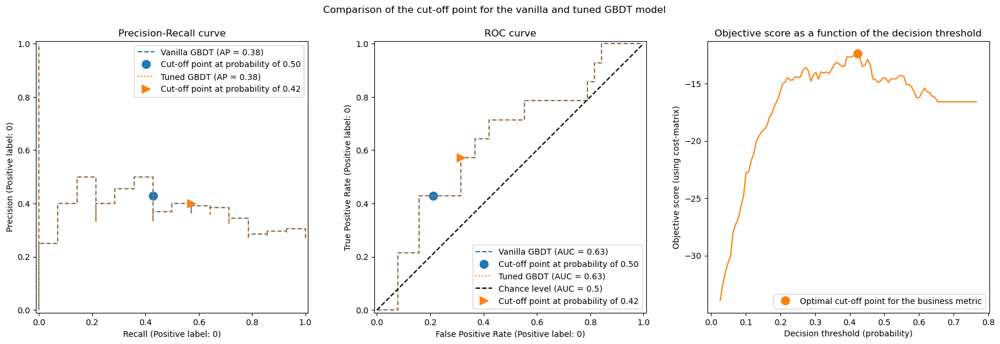

In [7330]:
title = "Comparison of the cut-off point for the vanilla and tuned GBDT model"
plot_roc_pr_curves(mod_245TT2, tuned_model_245TT2, title=title)

In [7331]:
print(f"Business defined metric: {scoring['credit_gain'](tuned_model_245TT2, X_test_245TT2, y_test_245TT2)}")

[[26 12]
 [ 6  8]]
Business defined metric: -30.0


In [7332]:
sum(y_test_245TT2==0)

14

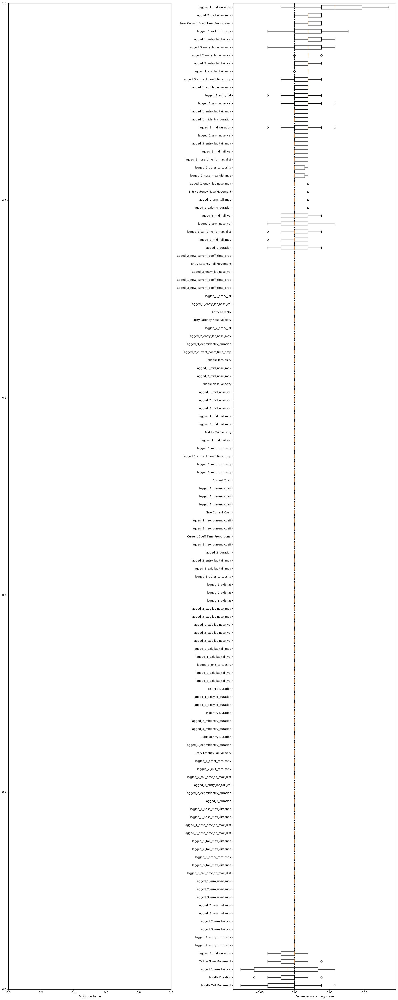

In [7333]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(tuned_model_245TT2, X_test_245TT2, y_test_245TT2, x_main_245,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

# _4(100) vs _5(51) - are 4s distinguishable from 5s?

In [7334]:
grouped_lagged_added_stats_ri_4 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']==4]

In [7335]:
grouped_lagged_added_stats_ri_4['Binary']=0

In [7336]:
grouped_lagged_added_stats_ri_5 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']==5]

In [7337]:
grouped_lagged_added_stats_ri_5['Binary']=1

In [7338]:
grouped_lagged_binary45 = pd.concat([grouped_lagged_added_stats_ri_4, grouped_lagged_added_stats_ri_5])

In [7339]:
grouped_lagged_binary45_ri = grouped_lagged_binary45.reset_index(drop=True)

In [7340]:
x_main_45= grouped_lagged_binary45_ri.drop(columns = ['Choice Output', 'Duration', 'Exit Latency', 
        'Nose Max Distance', 'Nose Time to Max Dist', 'Tail Base Max Distance', 'Tail Base Time to Max Dist', 'Entry Tortuosity', 'Exit Tortuosity',
        'Other Tortuosity', 'Arm Nose Movement', 'Arm Nose Velocity', 'Arm Tail Movement', 'Arm Tail Velocity',
       
        'lagged_1_lagged_1_cur_coeff',
       'lagged_2_lagged_1_cur_coeff', 'lagged_3_lagged_1_cur_coeff',
       'lagged_4_lagged_1_cur_coeff',
       'lagged_1_lagged_2_cur_coeff', 'lagged_2_lagged_2_cur_coeff',
       'lagged_3_lagged_2_cur_coeff', 'lagged_4_lagged_2_cur_coeff',
       'lagged_1_lagged_3_cur_coeff',
       'lagged_2_lagged_3_cur_coeff', 'lagged_3_lagged_3_cur_coeff',
       'lagged_4_lagged_3_cur_coeff', 
       'lagged_1_lagged_4_cur_coeff', 'lagged_2_lagged_4_cur_coeff',
       'lagged_3_lagged_4_cur_coeff', 'lagged_4_lagged_4_cur_coeff',
       
       
       'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop',
       'lagged_3_lagged_1_cur_coeff_time_prop',
       'lagged_4_lagged_1_cur_coeff_time_prop',
       
       'lagged_1_lagged_2_cur_coeff_time_prop',
       'lagged_2_lagged_2_cur_coeff_time_prop',
       'lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop',
       
       'lagged_1_lagged_3_cur_coeff_time_prop',
       'lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop',
       'lagged_4_lagged_3_cur_coeff_time_prop',
       
       'lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop',
       'lagged_3_lagged_4_cur_coeff_time_prop',
       'lagged_4_lagged_4_cur_coeff_time_prop',
                                                                                                             
                                                                                                             
        'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop','lagged_3_lagged_1_cur_coeff_time_prop','lagged_4_lagged_1_cur_coeff_time_prop',
       'lagged_1_lagged_2_cur_coeff_time_prop','lagged_2_lagged_2_cur_coeff_time_prop','lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop','lagged_1_lagged_3_cur_coeff_time_prop','lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop','lagged_4_lagged_3_cur_coeff_time_prop','lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop','lagged_3_lagged_4_cur_coeff_time_prop','lagged_4_lagged_4_cur_coeff_time_prop', 
        'Turn', 'lagged_1_turn_ago', 'lagged_2_turn_ago', 'lagged_3_turn_ago', 'lagged_4_turn_ago', 
        '2_cur_arm_duration', '3_cur_arm_duration', '4_cur_arm_duration',
       '5_cur_arm_duration', 'mean_2_cur_arm_duration',
       'mean_3_cur_arm_duration', 'mean_4_cur_arm_duration',
       'mean_5_cur_arm_duration', '2_past_arm_duration', '3_past_arm_duration',
       '4_past_arm_duration', 'mean_2_past_arm_duration',
       'mean_3_past_arm_duration', 'mean_4_past_arm_duration',
       '2_past_mid_duration', '3_past_mid_duration', '4_past_mid_duration',
       '5_past_mid_duration', 'mean_2_past_mid_duration',
       'mean_3_past_mid_duration', 'mean_4_past_mid_duration',
       'mean_5_past_mid_duration', '2_past_exitmid_duration',
       '3_past_exitmid_duration', '4_past_exitmid_duration',
       '5_past_exitmid_duration', 'mean_2_past_exitmid_duration',
       'mean_3_past_exitmid_duration', 'mean_4_past_exitmid_duration',
       'mean_5_past_exitmid_duration', '2_past_midentry_duration',
       '3_past_midentry_duration', '4_past_midentry_duration',
       '5_past_midentry_duration', 'mean_2_past_midentry_duration',
       'mean_3_past_midentry_duration', 'mean_4_past_midentry_duration',
       'mean_5_past_midentry_duration', '2_past_exitmidentry_duration',
       '3_past_exitmidentry_duration', '4_past_exitmidentry_duration',
       '5_past_exitmidentry_duration', 'mean_2_past_exitmidentry_duration',
       'mean_3_past_exitmidentry_duration',
       'mean_4_past_exitmidentry_duration',
       'mean_5_past_exitmidentry_duration',
                                                                                                               
        'lagged_1_choice_ago', 'lagged_2_choice_ago', 'lagged_3_choice_ago',
       'lagged_4_choice_ago',
        'lagged_1_new_lagged_1_cur_coeff',
        'lagged_2_new_lagged_1_cur_coeff', 
        'lagged_3_new_lagged_1_cur_coeff','lagged_4_new_lagged_1_cur_coeff','lagged_1_new_lagged_2_cur_coeff', 'lagged_2_new_lagged_2_cur_coeff', 
        'lagged_3_new_lagged_2_cur_coeff', 'lagged_4_new_lagged_2_cur_coeff','lagged_1_new_lagged_3_cur_coeff','lagged_2_new_lagged_3_cur_coeff', 
        'lagged_3_new_lagged_3_cur_coeff','lagged_4_new_lagged_3_cur_coeff','lagged_1_new_lagged_4_cur_coeff', 'lagged_2_new_lagged_4_cur_coeff',
        'lagged_3_new_lagged_4_cur_coeff', 'lagged_4_new_lagged_4_cur_coeff','lagged_1_new_lagged_1_cur_coeff_time_prop',
       'lagged_2_new_lagged_1_cur_coeff_time_prop','lagged_3_new_lagged_1_cur_coeff_time_prop','lagged_4_new_lagged_1_cur_coeff_time_prop',
       'lagged_1_new_lagged_2_cur_coeff_time_prop','lagged_2_new_lagged_2_cur_coeff_time_prop','lagged_3_new_lagged_2_cur_coeff_time_prop',
       'lagged_4_new_lagged_2_cur_coeff_time_prop','lagged_1_new_lagged_3_cur_coeff_time_prop','lagged_2_new_lagged_3_cur_coeff_time_prop',
       'lagged_3_new_lagged_3_cur_coeff_time_prop','lagged_4_new_lagged_3_cur_coeff_time_prop','lagged_1_new_lagged_4_cur_coeff_time_prop',
       'lagged_2_new_lagged_4_cur_coeff_time_prop','lagged_3_new_lagged_4_cur_coeff_time_prop','lagged_4_new_lagged_4_cur_coeff_time_prop',
        'Exit Latency Nose Movement', 'Exit Latency Nose Velocity', 'Exit Latency Tail Movement', 'Exit Latency Tail Velocity',                                            
        'Lagged 4 Cur Coeff', 
        'New Lagged 4 Cur Coeff',                                                                                 
         'Lagged 4 Cur Coeff Time Proportional',
         'New Lagged 4 Cur Coeff Time Proportional',                                            
       'Binary',
          'Lagged 3 Cur Coeff','New Lagged 3 Cur Coeff','Lagged 3 Cur Coeff Time Proportional', 'New Lagged 3 Cur Coeff Time Proportional'                                         
                                                        
                                                        ])
# 

In [7341]:
x_main_45.columns[100:]

Index(['lagged_2_tail_time_to_max_dist', 'lagged_3_tail_time_to_max_dist',
       'lagged_4_tail_time_to_max_dist', 'lagged_1_arm_nose_mov',
       'lagged_2_arm_nose_mov', 'lagged_3_arm_nose_mov',
       'lagged_4_arm_nose_mov', 'lagged_1_arm_nose_vel',
       'lagged_2_arm_nose_vel', 'lagged_3_arm_nose_vel',
       'lagged_4_arm_nose_vel', 'lagged_1_arm_tail_mov',
       'lagged_2_arm_tail_mov', 'lagged_3_arm_tail_mov',
       'lagged_4_arm_tail_mov', 'lagged_1_arm_tail_vel',
       'lagged_2_arm_tail_vel', 'lagged_3_arm_tail_vel',
       'lagged_4_arm_tail_vel', 'lagged_1_entry_tortuosity',
       'lagged_2_entry_tortuosity', 'lagged_3_entry_tortuosity',
       'lagged_4_entry_tortuosity', 'lagged_1_exit_tortuosity',
       'lagged_2_exit_tortuosity', 'lagged_3_exit_tortuosity',
       'lagged_4_exit_tortuosity', 'lagged_1_other_tortuosity',
       'lagged_2_other_tortuosity', 'lagged_3_other_tortuosity',
       'lagged_4_other_tortuosity', 'lagged_1_exit_lat', 'lagged_2_exit_lat',


In [7342]:
x_45 = x_main_45.values

In [7343]:
y_45 = grouped_lagged_binary45_ri['Binary'].values

In [7396]:
X_train_45, X_test_45, y_train_45, y_test_45 = train_test_split(x_45, y_45, test_size=0.2, random_state=4)

In [7432]:
mod_45 =  HistGradientBoostingClassifier(learning_rate = 0.1, validation_fraction=0.1, n_iter_no_change=20, random_state=54)
mod_45.fit(X_train_45, y_train_45)
y_pred_45=mod_45.predict(X_test_45)

In [7433]:
mod_45.n_iter_

100

In [7434]:
target_names = ['0', '1']

In [7435]:
f1_sc_45 = f1_score(y_test_45, y_pred_45, average = 'weighted')
f1_sc_45

0.6161290322580646

In [7436]:
p_sc_45 = precision_score(y_test_45, y_pred_45, average = 'weighted')
p_sc_45

0.6036866359447005

In [7437]:
cf_matrix_45 = confusion_matrix(y_test_45, y_pred_45)
cf_matrix_45

array([[20,  2],
       [ 8,  1]], dtype=int64)

In [7438]:
print(classification_report(y_test_45, y_pred_45, target_names=target_names))

              precision    recall  f1-score   support

           0       0.71      0.91      0.80        22
           1       0.33      0.11      0.17         9

    accuracy                           0.68        31
   macro avg       0.52      0.51      0.48        31
weighted avg       0.60      0.68      0.62        31



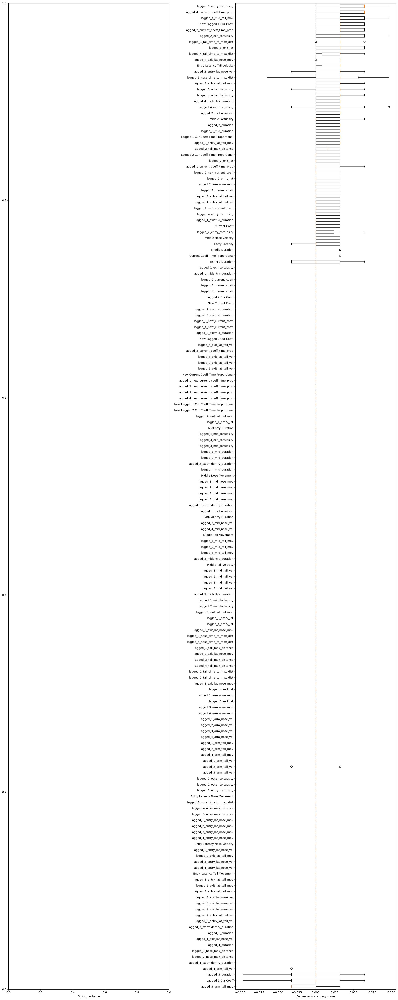

In [1094]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(mod_45, X_test_45, y_test_45, x_main_45,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

In [ ]:
# try tuning part2

In [7451]:
X_train_45TT2, X_test_45TT2, y_train_45TT2, y_test_45TT2 = train_test_split(x_45, y_45, stratify=y_45, random_state=5)

In [7452]:
pos_label, neg_label = 0,1 # dont want to misclassify lows as highs

In [7453]:
def fpr_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    tn, fp, _, _ = cm.ravel()
    tnr = tn / (tn + fp)
    return 1 - tnr

In [7454]:
from sklearn.metrics import make_scorer, precision_score, recall_score

In [7455]:
tpr_score = recall_score  # TPR and recall are the same metric
scoring = {
    "precision": make_scorer(precision_score, pos_label=pos_label),
    "recall": make_scorer(recall_score, pos_label=pos_label),
    "fpr": make_scorer(fpr_score, neg_label=neg_label, pos_label=pos_label),
    "tpr": make_scorer(tpr_score, pos_label=pos_label),
}

In [7466]:
def credit_gain_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    gain_matrix = np.array(
        [
            [0, -37],  # -1 gain for false positives (when a high is classified as low)
            [-17, 0],  # -5 gain for false negatives (when a low is classified as high)
        ]
    )
    return np.sum(cm * gain_matrix)


scoring["credit_gain"] = make_scorer(
    credit_gain_score, neg_label=neg_label, pos_label=pos_label
)

In [7467]:
mod_45TT2 = HistGradientBoostingClassifier(learning_rate = 0.05, n_iter_no_change=20, random_state=57)

In [7468]:
mod_45TT2.fit(X_train_45TT2, y_train_45TT2)

HistGradientBoostingClassifier(learning_rate=0.05, n_iter_no_change=20,
                               random_state=57)

[[ 1 12]
 [ 5 20]]


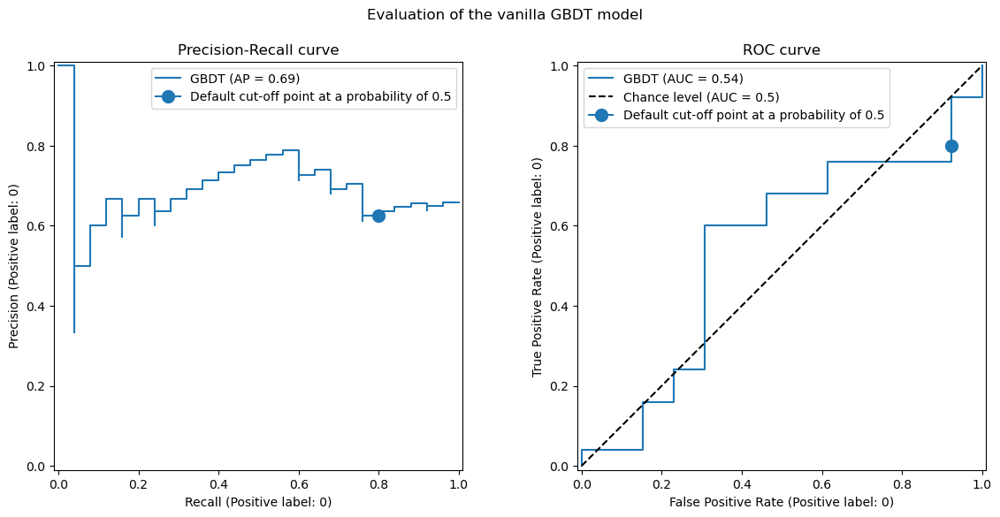

In [7469]:
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

PrecisionRecallDisplay.from_estimator(
    mod_45TT2, X_test_45TT2, y_test_45TT2, pos_label=pos_label, ax=axs[0], name="GBDT"
)
axs[0].plot(
    scoring["recall"](mod_45TT2, X_test_45TT2, y_test_45TT2),
    scoring["precision"](mod_45TT2, X_test_45TT2, y_test_45TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[0].set_title("Precision-Recall curve")
axs[0].legend()

RocCurveDisplay.from_estimator(
    mod_45TT2,
    X_test_45TT2,
    y_test_45TT2,
    pos_label=pos_label,
    ax=axs[1],
    name="GBDT",
    plot_chance_level=True,
)
axs[1].plot(
    scoring["fpr"](mod_45TT2, X_test_45TT2, y_test_45TT2),
    scoring["tpr"](mod_45TT2, X_test_45TT2, y_test_45TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[1].set_title("ROC curve")
axs[1].legend()
_ = fig.suptitle("Evaluation of the vanilla GBDT model")

In [7470]:
sum(y_test_45TT2==1)

13

In [7471]:
print(f"Business defined metric: {scoring['credit_gain'](mod_45TT2, X_test_45TT2, y_test_45TT2)}")

[[ 1 12]
 [ 5 20]]
Business defined metric: -529


In [7472]:
from sklearn.model_selection import TunedThresholdClassifierCV

In [7473]:
tuned_model_45TT2 = TunedThresholdClassifierCV(
    estimator=mod_45TT2,
    scoring=scoring["credit_gain"],
    store_cv_results=True,  # necessary to inspect all results
)
tuned_model_45TT2.fit(X_train_45TT2, y_train_45TT2)
print(f"{tuned_model_45TT2.best_threshold_=:0.2f}")

[[ 0  8]
 [ 0 15]]
[[ 2  6]
 [ 0 15]]
[[ 2  6]
 [ 1 14]]
[[ 2  6]
 [ 1 14]]
[[ 2  6]
 [ 1 14]]
[[ 2  6]
 [ 1 14]]
[[ 2  6]
 [ 1 14]]
[[ 2  6]
 [ 1 14]]
[[ 2  6]
 [ 1 14]]
[[ 2  6]
 [ 1 14]]
[[ 2  6]
 [ 1 14]]
[[ 2  6]
 [ 2 13]]
[[ 2  6]
 [ 2 13]]
[[ 2  6]
 [ 2 13]]
[[ 2  6]
 [ 2 13]]
[[ 2  6]
 [ 2 13]]
[[ 2  6]
 [ 3 12]]
[[ 2  6]
 [ 3 12]]
[[ 2  6]
 [ 3 12]]
[[ 2  6]
 [ 3 12]]
[[ 2  6]
 [ 3 12]]
[[ 2  6]
 [ 3 12]]
[[ 2  6]
 [ 3 12]]
[[ 2  6]
 [ 3 12]]
[[ 2  6]
 [ 3 12]]
[[ 2  6]
 [ 3 12]]
[[ 2  6]
 [ 3 12]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 4 11]]
[[ 2  6]
 [ 

In [7474]:
def plot_roc_pr_curves(vanilla_model, tuned_model, *, title):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(21, 6))

    linestyles = ("dashed", "dotted")
    markerstyles = ("o", ">")
    colors = ("tab:blue", "tab:orange")
    names = ("Vanilla GBDT", "Tuned GBDT")
    for idx, (est, linestyle, marker, color, name) in enumerate(
        zip((vanilla_model, tuned_model), linestyles, markerstyles, colors, names)
    ):
        decision_threshold = getattr(est, "best_threshold_", 0.5)
        PrecisionRecallDisplay.from_estimator(
            est,
            X_test_45TT2,
            y_test_45TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[0],
            name=name,
        )
        axs[0].plot(
            scoring["recall"](est, X_test_45TT2, y_test_45TT2),
            scoring["precision"](est, X_test_45TT2, y_test_45TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )
        RocCurveDisplay.from_estimator(
            est,
            X_test_45TT2,
            y_test_45TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[1],
            name=name,
            plot_chance_level=idx == 1,
        )
        axs[1].plot(
            scoring["fpr"](est, X_test_45TT2, y_test_45TT2),
            scoring["tpr"](est, X_test_45TT2, y_test_45TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )

    axs[0].set_title("Precision-Recall curve")
    axs[0].legend()
    axs[1].set_title("ROC curve")
    axs[1].legend()

    axs[2].plot(
        tuned_model.cv_results_["thresholds"],
        tuned_model.cv_results_["scores"],
        color="tab:orange",
    )
    axs[2].plot(
        tuned_model.best_threshold_,
        tuned_model.best_score_,
        "o",
        markersize=10,
        color="tab:orange",
        label="Optimal cut-off point for the business metric",
    )
    axs[2].legend()
    axs[2].set_xlabel("Decision threshold (probability)")
    axs[2].set_ylabel("Objective score (using cost-matrix)")
    axs[2].set_title("Objective score as a function of the decision threshold")
    fig.suptitle(title)

[[ 1 12]
 [ 5 20]]
[[ 8  5]
 [10 15]]


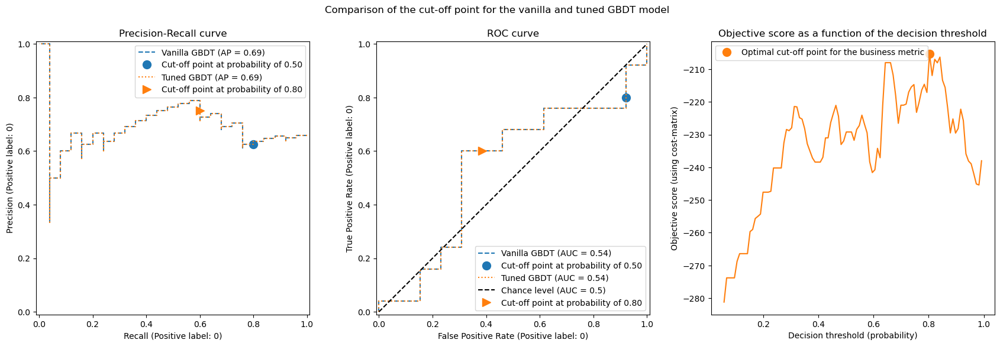

In [7475]:
title = "Comparison of the cut-off point for the vanilla and tuned GBDT model"
plot_roc_pr_curves(mod_45TT2, tuned_model_45TT2, title=title)

In [7476]:
print(f"Business defined metric: {scoring['credit_gain'](tuned_model_45TT2, X_test_45TT2, y_test_45TT2)}")

[[ 8  5]
 [10 15]]
Business defined metric: -355


In [7477]:
sum(y_test_45TT2==0)

25

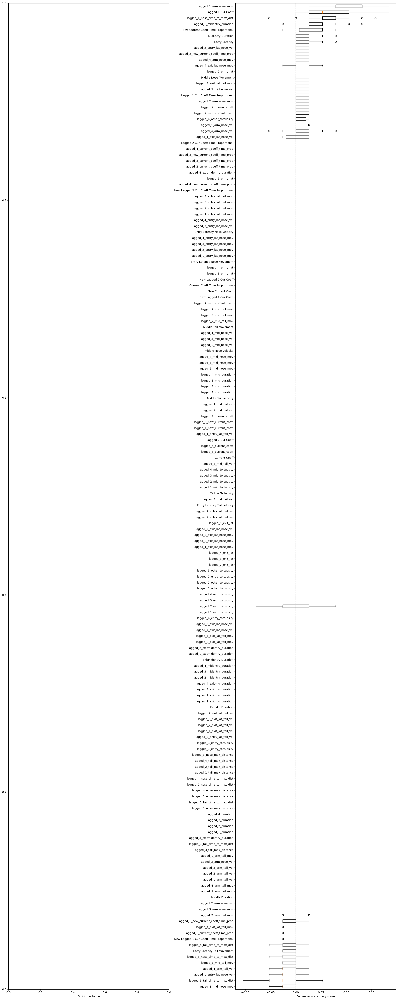

In [7478]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(tuned_model_45TT2, X_test_45TT2, y_test_45TT2, x_main_45,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

# _3(111) vs_4(100) - are 3s distinguishable from 4s?

In [7480]:
grouped_lagged_added_stats_ri_3 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']==3]

In [7481]:
grouped_lagged_added_stats_ri_3['Binary']=0

In [7482]:
grouped_lagged_added_stats_ri_4 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']==4]

In [7483]:
grouped_lagged_added_stats_ri_4['Binary']=1

In [7484]:
grouped_lagged_binary34 = pd.concat([grouped_lagged_added_stats_ri_3, grouped_lagged_added_stats_ri_4])

In [7485]:
grouped_lagged_binary34_ri = grouped_lagged_binary34.reset_index(drop=True)

In [7486]:
x_main_34= grouped_lagged_binary34_ri.drop(columns = ['Choice Output', 'Duration', 'Exit Latency', 
        'Nose Max Distance', 'Nose Time to Max Dist', 'Tail Base Max Distance', 'Tail Base Time to Max Dist', 'Entry Tortuosity', 'Exit Tortuosity',
        'Other Tortuosity', 'Arm Nose Movement', 'Arm Nose Velocity', 'Arm Tail Movement', 'Arm Tail Velocity',
       
        'lagged_1_lagged_1_cur_coeff',
       'lagged_2_lagged_1_cur_coeff', 'lagged_3_lagged_1_cur_coeff',
       'lagged_4_lagged_1_cur_coeff',
       'lagged_1_lagged_2_cur_coeff', 'lagged_2_lagged_2_cur_coeff',
       'lagged_3_lagged_2_cur_coeff', 'lagged_4_lagged_2_cur_coeff',
       'lagged_1_lagged_3_cur_coeff',
       'lagged_2_lagged_3_cur_coeff', 'lagged_3_lagged_3_cur_coeff',
       'lagged_4_lagged_3_cur_coeff', 
       'lagged_1_lagged_4_cur_coeff', 'lagged_2_lagged_4_cur_coeff',
       'lagged_3_lagged_4_cur_coeff', 'lagged_4_lagged_4_cur_coeff',
       
       
       'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop',
       'lagged_3_lagged_1_cur_coeff_time_prop',
       'lagged_4_lagged_1_cur_coeff_time_prop',
       
       'lagged_1_lagged_2_cur_coeff_time_prop',
       'lagged_2_lagged_2_cur_coeff_time_prop',
       'lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop',
       
       'lagged_1_lagged_3_cur_coeff_time_prop',
       'lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop',
       'lagged_4_lagged_3_cur_coeff_time_prop',
       
       'lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop',
       'lagged_3_lagged_4_cur_coeff_time_prop',
       'lagged_4_lagged_4_cur_coeff_time_prop',
                                                                                                             
                                                                                                             
        'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop','lagged_3_lagged_1_cur_coeff_time_prop','lagged_4_lagged_1_cur_coeff_time_prop',
       'lagged_1_lagged_2_cur_coeff_time_prop','lagged_2_lagged_2_cur_coeff_time_prop','lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop','lagged_1_lagged_3_cur_coeff_time_prop','lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop','lagged_4_lagged_3_cur_coeff_time_prop','lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop','lagged_3_lagged_4_cur_coeff_time_prop','lagged_4_lagged_4_cur_coeff_time_prop', 
        'Turn', 'lagged_1_turn_ago', 'lagged_2_turn_ago', 'lagged_3_turn_ago', 'lagged_4_turn_ago', 
        '2_cur_arm_duration', '3_cur_arm_duration', '4_cur_arm_duration',
       '5_cur_arm_duration', 'mean_2_cur_arm_duration',
       'mean_3_cur_arm_duration', 'mean_4_cur_arm_duration',
       'mean_5_cur_arm_duration', '2_past_arm_duration', '3_past_arm_duration',
       '4_past_arm_duration', 'mean_2_past_arm_duration',
       'mean_3_past_arm_duration', 'mean_4_past_arm_duration',
       '2_past_mid_duration', '3_past_mid_duration', '4_past_mid_duration',
       '5_past_mid_duration', 'mean_2_past_mid_duration',
       'mean_3_past_mid_duration', 'mean_4_past_mid_duration',
       'mean_5_past_mid_duration', '2_past_exitmid_duration',
       '3_past_exitmid_duration', '4_past_exitmid_duration',
       '5_past_exitmid_duration', 'mean_2_past_exitmid_duration',
       'mean_3_past_exitmid_duration', 'mean_4_past_exitmid_duration',
       'mean_5_past_exitmid_duration', '2_past_midentry_duration',
       '3_past_midentry_duration', '4_past_midentry_duration',
       '5_past_midentry_duration', 'mean_2_past_midentry_duration',
       'mean_3_past_midentry_duration', 'mean_4_past_midentry_duration',
       'mean_5_past_midentry_duration', '2_past_exitmidentry_duration',
       '3_past_exitmidentry_duration', '4_past_exitmidentry_duration',
       '5_past_exitmidentry_duration', 'mean_2_past_exitmidentry_duration',
       'mean_3_past_exitmidentry_duration',
       'mean_4_past_exitmidentry_duration',
       'mean_5_past_exitmidentry_duration',
                                                                                                               
        'lagged_1_choice_ago', 'lagged_2_choice_ago', 'lagged_3_choice_ago',
       'lagged_4_choice_ago',
        'lagged_1_new_lagged_1_cur_coeff',
        'lagged_2_new_lagged_1_cur_coeff', 
        'lagged_3_new_lagged_1_cur_coeff','lagged_4_new_lagged_1_cur_coeff','lagged_1_new_lagged_2_cur_coeff', 'lagged_2_new_lagged_2_cur_coeff', 
        'lagged_3_new_lagged_2_cur_coeff', 'lagged_4_new_lagged_2_cur_coeff','lagged_1_new_lagged_3_cur_coeff','lagged_2_new_lagged_3_cur_coeff', 
        'lagged_3_new_lagged_3_cur_coeff','lagged_4_new_lagged_3_cur_coeff','lagged_1_new_lagged_4_cur_coeff', 'lagged_2_new_lagged_4_cur_coeff',
        'lagged_3_new_lagged_4_cur_coeff', 'lagged_4_new_lagged_4_cur_coeff','lagged_1_new_lagged_1_cur_coeff_time_prop',
       'lagged_2_new_lagged_1_cur_coeff_time_prop','lagged_3_new_lagged_1_cur_coeff_time_prop','lagged_4_new_lagged_1_cur_coeff_time_prop',
       'lagged_1_new_lagged_2_cur_coeff_time_prop','lagged_2_new_lagged_2_cur_coeff_time_prop','lagged_3_new_lagged_2_cur_coeff_time_prop',
       'lagged_4_new_lagged_2_cur_coeff_time_prop','lagged_1_new_lagged_3_cur_coeff_time_prop','lagged_2_new_lagged_3_cur_coeff_time_prop',
       'lagged_3_new_lagged_3_cur_coeff_time_prop','lagged_4_new_lagged_3_cur_coeff_time_prop','lagged_1_new_lagged_4_cur_coeff_time_prop',
       'lagged_2_new_lagged_4_cur_coeff_time_prop','lagged_3_new_lagged_4_cur_coeff_time_prop','lagged_4_new_lagged_4_cur_coeff_time_prop',
        'Exit Latency Nose Movement', 'Exit Latency Nose Velocity', 'Exit Latency Tail Movement', 'Exit Latency Tail Velocity',
       'lagged_4_mid_duration',
       'lagged_4_mid_nose_mov','lagged_4_mid_nose_vel',
       'lagged_4_mid_tail_mov', 'lagged_4_mid_tail_vel', 'lagged_4_mid_tortuosity',                                              
         'lagged_4_current_coeff', 'Lagged 4 Cur Coeff', 
        'lagged_4_new_current_coeff',   'New Lagged 4 Cur Coeff',                                          
        'lagged_4_current_coeff_time_prop',                                                
         'Lagged 4 Cur Coeff Time Proportional',
       'lagged_4_new_current_coeff_time_prop',  'New Lagged 4 Cur Coeff Time Proportional',                                            
       'lagged_4_entry_lat', 'lagged_4_entry_lat_nose_mov',
       'lagged_4_entry_lat_nose_vel', 'lagged_4_entry_lat_tail_mov',
       'lagged_4_entry_lat_tail_vel', 'lagged_4_duration',
       'lagged_4_nose_max_distance', 'lagged_4_nose_time_to_max_dist',
       'lagged_4_tail_max_distance', 'lagged_4_tail_time_to_max_dist',                                         
       'lagged_4_arm_nose_mov', 'lagged_4_arm_nose_vel',                                                 
        'lagged_4_arm_tail_mov', 'lagged_4_arm_tail_vel',
       'lagged_4_entry_tortuosity', 'lagged_4_exit_tortuosity',
       'lagged_4_other_tortuosity', 'lagged_4_exit_lat',
       'lagged_4_exit_lat_nose_mov', 'lagged_4_exit_lat_nose_vel',
       'lagged_4_exit_lat_tail_mov', 'lagged_4_exit_lat_tail_vel',
       'lagged_4_exitmid_duration', 'lagged_4_midentry_duration',
       'lagged_4_exitmidentry_duration', 'Binary',
       'Lagged 2 Cur Coeff',  'New Lagged 2 Cur Coeff', 'Lagged 2 Cur Coeff Time Proportional', 'New Lagged 2 Cur Coeff Time Proportional',                                             
       'Lagged 3 Cur Coeff','New Lagged 3 Cur Coeff','Lagged 3 Cur Coeff Time Proportional', 'New Lagged 3 Cur Coeff Time Proportional'                                               
                                                        ])

#

In [7487]:
x_main_34.columns[100:]

Index(['lagged_1_exit_lat', 'lagged_2_exit_lat', 'lagged_3_exit_lat',
       'lagged_1_exit_lat_nose_mov', 'lagged_2_exit_lat_nose_mov',
       'lagged_3_exit_lat_nose_mov', 'lagged_1_exit_lat_nose_vel',
       'lagged_2_exit_lat_nose_vel', 'lagged_3_exit_lat_nose_vel',
       'lagged_1_exit_lat_tail_mov', 'lagged_2_exit_lat_tail_mov',
       'lagged_3_exit_lat_tail_mov', 'lagged_1_exit_lat_tail_vel',
       'lagged_2_exit_lat_tail_vel', 'lagged_3_exit_lat_tail_vel',
       'ExitMid Duration', 'lagged_1_exitmid_duration',
       'lagged_2_exitmid_duration', 'lagged_3_exitmid_duration',
       'MidEntry Duration', 'lagged_1_midentry_duration',
       'lagged_2_midentry_duration', 'lagged_3_midentry_duration',
       'ExitMidEntry Duration', 'lagged_1_exitmidentry_duration',
       'lagged_2_exitmidentry_duration', 'lagged_3_exitmidentry_duration'],
      dtype='object')

In [7488]:
x_34 = x_main_34.values

In [7489]:
y_34 = grouped_lagged_binary34_ri['Binary'].values

In [7503]:
X_train_34, X_test_34, y_train_34, y_test_34 = train_test_split(x_34, y_34, test_size=0.2, random_state=4)

In [7504]:
mod_34 =  HistGradientBoostingClassifier(learning_rate = 0.05, validation_fraction=0.1, n_iter_no_change=20, random_state=95)
mod_34.fit(X_train_34, y_train_34)
y_pred_34=mod_34.predict(X_test_34)

In [7505]:
mod_34.n_iter_

100

In [7506]:
target_names = ['0', '1']

In [7507]:
f1_sc_34 = f1_score(y_test_34, y_pred_34, average = 'weighted')
f1_sc_34

0.6271015805899527

In [7508]:
p_sc_34 = precision_score(y_test_34, y_pred_34, average = 'weighted')
p_sc_34

0.6372909016727867

In [7509]:
cf_matrix_34 = confusion_matrix(y_test_34, y_pred_34)
cf_matrix_34

array([[14,  6],
       [10, 13]], dtype=int64)

In [7510]:
print(classification_report(y_test_34, y_pred_34, target_names=target_names))

              precision    recall  f1-score   support

           0       0.58      0.70      0.64        20
           1       0.68      0.57      0.62        23

    accuracy                           0.63        43
   macro avg       0.63      0.63      0.63        43
weighted avg       0.64      0.63      0.63        43



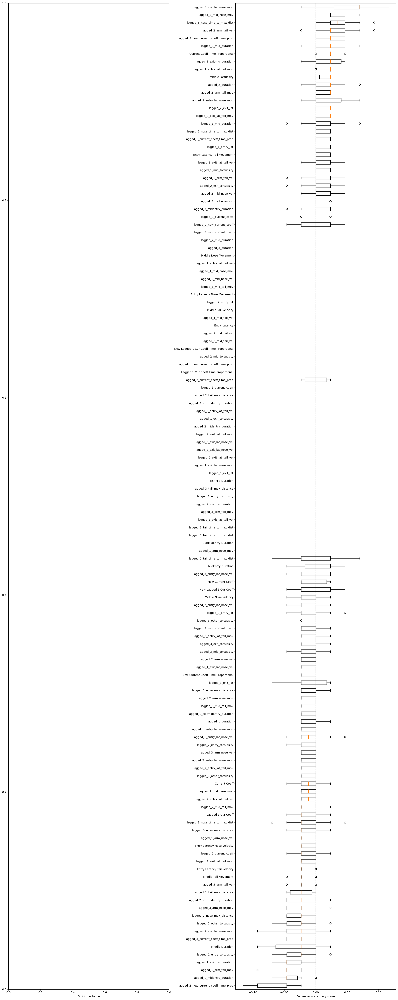

In [7511]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(mod_34, X_test_34, y_test_34, x_main_34,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

In [1586]:
# try tuning part2

In [7539]:
X_train_34TT2, X_test_34TT2, y_train_34TT2, y_test_34TT2 = train_test_split(x_34, y_34, stratify=y_34, random_state=3)

In [7540]:
pos_label, neg_label = 0,1 # dont want to misclassify lows as highs

In [7541]:
def fpr_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    tn, fp, _, _ = cm.ravel()
    tnr = tn / (tn + fp)
    return 1 - tnr

In [7542]:
from sklearn.metrics import make_scorer, precision_score, recall_score

In [7543]:
tpr_score = recall_score  # TPR and recall are the same metric
scoring = {
    "precision": make_scorer(precision_score, pos_label=pos_label),
    "recall": make_scorer(recall_score, pos_label=pos_label),
    "fpr": make_scorer(fpr_score, neg_label=neg_label, pos_label=pos_label),
    "tpr": make_scorer(tpr_score, pos_label=pos_label),
}

In [7564]:
def credit_gain_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    gain_matrix = np.array(
        [
            [0, -16],  # -1 gain for false positives (when a high is classified as low)
            [-16, 0],  # -5 gain for false negatives (when a low is classified as high)
        ]
    )
    return np.sum(cm * gain_matrix)


scoring["credit_gain"] = make_scorer(
    credit_gain_score, neg_label=neg_label, pos_label=pos_label
)

In [7565]:
mod_34TT2 = HistGradientBoostingClassifier(learning_rate = 0.07, n_iter_no_change=20, random_state=57)

In [7566]:
mod_34TT2.fit(X_train_34TT2, y_train_34TT2)

HistGradientBoostingClassifier(learning_rate=0.07, n_iter_no_change=20,
                               random_state=57)

[[13 12]
 [10 18]]


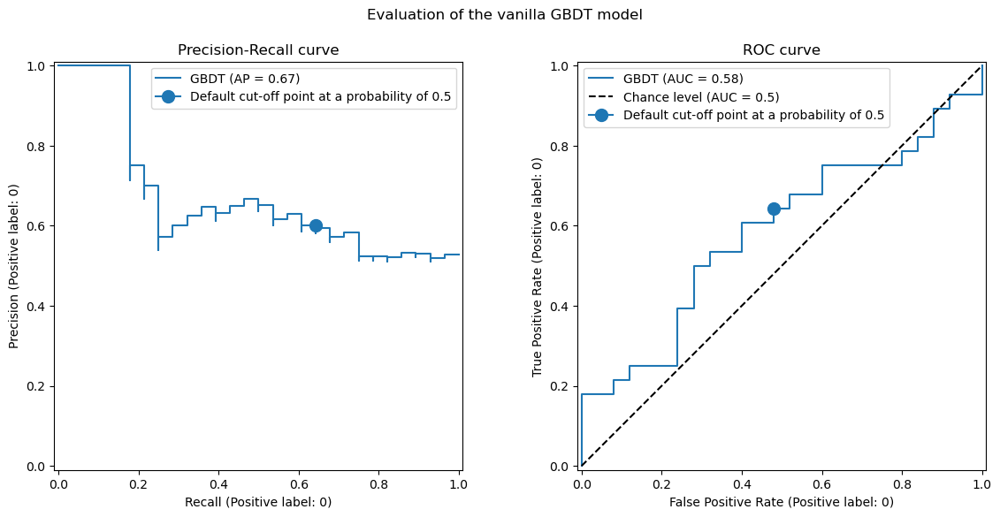

In [7567]:
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

PrecisionRecallDisplay.from_estimator(
    mod_34TT2, X_test_34TT2, y_test_34TT2, pos_label=pos_label, ax=axs[0], name="GBDT"
)
axs[0].plot(
    scoring["recall"](mod_34TT2, X_test_34TT2, y_test_34TT2),
    scoring["precision"](mod_34TT2, X_test_34TT2, y_test_34TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[0].set_title("Precision-Recall curve")
axs[0].legend()

RocCurveDisplay.from_estimator(
    mod_34TT2,
    X_test_34TT2,
    y_test_34TT2,
    pos_label=pos_label,
    ax=axs[1],
    name="GBDT",
    plot_chance_level=True,
)
axs[1].plot(
    scoring["fpr"](mod_34TT2, X_test_34TT2, y_test_34TT2),
    scoring["tpr"](mod_34TT2, X_test_34TT2, y_test_34TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[1].set_title("ROC curve")
axs[1].legend()
_ = fig.suptitle("Evaluation of the vanilla GBDT model")

In [7568]:
sum(y_test_34TT2==1)

25

In [7569]:
print(f"Business defined metric: {scoring['credit_gain'](mod_34TT2, X_test_34TT2, y_test_34TT2)}")

[[13 12]
 [10 18]]
Business defined metric: -352


In [7570]:
from sklearn.model_selection import TunedThresholdClassifierCV

In [7571]:
tuned_model_34TT2 = TunedThresholdClassifierCV(
    estimator=mod_34TT2,
    scoring=scoring["credit_gain"],
    store_cv_results=True,  # necessary to inspect all results
)
tuned_model_34TT2.fit(X_train_34TT2, y_train_34TT2)
print(f"{tuned_model_34TT2.best_threshold_=:0.2f}")

[[ 0 15]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 1 14]
 [ 0 17]]
[[ 2 13]
 [ 0 17]]
[[ 2 13]
 [ 1 16]]
[[ 2 13]
 [ 1 16]]
[[ 2 13]
 [ 1 16]]
[[ 2 13]
 [ 1 16]]
[[ 2 13]
 [ 1 16]]
[[ 2 13]
 [ 1 16]]
[[ 2 13]
 [ 1 16]]
[[ 2 13]
 [ 1 16]]
[[ 3 12]
 [ 2 15]]
[[ 3 12]
 [ 2 15]]
[[ 3 12]
 [ 2 15]]
[[ 4 11]
 [ 2 15]]
[[ 4 11]
 [ 2 15]]
[[ 4 11]
 [ 2 15]]
[[ 4 11]
 [ 2 15]]
[[ 4 11]
 [ 3 14]]
[[ 4 11]
 [ 3 14]]
[[ 4 11]
 [ 3 14]]
[[ 4 11]
 [ 3 14]]
[[ 4 11]
 [ 4 13]]
[[ 4 11]
 [ 4 13]]
[[ 4 11]
 [ 4 13]]
[[ 4 11]
 [ 4 13]]
[[ 4 11]
 [ 4 13]]
[[ 4 11]
 [ 4 13]]
[[ 4 11]
 [ 4 13]]
[[ 4 11]
 [ 5 12]]
[[ 4 11]
 [ 5 12]]
[[ 4 11]
 [ 5 12]]
[[ 4 11]
 [ 5 12]]
[[ 6  9]
 [ 5 12]]
[[ 6  9]
 [ 5 12]]
[[ 6  9]
 [ 5 12]]
[[ 6  9]
 [ 6 11]]
[[ 6  9]
 [ 6 11]]
[[ 6  9]
 [ 7 10]]
[[ 6  9]
 [ 

In [7572]:
def plot_roc_pr_curves(vanilla_model, tuned_model, *, title):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(21, 6))

    linestyles = ("dashed", "dotted")
    markerstyles = ("o", ">")
    colors = ("tab:blue", "tab:orange")
    names = ("Vanilla GBDT", "Tuned GBDT")
    for idx, (est, linestyle, marker, color, name) in enumerate(
        zip((vanilla_model, tuned_model), linestyles, markerstyles, colors, names)
    ):
        decision_threshold = getattr(est, "best_threshold_", 0.5)
        PrecisionRecallDisplay.from_estimator(
            est,
            X_test_34TT2,
            y_test_34TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[0],
            name=name,
        )
        axs[0].plot(
            scoring["recall"](est, X_test_34TT2, y_test_34TT2),
            scoring["precision"](est, X_test_34TT2, y_test_34TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )
        RocCurveDisplay.from_estimator(
            est,
            X_test_34TT2,
            y_test_34TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[1],
            name=name,
            plot_chance_level=idx == 1,
        )
        axs[1].plot(
            scoring["fpr"](est, X_test_34TT2, y_test_34TT2),
            scoring["tpr"](est, X_test_34TT2, y_test_34TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )

    axs[0].set_title("Precision-Recall curve")
    axs[0].legend()
    axs[1].set_title("ROC curve")
    axs[1].legend()

    axs[2].plot(
        tuned_model.cv_results_["thresholds"],
        tuned_model.cv_results_["scores"],
        color="tab:orange",
    )
    axs[2].plot(
        tuned_model.best_threshold_,
        tuned_model.best_score_,
        "o",
        markersize=10,
        color="tab:orange",
        label="Optimal cut-off point for the business metric",
    )
    axs[2].legend()
    axs[2].set_xlabel("Decision threshold (probability)")
    axs[2].set_ylabel("Objective score (using cost-matrix)")
    axs[2].set_title("Objective score as a function of the decision threshold")
    fig.suptitle(title)

[[13 12]
 [10 18]]
[[18  7]
 [14 14]]


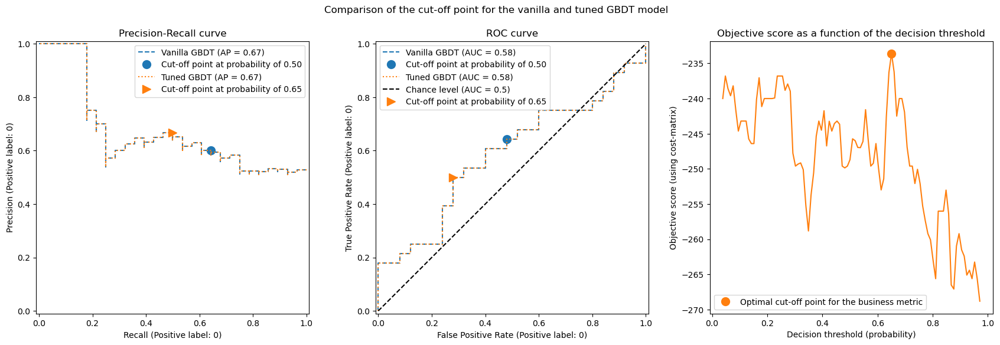

In [7573]:
title = "Comparison of the cut-off point for the vanilla and tuned GBDT model"
plot_roc_pr_curves(mod_34TT2, tuned_model_34TT2, title=title)

In [7574]:
print(f"Business defined metric: {scoring['credit_gain'](tuned_model_34TT2, X_test_34TT2, y_test_34TT2)}")

[[18  7]
 [14 14]]
Business defined metric: -336


In [7575]:
sum(y_test_34TT2==0)

28

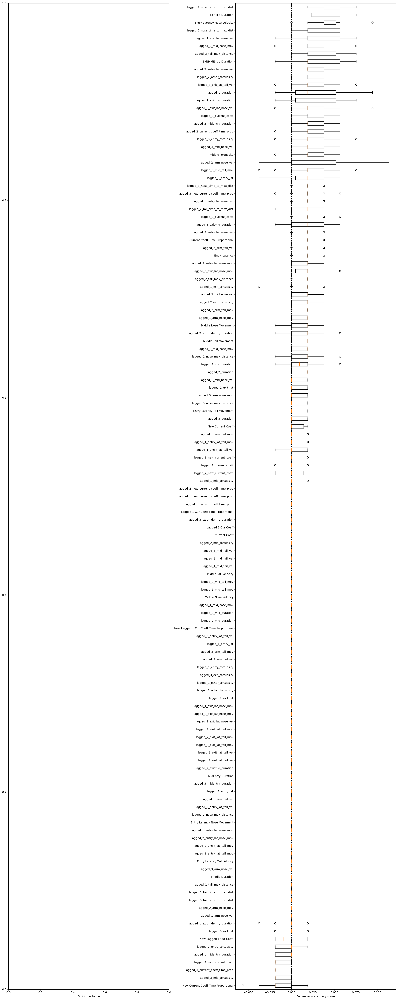

In [7576]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(tuned_model_34TT2, X_test_34TT2, y_test_34TT2, x_main_34,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

# _3(70) vs _4(100) - are 3s distinguishable from 4s? (excluding 23)

In [7595]:
grouped_lagged_added_stats_ri_e3 = grouped_lagged_added_stats_ri.iloc[:,:][(grouped_lagged_added_stats_ri['Choice Output']==3)&(grouped_lagged_added_stats_ri['lagged_1_choice_ago']>2)]

In [7596]:
grouped_lagged_added_stats_ri_e3['Binary']=0

In [7597]:
grouped_lagged_added_stats_ri_4 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']==4]

In [7598]:
grouped_lagged_added_stats_ri_4['Binary']=1

In [7599]:
grouped_lagged_binarye34 = pd.concat([grouped_lagged_added_stats_ri_e3, grouped_lagged_added_stats_ri_4])

In [7600]:
grouped_lagged_binarye34_ri = grouped_lagged_binarye34.reset_index(drop=True)

In [7601]:
x_main_e34= grouped_lagged_binarye34_ri.drop(columns = ['Choice Output', 'Duration', 'Exit Latency', 
        'Nose Max Distance', 'Nose Time to Max Dist', 'Tail Base Max Distance', 'Tail Base Time to Max Dist', 'Entry Tortuosity', 'Exit Tortuosity',
        'Other Tortuosity', 'Arm Nose Movement', 'Arm Nose Velocity', 'Arm Tail Movement', 'Arm Tail Velocity',
       
        'lagged_1_lagged_1_cur_coeff',
       'lagged_2_lagged_1_cur_coeff', 'lagged_3_lagged_1_cur_coeff',
       'lagged_4_lagged_1_cur_coeff',
       'lagged_1_lagged_2_cur_coeff', 'lagged_2_lagged_2_cur_coeff',
       'lagged_3_lagged_2_cur_coeff', 'lagged_4_lagged_2_cur_coeff',
       'lagged_1_lagged_3_cur_coeff',
       'lagged_2_lagged_3_cur_coeff', 'lagged_3_lagged_3_cur_coeff',
       'lagged_4_lagged_3_cur_coeff', 
       'lagged_1_lagged_4_cur_coeff', 'lagged_2_lagged_4_cur_coeff',
       'lagged_3_lagged_4_cur_coeff', 'lagged_4_lagged_4_cur_coeff',
       
       
       'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop',
       'lagged_3_lagged_1_cur_coeff_time_prop',
       'lagged_4_lagged_1_cur_coeff_time_prop',
       
       'lagged_1_lagged_2_cur_coeff_time_prop',
       'lagged_2_lagged_2_cur_coeff_time_prop',
       'lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop',
       
       'lagged_1_lagged_3_cur_coeff_time_prop',
       'lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop',
       'lagged_4_lagged_3_cur_coeff_time_prop',
       
       'lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop',
       'lagged_3_lagged_4_cur_coeff_time_prop',
       'lagged_4_lagged_4_cur_coeff_time_prop',
                                                                                                             
                                                                                                             
        'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop','lagged_3_lagged_1_cur_coeff_time_prop','lagged_4_lagged_1_cur_coeff_time_prop',
       'lagged_1_lagged_2_cur_coeff_time_prop','lagged_2_lagged_2_cur_coeff_time_prop','lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop','lagged_1_lagged_3_cur_coeff_time_prop','lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop','lagged_4_lagged_3_cur_coeff_time_prop','lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop','lagged_3_lagged_4_cur_coeff_time_prop','lagged_4_lagged_4_cur_coeff_time_prop', 
        'Turn', 'lagged_1_turn_ago', 'lagged_2_turn_ago', 'lagged_3_turn_ago', 'lagged_4_turn_ago', 
        '2_cur_arm_duration', '3_cur_arm_duration', '4_cur_arm_duration',
       '5_cur_arm_duration', 'mean_2_cur_arm_duration',
       'mean_3_cur_arm_duration', 'mean_4_cur_arm_duration',
       'mean_5_cur_arm_duration', '2_past_arm_duration', '3_past_arm_duration',
       '4_past_arm_duration', 'mean_2_past_arm_duration',
       'mean_3_past_arm_duration', 'mean_4_past_arm_duration',
       '2_past_mid_duration', '3_past_mid_duration', '4_past_mid_duration',
       '5_past_mid_duration', 'mean_2_past_mid_duration',
       'mean_3_past_mid_duration', 'mean_4_past_mid_duration',
       'mean_5_past_mid_duration', '2_past_exitmid_duration',
       '3_past_exitmid_duration', '4_past_exitmid_duration',
       '5_past_exitmid_duration', 'mean_2_past_exitmid_duration',
       'mean_3_past_exitmid_duration', 'mean_4_past_exitmid_duration',
       'mean_5_past_exitmid_duration', '2_past_midentry_duration',
       '3_past_midentry_duration', '4_past_midentry_duration',
       '5_past_midentry_duration', 'mean_2_past_midentry_duration',
       'mean_3_past_midentry_duration', 'mean_4_past_midentry_duration',
       'mean_5_past_midentry_duration', '2_past_exitmidentry_duration',
       '3_past_exitmidentry_duration', '4_past_exitmidentry_duration',
       '5_past_exitmidentry_duration', 'mean_2_past_exitmidentry_duration',
       'mean_3_past_exitmidentry_duration',
       'mean_4_past_exitmidentry_duration',
       'mean_5_past_exitmidentry_duration',
                                                                                                               
        'lagged_1_choice_ago', 'lagged_2_choice_ago', 'lagged_3_choice_ago',
       'lagged_4_choice_ago',
        'lagged_1_new_lagged_1_cur_coeff',
        'lagged_2_new_lagged_1_cur_coeff', 
        'lagged_3_new_lagged_1_cur_coeff','lagged_4_new_lagged_1_cur_coeff','lagged_1_new_lagged_2_cur_coeff', 'lagged_2_new_lagged_2_cur_coeff', 
        'lagged_3_new_lagged_2_cur_coeff', 'lagged_4_new_lagged_2_cur_coeff','lagged_1_new_lagged_3_cur_coeff','lagged_2_new_lagged_3_cur_coeff', 
        'lagged_3_new_lagged_3_cur_coeff','lagged_4_new_lagged_3_cur_coeff','lagged_1_new_lagged_4_cur_coeff', 'lagged_2_new_lagged_4_cur_coeff',
        'lagged_3_new_lagged_4_cur_coeff', 'lagged_4_new_lagged_4_cur_coeff','lagged_1_new_lagged_1_cur_coeff_time_prop',
       'lagged_2_new_lagged_1_cur_coeff_time_prop','lagged_3_new_lagged_1_cur_coeff_time_prop','lagged_4_new_lagged_1_cur_coeff_time_prop',
       'lagged_1_new_lagged_2_cur_coeff_time_prop','lagged_2_new_lagged_2_cur_coeff_time_prop','lagged_3_new_lagged_2_cur_coeff_time_prop',
       'lagged_4_new_lagged_2_cur_coeff_time_prop','lagged_1_new_lagged_3_cur_coeff_time_prop','lagged_2_new_lagged_3_cur_coeff_time_prop',
       'lagged_3_new_lagged_3_cur_coeff_time_prop','lagged_4_new_lagged_3_cur_coeff_time_prop','lagged_1_new_lagged_4_cur_coeff_time_prop',
       'lagged_2_new_lagged_4_cur_coeff_time_prop','lagged_3_new_lagged_4_cur_coeff_time_prop','lagged_4_new_lagged_4_cur_coeff_time_prop',
        'Exit Latency Nose Movement', 'Exit Latency Nose Velocity', 'Exit Latency Tail Movement', 'Exit Latency Tail Velocity',
       'lagged_4_mid_duration',
       'lagged_4_mid_nose_mov','lagged_4_mid_nose_vel',
       'lagged_4_mid_tail_mov', 'lagged_4_mid_tail_vel', 'lagged_4_mid_tortuosity',                                              
         'lagged_4_current_coeff', 'Lagged 4 Cur Coeff', 
        'lagged_4_new_current_coeff',   'New Lagged 4 Cur Coeff',                                          
        'lagged_4_current_coeff_time_prop',                                                
         'Lagged 4 Cur Coeff Time Proportional',
       'lagged_4_new_current_coeff_time_prop',  'New Lagged 4 Cur Coeff Time Proportional',                                            
       'lagged_4_entry_lat', 'lagged_4_entry_lat_nose_mov',
       'lagged_4_entry_lat_nose_vel', 'lagged_4_entry_lat_tail_mov',
       'lagged_4_entry_lat_tail_vel', 'lagged_4_duration',
       'lagged_4_nose_max_distance', 'lagged_4_nose_time_to_max_dist',
       'lagged_4_tail_max_distance', 'lagged_4_tail_time_to_max_dist',                                         
       'lagged_4_arm_nose_mov', 'lagged_4_arm_nose_vel',                                                 
        'lagged_4_arm_tail_mov', 'lagged_4_arm_tail_vel',
       'lagged_4_entry_tortuosity', 'lagged_4_exit_tortuosity',
       'lagged_4_other_tortuosity', 'lagged_4_exit_lat',
       'lagged_4_exit_lat_nose_mov', 'lagged_4_exit_lat_nose_vel',
       'lagged_4_exit_lat_tail_mov', 'lagged_4_exit_lat_tail_vel',
       'lagged_4_exitmid_duration', 'lagged_4_midentry_duration',
       'lagged_4_exitmidentry_duration', 'Binary',
       'Lagged 2 Cur Coeff',  'New Lagged 2 Cur Coeff', 'Lagged 2 Cur Coeff Time Proportional', 'New Lagged 2 Cur Coeff Time Proportional',
        'Lagged 3 Cur Coeff','New Lagged 3 Cur Coeff','Lagged 3 Cur Coeff Time Proportional', 'New Lagged 3 Cur Coeff Time Proportional',
                                                        
                                                        ])


# 


In [7602]:
x_main_e34.columns[:100]

Index(['Middle Duration', 'lagged_1_mid_duration', 'lagged_2_mid_duration',
       'lagged_3_mid_duration', 'Middle Nose Movement',
       'lagged_1_mid_nose_mov', 'lagged_2_mid_nose_mov',
       'lagged_3_mid_nose_mov', 'Middle Nose Velocity',
       'lagged_1_mid_nose_vel', 'lagged_2_mid_nose_vel',
       'lagged_3_mid_nose_vel', 'Middle Tail Movement',
       'lagged_1_mid_tail_mov', 'lagged_2_mid_tail_mov',
       'lagged_3_mid_tail_mov', 'Middle Tail Velocity',
       'lagged_1_mid_tail_vel', 'lagged_2_mid_tail_vel',
       'lagged_3_mid_tail_vel', 'Middle Tortuosity', 'lagged_1_mid_tortuosity',
       'lagged_2_mid_tortuosity', 'lagged_3_mid_tortuosity', 'Current Coeff',
       'lagged_1_current_coeff', 'lagged_2_current_coeff',
       'lagged_3_current_coeff', 'Lagged 1 Cur Coeff', 'New Current Coeff',
       'lagged_1_new_current_coeff', 'lagged_2_new_current_coeff',
       'lagged_3_new_current_coeff', 'New Lagged 1 Cur Coeff',
       'Current Coeff Time Proportional', 'lagged

In [7603]:
x_e34 = x_main_e34.values

In [7604]:
y_e34 = grouped_lagged_binarye34_ri['Binary'].values

In [7645]:
X_train_e34, X_test_e34, y_train_e34, y_test_e34 = train_test_split(x_e34, y_e34, test_size=0.2, random_state=55)

In [7646]:
mod_e34 =  HistGradientBoostingClassifier(learning_rate = 0.15, validation_fraction=0.1, n_iter_no_change=20, random_state=5)
mod_e34.fit(X_train_e34, y_train_e34)
y_pred_e34=mod_e34.predict(X_test_e34)

In [7647]:
mod_e34.n_iter_

100

In [7648]:
target_names = ['0', '1']

In [7649]:
f1_sc_e34 = f1_score(y_test_e34, y_pred_e34, average = 'weighted')
f1_sc_e34

0.480243161094225

In [7650]:
p_sc_e34 = precision_score(y_test_e34, y_pred_e34, average = 'weighted')
p_sc_e34

0.4666666666666666

In [7651]:
cf_matrix_e34 = confusion_matrix(y_test_e34, y_pred_e34)
cf_matrix_e34

array([[ 2, 10],
       [ 7, 15]], dtype=int64)

In [7652]:
print(classification_report(y_test_e34, y_pred_e34, target_names=target_names))

              precision    recall  f1-score   support

           0       0.22      0.17      0.19        12
           1       0.60      0.68      0.64        22

    accuracy                           0.50        34
   macro avg       0.41      0.42      0.41        34
weighted avg       0.47      0.50      0.48        34



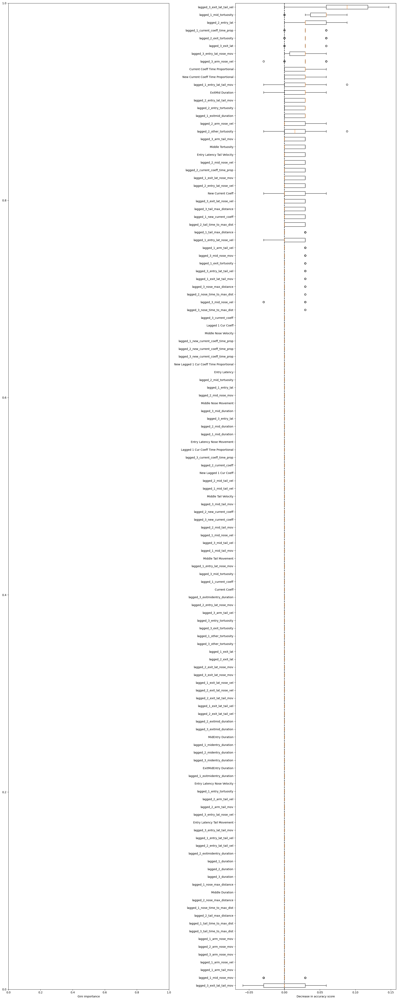

In [3625]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(mod_e34, X_test_e34, y_test_e34, x_main_e34,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

In [3626]:
# try tuning part2

In [7692]:
X_train_e34TT2, X_test_e34TT2, y_train_e34TT2, y_test_e34TT2 = train_test_split(x_e34, y_e34, stratify=y_e34, random_state=41)

In [7693]:
pos_label, neg_label = 0,1 # dont want to misclassify lows as highs

In [7694]:
def fpr_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    tn, fp, _, _ = cm.ravel()
    tnr = tn / (tn + fp)
    return 1 - tnr

In [7695]:
from sklearn.metrics import make_scorer, precision_score, recall_score

In [7696]:
tpr_score = recall_score  # TPR and recall are the same metric
scoring = {
    "precision": make_scorer(precision_score, pos_label=pos_label),
    "recall": make_scorer(recall_score, pos_label=pos_label),
    "fpr": make_scorer(fpr_score, neg_label=neg_label, pos_label=pos_label),
    "tpr": make_scorer(tpr_score, pos_label=pos_label),
}

In [7719]:
def credit_gain_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    gain_matrix = np.array(
        [
            [0, -2],  # -1 gain for false positives (when a high is classified as low)
            [-4, 0],  # -5 gain for false negatives (when a low is classified as high)
        ]
    )
    return np.sum(cm * gain_matrix)


scoring["credit_gain"] = make_scorer(
    credit_gain_score, neg_label=neg_label, pos_label=pos_label
)

In [7732]:
mod_e34TT2 = HistGradientBoostingClassifier(learning_rate = 0.07, n_iter_no_change=20, random_state=57)

In [7733]:
mod_e34TT2.fit(X_train_e34TT2, y_train_e34TT2)

HistGradientBoostingClassifier(learning_rate=0.07, n_iter_no_change=20,
                               random_state=57)

[[14 11]
 [14  4]]


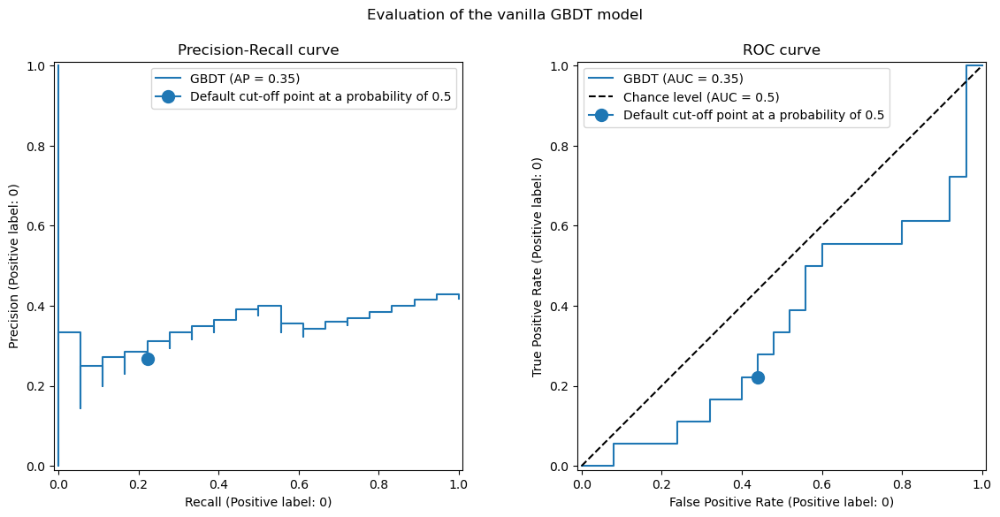

In [7734]:
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

PrecisionRecallDisplay.from_estimator(
    mod_e34TT2, X_test_e34TT2, y_test_e34TT2, pos_label=pos_label, ax=axs[0], name="GBDT"
)
axs[0].plot(
    scoring["recall"](mod_e34TT2, X_test_e34TT2, y_test_e34TT2),
    scoring["precision"](mod_e34TT2, X_test_e34TT2, y_test_e34TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[0].set_title("Precision-Recall curve")
axs[0].legend()

RocCurveDisplay.from_estimator(
    mod_e34TT2,
    X_test_e34TT2,
    y_test_e34TT2,
    pos_label=pos_label,
    ax=axs[1],
    name="GBDT",
    plot_chance_level=True,
)
axs[1].plot(
    scoring["fpr"](mod_e34TT2, X_test_e34TT2, y_test_e34TT2),
    scoring["tpr"](mod_e34TT2, X_test_e34TT2, y_test_e34TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[1].set_title("ROC curve")
axs[1].legend()
_ = fig.suptitle("Evaluation of the vanilla GBDT model")

In [7723]:
sum(y_test_e34TT2==1)

25

In [7724]:
print(f"Business defined metric: {scoring['credit_gain'](mod_e34TT2, X_test_e34TT2, y_test_e34TT2)}")

[[14 11]
 [14  4]]
Business defined metric: -78


In [7725]:
from sklearn.model_selection import TunedThresholdClassifierCV

In [7726]:
tuned_model_e34TT2 = TunedThresholdClassifierCV(
    estimator=mod_e34TT2,
    scoring=scoring["credit_gain"],
    store_cv_results=True,  # necessary to inspect all results
)
tuned_model_e34TT2.fit(X_train_e34TT2, y_train_e34TT2)
print(f"{tuned_model_e34TT2.best_threshold_=:0.2f}")

[[ 0 15]
 [ 0 11]]
[[ 2 13]
 [ 1 10]]
[[ 3 12]
 [ 2  9]]
[[ 4 11]
 [ 2  9]]
[[ 4 11]
 [ 2  9]]
[[ 4 11]
 [ 3  8]]
[[ 5 10]
 [ 3  8]]
[[ 5 10]
 [ 4  7]]
[[ 5 10]
 [ 4  7]]
[[ 5 10]
 [ 5  6]]
[[ 5 10]
 [ 5  6]]
[[ 5 10]
 [ 5  6]]
[[6 9]
 [5 6]]
[[6 9]
 [6 5]]
[[6 9]
 [6 5]]
[[6 9]
 [6 5]]
[[6 9]
 [7 4]]
[[7 8]
 [7 4]]
[[7 8]
 [7 4]]
[[7 8]
 [7 4]]
[[7 8]
 [7 4]]
[[7 8]
 [7 4]]
[[8 7]
 [7 4]]
[[8 7]
 [8 3]]
[[8 7]
 [8 3]]
[[8 7]
 [9 2]]
[[8 7]
 [9 2]]
[[8 7]
 [9 2]]
[[8 7]
 [9 2]]
[[8 7]
 [9 2]]
[[8 7]
 [9 2]]
[[ 8  7]
 [10  1]]
[[ 8  7]
 [10  1]]
[[ 8  7]
 [10  1]]
[[ 8  7]
 [10  1]]
[[ 8  7]
 [10  1]]
[[ 8  7]
 [10  1]]
[[ 8  7]
 [10  1]]
[[ 8  7]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [10  1]]
[[ 9  6]
 [1

In [7727]:
def plot_roc_pr_curves(vanilla_model, tuned_model, *, title):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(21, 6))

    linestyles = ("dashed", "dotted")
    markerstyles = ("o", ">")
    colors = ("tab:blue", "tab:orange")
    names = ("Vanilla GBDT", "Tuned GBDT")
    for idx, (est, linestyle, marker, color, name) in enumerate(
        zip((vanilla_model, tuned_model), linestyles, markerstyles, colors, names)
    ):
        decision_threshold = getattr(est, "best_threshold_", 0.5)
        PrecisionRecallDisplay.from_estimator(
            est,
            X_test_e34TT2,
            y_test_e34TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[0],
            name=name,
        )
        axs[0].plot(
            scoring["recall"](est, X_test_e34TT2, y_test_e34TT2),
            scoring["precision"](est, X_test_e34TT2, y_test_e34TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )
        RocCurveDisplay.from_estimator(
            est,
            X_test_e34TT2,
            y_test_e34TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[1],
            name=name,
            plot_chance_level=idx == 1,
        )
        axs[1].plot(
            scoring["fpr"](est, X_test_e34TT2, y_test_e34TT2),
            scoring["tpr"](est, X_test_e34TT2, y_test_e34TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )

    axs[0].set_title("Precision-Recall curve")
    axs[0].legend()
    axs[1].set_title("ROC curve")
    axs[1].legend()

    axs[2].plot(
        tuned_model.cv_results_["thresholds"],
        tuned_model.cv_results_["scores"],
        color="tab:orange",
    )
    axs[2].plot(
        tuned_model.best_threshold_,
        tuned_model.best_score_,
        "o",
        markersize=10,
        color="tab:orange",
        label="Optimal cut-off point for the business metric",
    )
    axs[2].legend()
    axs[2].set_xlabel("Decision threshold (probability)")
    axs[2].set_ylabel("Objective score (using cost-matrix)")
    axs[2].set_title("Objective score as a function of the decision threshold")
    fig.suptitle(title)

[[14 11]
 [14  4]]
[[ 0 25]
 [ 0 18]]


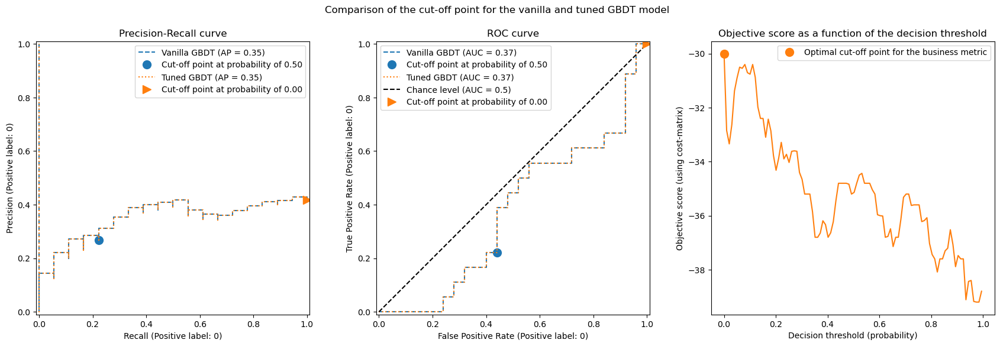

In [7728]:
title = "Comparison of the cut-off point for the vanilla and tuned GBDT model"
plot_roc_pr_curves(mod_e34TT2, tuned_model_e34TT2, title=title)

In [3875]:
print(f"Business defined metric: {scoring['credit_gain'](tuned_model_e34TT2, X_test_e34TT2, y_test_e34TT2)}")

[[ 0 25]
 [ 0 18]]
Business defined metric: -75


In [2735]:
sum(y_test_e34TT2==0)

18

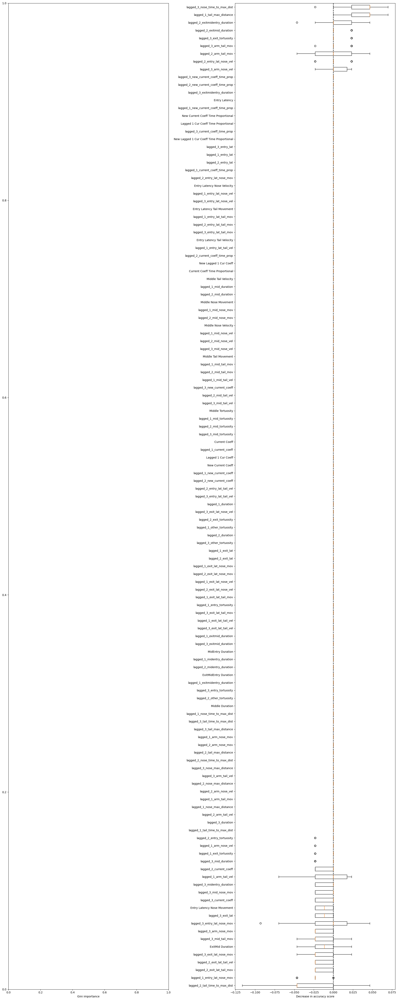

In [2736]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(tuned_model_e34TT2, X_test_e34TT2, y_test_e34TT2, x_main_e34,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

# _3(111) vs _5(51) - are 3s distinguishable from 5s?

In [2774]:
grouped_lagged_added_stats_ri_3 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']==3]

In [2775]:
grouped_lagged_added_stats_ri_3['Binary']=0

In [2776]:
grouped_lagged_added_stats_ri_5 = grouped_lagged_added_stats_ri.iloc[:,:][grouped_lagged_added_stats_ri['Choice Output']==5]

In [2779]:
grouped_lagged_added_stats_ri_5['Binary']=1

In [2782]:
grouped_lagged_binary35 = pd.concat([grouped_lagged_added_stats_ri_3, grouped_lagged_added_stats_ri_5])

In [2783]:
grouped_lagged_binary35_ri = grouped_lagged_binary35.reset_index(drop=True)

In [2788]:
x_main_35= grouped_lagged_binary35_ri.drop(columns = ['Choice Output', 'Duration', 'Exit Latency', 
        'Nose Max Distance', 'Nose Time to Max Dist', 'Tail Base Max Distance', 'Tail Base Time to Max Dist', 'Entry Tortuosity', 'Exit Tortuosity',
        'Other Tortuosity', 'Arm Nose Movement', 'Arm Nose Velocity', 'Arm Tail Movement', 'Arm Tail Velocity',
       
        'lagged_1_lagged_1_cur_coeff',
       'lagged_2_lagged_1_cur_coeff', 'lagged_3_lagged_1_cur_coeff',
       'lagged_4_lagged_1_cur_coeff',
       'lagged_1_lagged_2_cur_coeff', 'lagged_2_lagged_2_cur_coeff',
       'lagged_3_lagged_2_cur_coeff', 'lagged_4_lagged_2_cur_coeff',
       'lagged_1_lagged_3_cur_coeff',
       'lagged_2_lagged_3_cur_coeff', 'lagged_3_lagged_3_cur_coeff',
       'lagged_4_lagged_3_cur_coeff', 
       'lagged_1_lagged_4_cur_coeff', 'lagged_2_lagged_4_cur_coeff',
       'lagged_3_lagged_4_cur_coeff', 'lagged_4_lagged_4_cur_coeff',
       
       
       'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop',
       'lagged_3_lagged_1_cur_coeff_time_prop',
       'lagged_4_lagged_1_cur_coeff_time_prop',
       
       'lagged_1_lagged_2_cur_coeff_time_prop',
       'lagged_2_lagged_2_cur_coeff_time_prop',
       'lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop',
       
       'lagged_1_lagged_3_cur_coeff_time_prop',
       'lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop',
       'lagged_4_lagged_3_cur_coeff_time_prop',
       
       'lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop',
       'lagged_3_lagged_4_cur_coeff_time_prop',
       'lagged_4_lagged_4_cur_coeff_time_prop',
                                                                                                             
                                                                                                             
        'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop','lagged_3_lagged_1_cur_coeff_time_prop','lagged_4_lagged_1_cur_coeff_time_prop',
       'lagged_1_lagged_2_cur_coeff_time_prop','lagged_2_lagged_2_cur_coeff_time_prop','lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop','lagged_1_lagged_3_cur_coeff_time_prop','lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop','lagged_4_lagged_3_cur_coeff_time_prop','lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop','lagged_3_lagged_4_cur_coeff_time_prop','lagged_4_lagged_4_cur_coeff_time_prop', 
        'Turn', 'lagged_1_turn_ago', 'lagged_2_turn_ago', 'lagged_3_turn_ago', 'lagged_4_turn_ago', 
        '2_cur_arm_duration', '3_cur_arm_duration', '4_cur_arm_duration',
       '5_cur_arm_duration', 'mean_2_cur_arm_duration',
       'mean_3_cur_arm_duration', 'mean_4_cur_arm_duration',
       'mean_5_cur_arm_duration', '2_past_arm_duration', '3_past_arm_duration',
       '4_past_arm_duration', 'mean_2_past_arm_duration',
       'mean_3_past_arm_duration', 'mean_4_past_arm_duration',
       '2_past_mid_duration', '3_past_mid_duration', '4_past_mid_duration',
       '5_past_mid_duration', 'mean_2_past_mid_duration',
       'mean_3_past_mid_duration', 'mean_4_past_mid_duration',
       'mean_5_past_mid_duration', '2_past_exitmid_duration',
       '3_past_exitmid_duration', '4_past_exitmid_duration',
       '5_past_exitmid_duration', 'mean_2_past_exitmid_duration',
       'mean_3_past_exitmid_duration', 'mean_4_past_exitmid_duration',
       'mean_5_past_exitmid_duration', '2_past_midentry_duration',
       '3_past_midentry_duration', '4_past_midentry_duration',
       '5_past_midentry_duration', 'mean_2_past_midentry_duration',
       'mean_3_past_midentry_duration', 'mean_4_past_midentry_duration',
       'mean_5_past_midentry_duration', '2_past_exitmidentry_duration',
       '3_past_exitmidentry_duration', '4_past_exitmidentry_duration',
       '5_past_exitmidentry_duration', 'mean_2_past_exitmidentry_duration',
       'mean_3_past_exitmidentry_duration',
       'mean_4_past_exitmidentry_duration',
       'mean_5_past_exitmidentry_duration',
                                                                                                               
        'lagged_1_choice_ago', 'lagged_2_choice_ago', 'lagged_3_choice_ago',
       'lagged_4_choice_ago',
        'lagged_1_new_lagged_1_cur_coeff',
        'lagged_2_new_lagged_1_cur_coeff', 
        'lagged_3_new_lagged_1_cur_coeff','lagged_4_new_lagged_1_cur_coeff','lagged_1_new_lagged_2_cur_coeff', 'lagged_2_new_lagged_2_cur_coeff', 
        'lagged_3_new_lagged_2_cur_coeff', 'lagged_4_new_lagged_2_cur_coeff','lagged_1_new_lagged_3_cur_coeff','lagged_2_new_lagged_3_cur_coeff', 
        'lagged_3_new_lagged_3_cur_coeff','lagged_4_new_lagged_3_cur_coeff','lagged_1_new_lagged_4_cur_coeff', 'lagged_2_new_lagged_4_cur_coeff',
        'lagged_3_new_lagged_4_cur_coeff', 'lagged_4_new_lagged_4_cur_coeff','lagged_1_new_lagged_1_cur_coeff_time_prop',
       'lagged_2_new_lagged_1_cur_coeff_time_prop','lagged_3_new_lagged_1_cur_coeff_time_prop','lagged_4_new_lagged_1_cur_coeff_time_prop',
       'lagged_1_new_lagged_2_cur_coeff_time_prop','lagged_2_new_lagged_2_cur_coeff_time_prop','lagged_3_new_lagged_2_cur_coeff_time_prop',
       'lagged_4_new_lagged_2_cur_coeff_time_prop','lagged_1_new_lagged_3_cur_coeff_time_prop','lagged_2_new_lagged_3_cur_coeff_time_prop',
       'lagged_3_new_lagged_3_cur_coeff_time_prop','lagged_4_new_lagged_3_cur_coeff_time_prop','lagged_1_new_lagged_4_cur_coeff_time_prop',
       'lagged_2_new_lagged_4_cur_coeff_time_prop','lagged_3_new_lagged_4_cur_coeff_time_prop','lagged_4_new_lagged_4_cur_coeff_time_prop',
        'Exit Latency Nose Movement', 'Exit Latency Nose Velocity', 'Exit Latency Tail Movement', 'Exit Latency Tail Velocity',
       'lagged_4_mid_duration',
       'lagged_4_mid_nose_mov','lagged_4_mid_nose_vel',
       'lagged_4_mid_tail_mov', 'lagged_4_mid_tail_vel', 'lagged_4_mid_tortuosity',                                              
         'lagged_4_current_coeff', 'Lagged 4 Cur Coeff', 
        'lagged_4_new_current_coeff',   'New Lagged 4 Cur Coeff',                                          
        'lagged_4_current_coeff_time_prop',                                                
         'Lagged 4 Cur Coeff Time Proportional',
       'lagged_4_new_current_coeff_time_prop',  'New Lagged 4 Cur Coeff Time Proportional',                                            
       'lagged_4_entry_lat', 'lagged_4_entry_lat_nose_mov',
       'lagged_4_entry_lat_nose_vel', 'lagged_4_entry_lat_tail_mov',
       'lagged_4_entry_lat_tail_vel', 'lagged_4_duration',
       'lagged_4_nose_max_distance', 'lagged_4_nose_time_to_max_dist',
       'lagged_4_tail_max_distance', 'lagged_4_tail_time_to_max_dist',                                         
       'lagged_4_arm_nose_mov', 'lagged_4_arm_nose_vel',                                                 
        'lagged_4_arm_tail_mov', 'lagged_4_arm_tail_vel',
       'lagged_4_entry_tortuosity', 'lagged_4_exit_tortuosity',
       'lagged_4_other_tortuosity', 'lagged_4_exit_lat',
       'lagged_4_exit_lat_nose_mov', 'lagged_4_exit_lat_nose_vel',
       'lagged_4_exit_lat_tail_mov', 'lagged_4_exit_lat_tail_vel',
       'lagged_4_exitmid_duration', 'lagged_4_midentry_duration',
       'lagged_4_exitmidentry_duration', 'Binary',
       'Lagged 2 Cur Coeff',  'New Lagged 2 Cur Coeff', 'Lagged 2 Cur Coeff Time Proportional', 'New Lagged 2 Cur Coeff Time Proportional',                                            
       'Lagged 3 Cur Coeff','New Lagged 3 Cur Coeff','Lagged 3 Cur Coeff Time Proportional', 'New Lagged 3 Cur Coeff Time Proportional'                                                
                                                        ])


# 'Lagged 3 Cur Coeff','New Lagged 3 Cur Coeff','Lagged 3 Cur Coeff Time Proportional', 'New Lagged 3 Cur Coeff Time Proportional',


In [2789]:
x_main_35.columns[:100]

Index(['Middle Duration', 'lagged_1_mid_duration', 'lagged_2_mid_duration',
       'lagged_3_mid_duration', 'Middle Nose Movement',
       'lagged_1_mid_nose_mov', 'lagged_2_mid_nose_mov',
       'lagged_3_mid_nose_mov', 'Middle Nose Velocity',
       'lagged_1_mid_nose_vel', 'lagged_2_mid_nose_vel',
       'lagged_3_mid_nose_vel', 'Middle Tail Movement',
       'lagged_1_mid_tail_mov', 'lagged_2_mid_tail_mov',
       'lagged_3_mid_tail_mov', 'Middle Tail Velocity',
       'lagged_1_mid_tail_vel', 'lagged_2_mid_tail_vel',
       'lagged_3_mid_tail_vel', 'Middle Tortuosity', 'lagged_1_mid_tortuosity',
       'lagged_2_mid_tortuosity', 'lagged_3_mid_tortuosity', 'Current Coeff',
       'lagged_1_current_coeff', 'lagged_2_current_coeff',
       'lagged_3_current_coeff', 'Lagged 1 Cur Coeff', 'New Current Coeff',
       'lagged_1_new_current_coeff', 'lagged_2_new_current_coeff',
       'lagged_3_new_current_coeff', 'New Lagged 1 Cur Coeff',
       'Current Coeff Time Proportional', 'lagged

In [2790]:
x_35 = x_main_35.values

In [2791]:
y_35 = grouped_lagged_binary35_ri['Binary'].values

In [3020]:
X_train_35, X_test_35, y_train_35, y_test_35 = train_test_split(x_35, y_35, test_size=0.2, random_state=4)

In [3058]:
mod_35 =  HistGradientBoostingClassifier(learning_rate = 0.17, validation_fraction=0.1, n_iter_no_change=20, random_state=59)
mod_35.fit(X_train_35, y_train_35)
y_pred_35=mod_35.predict(X_test_35)

In [3059]:
mod_35.n_iter_

100

In [3060]:
target_names = ['0', '1']

In [3061]:
f1_sc_35 = f1_score(y_test_35, y_pred_35, average = 'weighted')
f1_sc_35

0.8104545454545455

In [3062]:
p_sc_35 = precision_score(y_test_35, y_pred_35, average = 'weighted')
p_sc_35

0.8101898101898102

In [3063]:
cf_matrix_35 = confusion_matrix(y_test_35, y_pred_35)
cf_matrix_35

array([[22,  2],
       [ 4,  5]], dtype=int64)

In [3064]:
print(classification_report(y_test_35, y_pred_35, target_names=target_names))

              precision    recall  f1-score   support

           0       0.85      0.92      0.88        24
           1       0.71      0.56      0.62         9

    accuracy                           0.82        33
   macro avg       0.78      0.74      0.75        33
weighted avg       0.81      0.82      0.81        33



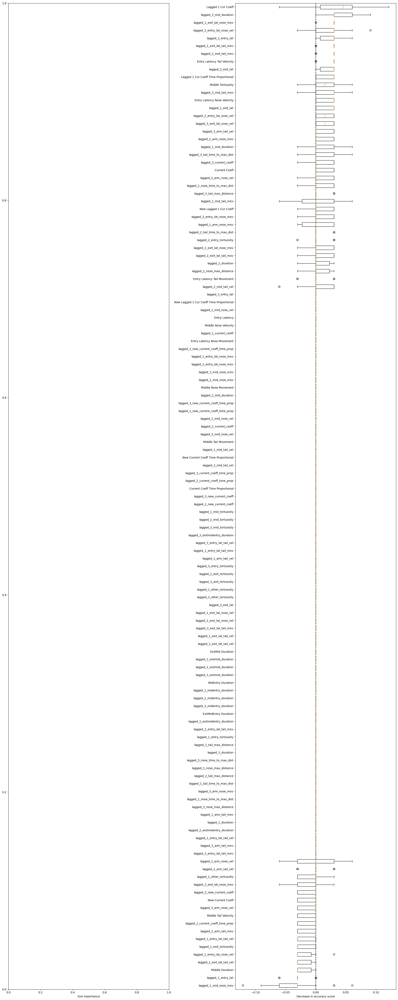

In [2800]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(mod_35, X_test_35, y_test_35, x_main_35,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

In [ ]:
# try tuning part2

In [3569]:
X_train_35TT2, X_test_35TT2, y_train_35TT2, y_test_35TT2 = train_test_split(x_35, y_35, stratify=y_35, random_state=54)

In [3570]:
pos_label, neg_label = 0,1 # dont want to misclassify lows as highs

In [3571]:
def fpr_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    tn, fp, _, _ = cm.ravel()
    tnr = tn / (tn + fp)
    return 1 - tnr

In [3572]:
from sklearn.metrics import make_scorer, precision_score, recall_score

In [3573]:
tpr_score = recall_score  # TPR and recall are the same metric
scoring = {
    "precision": make_scorer(precision_score, pos_label=pos_label),
    "recall": make_scorer(recall_score, pos_label=pos_label),
    "fpr": make_scorer(fpr_score, neg_label=neg_label, pos_label=pos_label),
    "tpr": make_scorer(tpr_score, pos_label=pos_label),
}

In [3594]:
def credit_gain_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    gain_matrix = np.array(
        [
            [0, -14],  # -1 gain for false positives (when a high is classified as low)
            [-7, 0],  # -5 gain for false negatives (when a low is classified as high)
        ]
    )
    return np.sum(cm * gain_matrix)


scoring["credit_gain"] = make_scorer(
    credit_gain_score, neg_label=neg_label, pos_label=pos_label
)

In [3595]:
mod_35TT2 = HistGradientBoostingClassifier(learning_rate = 0.30, n_iter_no_change=26, random_state=57)

In [3596]:
mod_35TT2.fit(X_train_35TT2, y_train_35TT2)

HistGradientBoostingClassifier(learning_rate=0.3, n_iter_no_change=26,
                               random_state=57)

[[ 7  6]
 [ 2 26]]


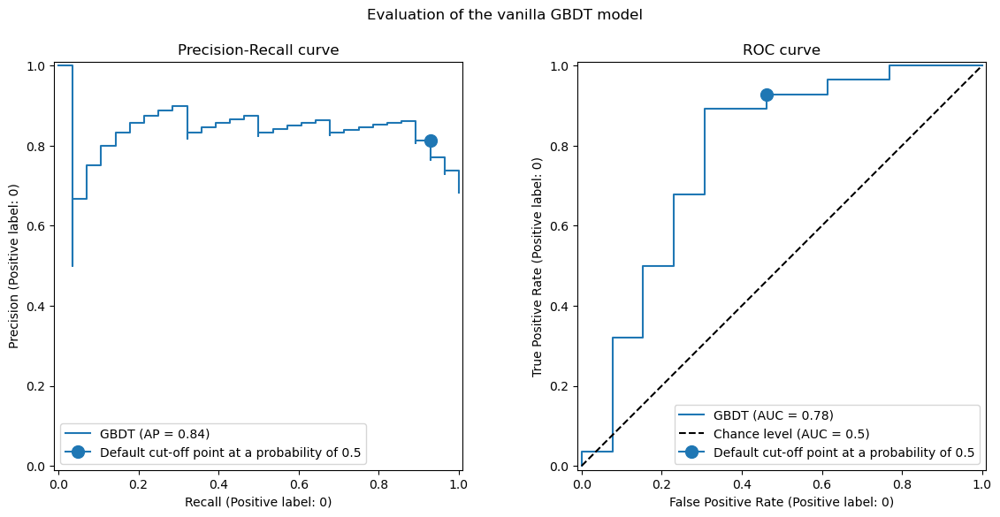

In [3597]:
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

PrecisionRecallDisplay.from_estimator(
    mod_35TT2, X_test_35TT2, y_test_35TT2, pos_label=pos_label, ax=axs[0], name="GBDT"
)
axs[0].plot(
    scoring["recall"](mod_35TT2, X_test_35TT2, y_test_35TT2),
    scoring["precision"](mod_35TT2, X_test_35TT2, y_test_35TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[0].set_title("Precision-Recall curve")
axs[0].legend()

RocCurveDisplay.from_estimator(
    mod_35TT2,
    X_test_35TT2,
    y_test_35TT2,
    pos_label=pos_label,
    ax=axs[1],
    name="GBDT",
    plot_chance_level=True,
)
axs[1].plot(
    scoring["fpr"](mod_35TT2, X_test_35TT2, y_test_35TT2),
    scoring["tpr"](mod_35TT2, X_test_35TT2, y_test_35TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[1].set_title("ROC curve")
axs[1].legend()
_ = fig.suptitle("Evaluation of the vanilla GBDT model")

In [3598]:
sum(y_test_35TT2==1)

13

In [3599]:
print(f"Business defined metric: {scoring['credit_gain'](mod_35TT2, X_test_35TT2, y_test_35TT2)}")

[[ 7  6]
 [ 2 26]]
Business defined metric: -98


In [3600]:
from sklearn.model_selection import TunedThresholdClassifierCV

In [3601]:
tuned_model_35TT2 = TunedThresholdClassifierCV(
    estimator=mod_35TT2,
    scoring=scoring["credit_gain"],
    store_cv_results=True,  # necessary to inspect all results
)
tuned_model_35TT2.fit(X_train_35TT2, y_train_35TT2)
print(f"{tuned_model_35TT2.best_threshold_=:0.2f}")

[[ 0  8]
 [ 0 17]]
[[ 1  7]
 [ 0 17]]
[[ 1  7]
 [ 0 17]]
[[ 1  7]
 [ 0 17]]
[[ 1  7]
 [ 0 17]]
[[ 1  7]
 [ 0 17]]
[[ 1  7]
 [ 0 17]]
[[ 1  7]
 [ 0 17]]
[[ 1  7]
 [ 0 17]]
[[ 1  7]
 [ 0 17]]
[[ 1  7]
 [ 0 17]]
[[ 1  7]
 [ 0 17]]
[[ 1  7]
 [ 0 17]]
[[ 1  7]
 [ 1 16]]
[[ 1  7]
 [ 1 16]]
[[ 1  7]
 [ 1 16]]
[[ 1  7]
 [ 1 16]]
[[ 1  7]
 [ 1 16]]
[[ 1  7]
 [ 1 16]]
[[ 1  7]
 [ 1 16]]
[[ 1  7]
 [ 1 16]]
[[ 1  7]
 [ 1 16]]
[[ 1  7]
 [ 1 16]]
[[ 1  7]
 [ 1 16]]
[[ 1  7]
 [ 1 16]]
[[ 1  7]
 [ 1 16]]
[[ 1  7]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 1 16]]
[[ 2  6]
 [ 

In [3602]:
def plot_roc_pr_curves(vanilla_model, tuned_model, *, title):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(21, 6))

    linestyles = ("dashed", "dotted")
    markerstyles = ("o", ">")
    colors = ("tab:blue", "tab:orange")
    names = ("Vanilla GBDT", "Tuned GBDT")
    for idx, (est, linestyle, marker, color, name) in enumerate(
        zip((vanilla_model, tuned_model), linestyles, markerstyles, colors, names)
    ):
        decision_threshold = getattr(est, "best_threshold_", 0.5)
        PrecisionRecallDisplay.from_estimator(
            est,
            X_test_35TT2,
            y_test_35TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[0],
            name=name,
        )
        axs[0].plot(
            scoring["recall"](est, X_test_35TT2, y_test_35TT2),
            scoring["precision"](est, X_test_35TT2, y_test_35TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )
        RocCurveDisplay.from_estimator(
            est,
            X_test_35TT2,
            y_test_35TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[1],
            name=name,
            plot_chance_level=idx == 1,
        )
        axs[1].plot(
            scoring["fpr"](est, X_test_35TT2, y_test_35TT2),
            scoring["tpr"](est, X_test_35TT2, y_test_35TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )

    axs[0].set_title("Precision-Recall curve")
    axs[0].legend()
    axs[1].set_title("ROC curve")
    axs[1].legend()

    axs[2].plot(
        tuned_model.cv_results_["thresholds"],
        tuned_model.cv_results_["scores"],
        color="tab:orange",
    )
    axs[2].plot(
        tuned_model.best_threshold_,
        tuned_model.best_score_,
        "o",
        markersize=10,
        color="tab:orange",
        label="Optimal cut-off point for the business metric",
    )
    axs[2].legend()
    axs[2].set_xlabel("Decision threshold (probability)")
    axs[2].set_ylabel("Objective score (using cost-matrix)")
    axs[2].set_title("Objective score as a function of the decision threshold")
    fig.suptitle(title)

[[ 7  6]
 [ 2 26]]
[[ 9  4]
 [ 5 23]]


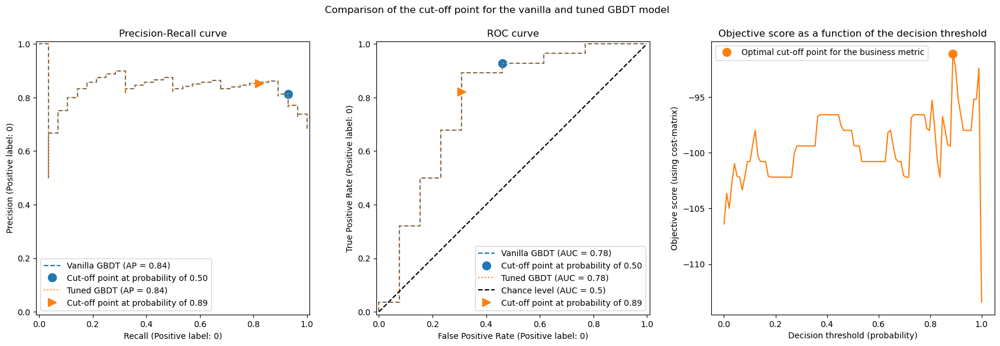

In [3603]:
title = "Comparison of the cut-off point for the vanilla and tuned GBDT model"
plot_roc_pr_curves(mod_35TT2, tuned_model_35TT2, title=title)

In [3604]:
print(f"Business defined metric: {scoring['credit_gain'](tuned_model_35TT2, X_test_35TT2, y_test_35TT2)}")

[[ 9  4]
 [ 5 23]]
Business defined metric: -91


In [3605]:
sum(y_test_35TT2==0)

28

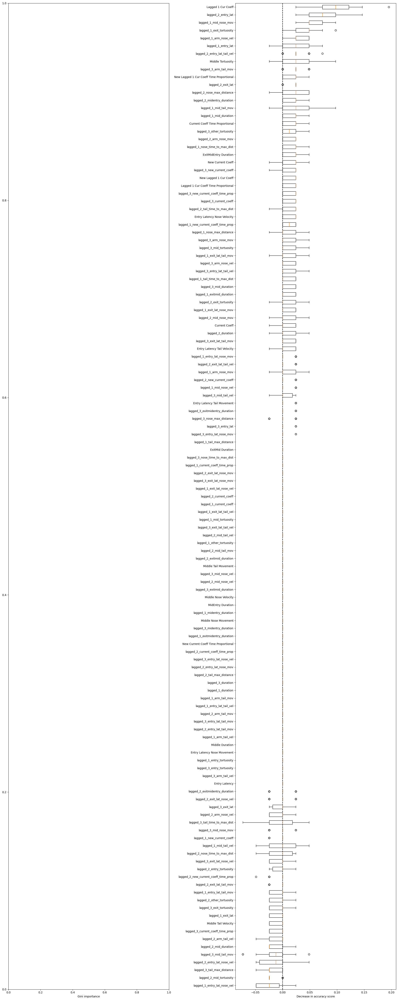

In [3606]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(tuned_model_35TT2, X_test_35TT2, y_test_35TT2, x_main_35,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

# _2(57), _3(111) vs _4(100), _5(51) - are 2+3 different than 4+5?

In [7760]:
grouped_lagged_added_stats_ri_23 = grouped_lagged_added_stats_ri.iloc[:,:][(grouped_lagged_added_stats_ri['Choice Output']==2)|(grouped_lagged_added_stats_ri['Choice Output']==3)]

In [7761]:
grouped_lagged_added_stats_ri_23['Binary']=0

In [7763]:
grouped_lagged_added_stats_ri_45 = grouped_lagged_added_stats_ri.iloc[:,:][(grouped_lagged_added_stats_ri['Choice Output']==4)|(grouped_lagged_added_stats_ri['Choice Output']==5)]

In [7764]:
grouped_lagged_added_stats_ri_45['Binary']=1

In [7765]:
grouped_lagged_binary23v45 = pd.concat([grouped_lagged_added_stats_ri_23, grouped_lagged_added_stats_ri_45])

In [7766]:
grouped_lagged_binary23v45_ri = grouped_lagged_binary23v45.reset_index(drop=True)

In [7895]:
x_main_23v45= grouped_lagged_binary23v45_ri.drop(columns = ['Choice Output', 'Duration', 'Exit Latency', 
        'Nose Max Distance', 'Nose Time to Max Dist', 'Tail Base Max Distance', 'Tail Base Time to Max Dist', 'Entry Tortuosity', 'Exit Tortuosity',
        'Other Tortuosity', 'Arm Nose Movement', 'Arm Nose Velocity', 'Arm Tail Movement', 'Arm Tail Velocity',
       
        'lagged_1_lagged_1_cur_coeff',
       'lagged_2_lagged_1_cur_coeff', 'lagged_3_lagged_1_cur_coeff',
       'lagged_4_lagged_1_cur_coeff',
       'lagged_1_lagged_2_cur_coeff', 'lagged_2_lagged_2_cur_coeff',
       'lagged_3_lagged_2_cur_coeff', 'lagged_4_lagged_2_cur_coeff',
       'lagged_1_lagged_3_cur_coeff',
       'lagged_2_lagged_3_cur_coeff', 'lagged_3_lagged_3_cur_coeff',
       'lagged_4_lagged_3_cur_coeff', 
       'lagged_1_lagged_4_cur_coeff', 'lagged_2_lagged_4_cur_coeff',
       'lagged_3_lagged_4_cur_coeff', 'lagged_4_lagged_4_cur_coeff',
       
       
       'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop',
       'lagged_3_lagged_1_cur_coeff_time_prop',
       'lagged_4_lagged_1_cur_coeff_time_prop',
       
       'lagged_1_lagged_2_cur_coeff_time_prop',
       'lagged_2_lagged_2_cur_coeff_time_prop',
       'lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop',
       
       'lagged_1_lagged_3_cur_coeff_time_prop',
       'lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop',
       'lagged_4_lagged_3_cur_coeff_time_prop',
       
       'lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop',
       'lagged_3_lagged_4_cur_coeff_time_prop',
       'lagged_4_lagged_4_cur_coeff_time_prop',
                                                                                                             
                                                                                                             
        'lagged_1_lagged_1_cur_coeff_time_prop',
       'lagged_2_lagged_1_cur_coeff_time_prop','lagged_3_lagged_1_cur_coeff_time_prop','lagged_4_lagged_1_cur_coeff_time_prop',
       'lagged_1_lagged_2_cur_coeff_time_prop','lagged_2_lagged_2_cur_coeff_time_prop','lagged_3_lagged_2_cur_coeff_time_prop',
       'lagged_4_lagged_2_cur_coeff_time_prop','lagged_1_lagged_3_cur_coeff_time_prop','lagged_2_lagged_3_cur_coeff_time_prop',
       'lagged_3_lagged_3_cur_coeff_time_prop','lagged_4_lagged_3_cur_coeff_time_prop','lagged_1_lagged_4_cur_coeff_time_prop',
       'lagged_2_lagged_4_cur_coeff_time_prop','lagged_3_lagged_4_cur_coeff_time_prop','lagged_4_lagged_4_cur_coeff_time_prop', 
        'Turn', 'lagged_1_turn_ago', 'lagged_2_turn_ago', 'lagged_3_turn_ago', 'lagged_4_turn_ago', 
        '2_cur_arm_duration', '3_cur_arm_duration', '4_cur_arm_duration',
       '5_cur_arm_duration', 'mean_2_cur_arm_duration',
       'mean_3_cur_arm_duration', 'mean_4_cur_arm_duration',
       'mean_5_cur_arm_duration', '2_past_arm_duration', '3_past_arm_duration',
       '4_past_arm_duration', 'mean_2_past_arm_duration',
       'mean_3_past_arm_duration', 'mean_4_past_arm_duration',
       '2_past_mid_duration', '3_past_mid_duration', '4_past_mid_duration',
       '5_past_mid_duration', 'mean_2_past_mid_duration',
       'mean_3_past_mid_duration', 'mean_4_past_mid_duration',
       'mean_5_past_mid_duration', '2_past_exitmid_duration',
       '3_past_exitmid_duration', '4_past_exitmid_duration',
       '5_past_exitmid_duration', 'mean_2_past_exitmid_duration',
       'mean_3_past_exitmid_duration', 'mean_4_past_exitmid_duration',
       'mean_5_past_exitmid_duration', '2_past_midentry_duration',
       '3_past_midentry_duration', '4_past_midentry_duration',
       '5_past_midentry_duration', 'mean_2_past_midentry_duration',
       'mean_3_past_midentry_duration', 'mean_4_past_midentry_duration',
       'mean_5_past_midentry_duration', '2_past_exitmidentry_duration',
       '3_past_exitmidentry_duration', '4_past_exitmidentry_duration',
       '5_past_exitmidentry_duration', 'mean_2_past_exitmidentry_duration',
       'mean_3_past_exitmidentry_duration',
       'mean_4_past_exitmidentry_duration',
       'mean_5_past_exitmidentry_duration',
                                                                                                               
        'lagged_1_choice_ago', 'lagged_2_choice_ago', 'lagged_3_choice_ago',
       'lagged_4_choice_ago',
        'lagged_1_new_lagged_1_cur_coeff',
        'lagged_2_new_lagged_1_cur_coeff', 
        'lagged_3_new_lagged_1_cur_coeff','lagged_4_new_lagged_1_cur_coeff','lagged_1_new_lagged_2_cur_coeff', 'lagged_2_new_lagged_2_cur_coeff', 
        'lagged_3_new_lagged_2_cur_coeff', 'lagged_4_new_lagged_2_cur_coeff','lagged_1_new_lagged_3_cur_coeff','lagged_2_new_lagged_3_cur_coeff', 
        'lagged_3_new_lagged_3_cur_coeff','lagged_4_new_lagged_3_cur_coeff','lagged_1_new_lagged_4_cur_coeff', 'lagged_2_new_lagged_4_cur_coeff',
        'lagged_3_new_lagged_4_cur_coeff', 'lagged_4_new_lagged_4_cur_coeff','lagged_1_new_lagged_1_cur_coeff_time_prop',
       'lagged_2_new_lagged_1_cur_coeff_time_prop','lagged_3_new_lagged_1_cur_coeff_time_prop','lagged_4_new_lagged_1_cur_coeff_time_prop',
       'lagged_1_new_lagged_2_cur_coeff_time_prop','lagged_2_new_lagged_2_cur_coeff_time_prop','lagged_3_new_lagged_2_cur_coeff_time_prop',
       'lagged_4_new_lagged_2_cur_coeff_time_prop','lagged_1_new_lagged_3_cur_coeff_time_prop','lagged_2_new_lagged_3_cur_coeff_time_prop',
       'lagged_3_new_lagged_3_cur_coeff_time_prop','lagged_4_new_lagged_3_cur_coeff_time_prop','lagged_1_new_lagged_4_cur_coeff_time_prop',
       'lagged_2_new_lagged_4_cur_coeff_time_prop','lagged_3_new_lagged_4_cur_coeff_time_prop','lagged_4_new_lagged_4_cur_coeff_time_prop',
        'Exit Latency Nose Movement', 'Exit Latency Nose Velocity', 'Exit Latency Tail Movement', 'Exit Latency Tail Velocity',
    
      'Lagged 4 Cur Coeff', 
        'New Lagged 4 Cur Coeff',                                          
                                                     
         'Lagged 4 Cur Coeff Time Proportional',
       'New Lagged 4 Cur Coeff Time Proportional',                                            
      'Binary',
       'Lagged 2 Cur Coeff',  'New Lagged 2 Cur Coeff', 'Lagged 2 Cur Coeff Time Proportional', 'New Lagged 2 Cur Coeff Time Proportional',                                             
       'Lagged 3 Cur Coeff',  'New Lagged 3 Cur Coeff', 'Lagged 3 Cur Coeff Time Proportional', 'New Lagged 3 Cur Coeff Time Proportional',                                                 
       'Lagged 1 Cur Coeff',  'New Lagged 1 Cur Coeff', 'Lagged 1 Cur Coeff Time Proportional', 'New Lagged 1 Cur Coeff Time Proportional',                                                 ])


# 'Lagged 3 Cur Coeff','New Lagged 3 Cur Coeff','Lagged 3 Cur Coeff Time Proportional', 'New Lagged 3 Cur Coeff Time Proportional',


In [7896]:
x_main_23v45.columns[:100]

Index(['Middle Duration', 'lagged_1_mid_duration', 'lagged_2_mid_duration',
       'lagged_3_mid_duration', 'lagged_4_mid_duration',
       'Middle Nose Movement', 'lagged_1_mid_nose_mov',
       'lagged_2_mid_nose_mov', 'lagged_3_mid_nose_mov',
       'lagged_4_mid_nose_mov', 'Middle Nose Velocity',
       'lagged_1_mid_nose_vel', 'lagged_2_mid_nose_vel',
       'lagged_3_mid_nose_vel', 'lagged_4_mid_nose_vel',
       'Middle Tail Movement', 'lagged_1_mid_tail_mov',
       'lagged_2_mid_tail_mov', 'lagged_3_mid_tail_mov',
       'lagged_4_mid_tail_mov', 'Middle Tail Velocity',
       'lagged_1_mid_tail_vel', 'lagged_2_mid_tail_vel',
       'lagged_3_mid_tail_vel', 'lagged_4_mid_tail_vel', 'Middle Tortuosity',
       'lagged_1_mid_tortuosity', 'lagged_2_mid_tortuosity',
       'lagged_3_mid_tortuosity', 'lagged_4_mid_tortuosity', 'Current Coeff',
       'lagged_1_current_coeff', 'lagged_2_current_coeff',
       'lagged_3_current_coeff', 'lagged_4_current_coeff', 'New Current Coeff',
  

In [7897]:
x_23v45 = x_main_23v45.values

In [7898]:
y_23v45 = grouped_lagged_binary23v45_ri['Binary'].values

In [7899]:
X_train_23v45, X_test_23v45, y_train_23v45, y_test_23v45 = train_test_split(x_23v45, y_23v45, test_size=0.2, random_state=5)

In [7900]:
mod_23v45 =  HistGradientBoostingClassifier(learning_rate = 0.05, validation_fraction=0.1, n_iter_no_change=20, random_state=54)
mod_23v45.fit(X_train_23v45, y_train_23v45)
y_pred_23v45=mod_23v45.predict(X_test_23v45)

In [7901]:
mod_23v45.n_iter_

100

In [7902]:
target_names = ['0', '1']

In [7903]:
f1_sc_23v45 = f1_score(y_test_23v45, y_pred_23v45, average = 'weighted')
f1_sc_23v45

0.6403612062637631

In [7904]:
p_sc_23v45 = precision_score(y_test_23v45, y_pred_23v45, average = 'weighted')
p_sc_23v45

0.6404105392156862

In [7905]:
cf_matrix_23v45 = confusion_matrix(y_test_23v45, y_pred_23v45)
cf_matrix_23v45

array([[22, 11],
       [12, 19]], dtype=int64)

In [7906]:
print(classification_report(y_test_23v45, y_pred_23v45, target_names=target_names))

              precision    recall  f1-score   support

           0       0.65      0.67      0.66        33
           1       0.63      0.61      0.62        31

    accuracy                           0.64        64
   macro avg       0.64      0.64      0.64        64
weighted avg       0.64      0.64      0.64        64



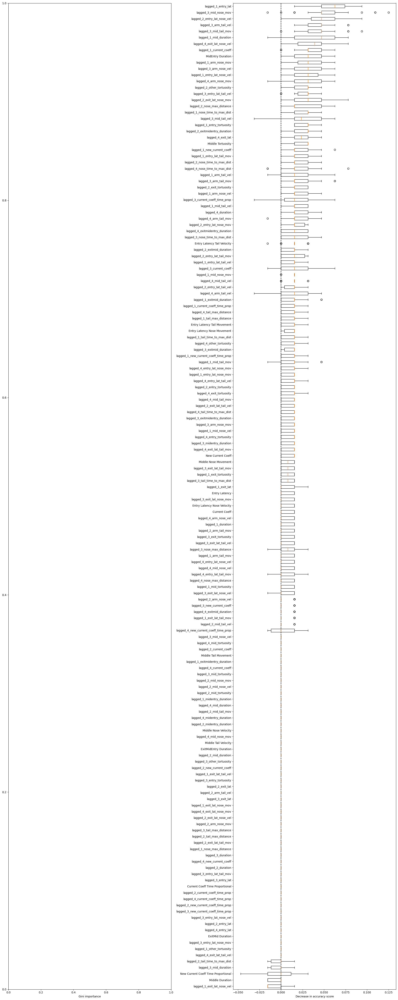

In [7907]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(mod_23v45, X_test_23v45, y_test_23v45, x_main_23v45,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')

In [7908]:
# try tuning part2

In [7952]:
X_train_23v45TT2, X_test_23v45TT2, y_train_23v45TT2, y_test_23v45TT2 = train_test_split(x_23v45, y_23v45, stratify=y_23v45, random_state=7)

In [7953]:
pos_label, neg_label = 0,1 # dont want to misclassify lows as highs

In [7954]:
def fpr_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    tn, fp, _, _ = cm.ravel()
    tnr = tn / (tn + fp)
    return 1 - tnr

In [7955]:
from sklearn.metrics import make_scorer, precision_score, recall_score

In [7956]:
tpr_score = recall_score  # TPR and recall are the same metric
scoring = {
    "precision": make_scorer(precision_score, pos_label=pos_label),
    "recall": make_scorer(recall_score, pos_label=pos_label),
    "fpr": make_scorer(fpr_score, neg_label=neg_label, pos_label=pos_label),
    "tpr": make_scorer(tpr_score, pos_label=pos_label),
}

In [7957]:
def credit_gain_score(y, y_pred, neg_label, pos_label):
    cm = confusion_matrix(y, y_pred, labels=[neg_label, pos_label])
    print(cm)
    gain_matrix = np.array(
        [
            [0, -2],  # -1 gain for false positives (when a high is classified as low)
            [-2, 0],  # -5 gain for false negatives (when a low is classified as high)
        ]
    )
    return np.sum(cm * gain_matrix)


scoring["credit_gain"] = make_scorer(
    credit_gain_score, neg_label=neg_label, pos_label=pos_label
)

In [7958]:
mod_23v45TT2 = HistGradientBoostingClassifier(learning_rate = 0.015, n_iter_no_change=20, random_state=57)

In [7959]:
mod_23v45TT2.fit(X_train_23v45TT2, y_train_23v45TT2)

HistGradientBoostingClassifier(learning_rate=0.015, n_iter_no_change=20,
                               random_state=57)

[[19 19]
 [11 31]]


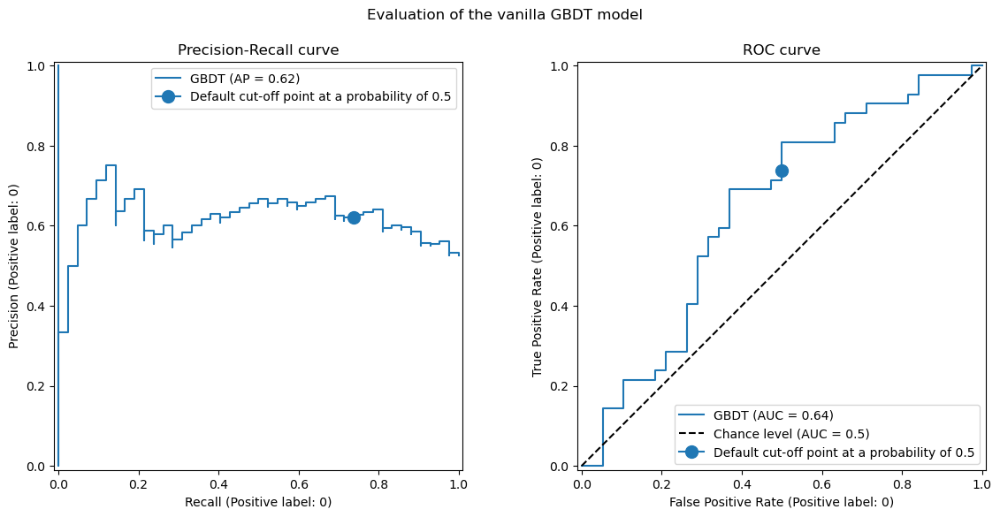

In [7960]:
from sklearn.metrics import PrecisionRecallDisplay, RocCurveDisplay

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

PrecisionRecallDisplay.from_estimator(
    mod_23v45TT2, X_test_23v45TT2, y_test_23v45TT2, pos_label=pos_label, ax=axs[0], name="GBDT"
)
axs[0].plot(
    scoring["recall"](mod_23v45TT2, X_test_23v45TT2, y_test_23v45TT2),
    scoring["precision"](mod_23v45TT2, X_test_23v45TT2, y_test_23v45TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[0].set_title("Precision-Recall curve")
axs[0].legend()

RocCurveDisplay.from_estimator(
    mod_23v45TT2,
    X_test_23v45TT2,
    y_test_23v45TT2,
    pos_label=pos_label,
    ax=axs[1],
    name="GBDT",
    plot_chance_level=True,
)
axs[1].plot(
    scoring["fpr"](mod_23v45TT2, X_test_23v45TT2, y_test_23v45TT2),
    scoring["tpr"](mod_23v45TT2, X_test_23v45TT2, y_test_23v45TT2),
    marker="o",
    markersize=10,
    color="tab:blue",
    label="Default cut-off point at a probability of 0.5",
)
axs[1].set_title("ROC curve")
axs[1].legend()
_ = fig.suptitle("Evaluation of the vanilla GBDT model")

In [7961]:
sum(y_test_23v45TT2==1)

38

In [7962]:
print(f"Business defined metric: {scoring['credit_gain'](mod_23v45TT2, X_test_23v45TT2, y_test_23v45TT2)}")

[[19 19]
 [11 31]]
Business defined metric: -60


In [7963]:
from sklearn.model_selection import TunedThresholdClassifierCV

In [7964]:
tuned_model_23v45TT2 = TunedThresholdClassifierCV(
    estimator=mod_23v45TT2,
    scoring=scoring["credit_gain"],
    store_cv_results=True,  # necessary to inspect all results
)
tuned_model_23v45TT2.fit(X_train_23v45TT2, y_train_23v45TT2)
print(f"{tuned_model_23v45TT2.best_threshold_=:0.2f}")

[[ 0 23]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 1 22]
 [ 0 25]]
[[ 2 21]
 [ 0 25]]
[[ 3 20]
 [ 0 25]]
[[ 4 19]
 [ 1 24]]
[[ 4 19]
 [ 1 24]]
[[ 4 19]
 [ 1 24]]
[[ 4 19]
 [ 1 24]]
[[ 4 19]
 [ 2 23]]
[[ 5 18]
 [ 2 23]]
[[ 5 18]
 [ 2 23]]
[[ 6 17]
 [ 2 23]]
[[ 7 16]
 [ 2 23]]
[[ 7 16]
 [ 2 23]]
[[ 7 16]
 [ 2 23]]
[[ 7 16]
 [ 3 22]]
[[ 7 16]
 [ 3 22]]
[[ 7 16]
 [ 3 22]]
[[ 7 16]
 [ 4 21]]
[[ 8 15]
 [ 4 21]]
[[ 8 15]
 [ 4 21]]
[[ 8 15]
 [ 5 20]]
[[ 9 14]
 [ 5 20]]
[[ 9 14]
 [ 6 19]]
[[10 13]
 [ 6 19]]
[[10 13]
 [ 6 19]]
[[10 13]
 [ 8 17]]
[[10 13]
 [ 8 17]]
[[11 12]
 [ 9 16]]
[[11 12]
 [ 9 16]]
[[11 12]
 [ 9 16]]
[[11 12]
 [ 9 16]]
[[11 12]
 [10 15]]
[[11 12]
 [10 15]]
[[12 11]
 [10 15]]
[[12 11]
 [10 15]]
[[14  9]
 [10 15]]
[[14  9]
 [10 15]]
[[14  9]
 [10 15]]
[[15  8]
 [1

In [7965]:
def plot_roc_pr_curves(vanilla_model, tuned_model, *, title):
    fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(21, 6))

    linestyles = ("dashed", "dotted")
    markerstyles = ("o", ">")
    colors = ("tab:blue", "tab:orange")
    names = ("Vanilla GBDT", "Tuned GBDT")
    for idx, (est, linestyle, marker, color, name) in enumerate(
        zip((vanilla_model, tuned_model), linestyles, markerstyles, colors, names)
    ):
        decision_threshold = getattr(est, "best_threshold_", 0.5)
        PrecisionRecallDisplay.from_estimator(
            est,
            X_test_23v45TT2,
            y_test_23v45TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[0],
            name=name,
        )
        axs[0].plot(
            scoring["recall"](est, X_test_23v45TT2, y_test_23v45TT2),
            scoring["precision"](est, X_test_23v45TT2, y_test_23v45TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )
        RocCurveDisplay.from_estimator(
            est,
            X_test_23v45TT2,
            y_test_23v45TT2,
            pos_label=pos_label,
            linestyle=linestyle,
            color=color,
            ax=axs[1],
            name=name,
            plot_chance_level=idx == 1,
        )
        axs[1].plot(
            scoring["fpr"](est, X_test_23v45TT2, y_test_23v45TT2),
            scoring["tpr"](est, X_test_23v45TT2, y_test_23v45TT2),
            marker,
            markersize=10,
            color=color,
            label=f"Cut-off point at probability of {decision_threshold:.2f}",
        )

    axs[0].set_title("Precision-Recall curve")
    axs[0].legend()
    axs[1].set_title("ROC curve")
    axs[1].legend()

    axs[2].plot(
        tuned_model.cv_results_["thresholds"],
        tuned_model.cv_results_["scores"],
        color="tab:orange",
    )
    axs[2].plot(
        tuned_model.best_threshold_,
        tuned_model.best_score_,
        "o",
        markersize=10,
        color="tab:orange",
        label="Optimal cut-off point for the business metric",
    )
    axs[2].legend()
    axs[2].set_xlabel("Decision threshold (probability)")
    axs[2].set_ylabel("Objective score (using cost-matrix)")
    axs[2].set_title("Objective score as a function of the decision threshold")
    fig.suptitle(title)

[[19 19]
 [11 31]]
[[22 16]
 [13 29]]


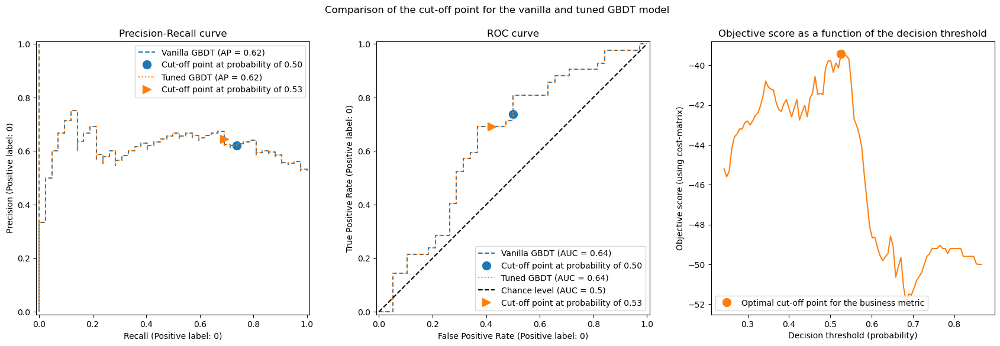

In [7966]:
title = "Comparison of the cut-off point for the vanilla and tuned GBDT model"
plot_roc_pr_curves(mod_23v45TT2, tuned_model_23v45TT2, title=title)

In [7967]:
print(f"Business defined metric: {scoring['credit_gain'](tuned_model_23v45TT2, X_test_23v45TT2, y_test_23v45TT2)}")

[[22 16]
 [13 29]]
Business defined metric: -58


In [7968]:
sum(y_test_23v45TT2==0)

42

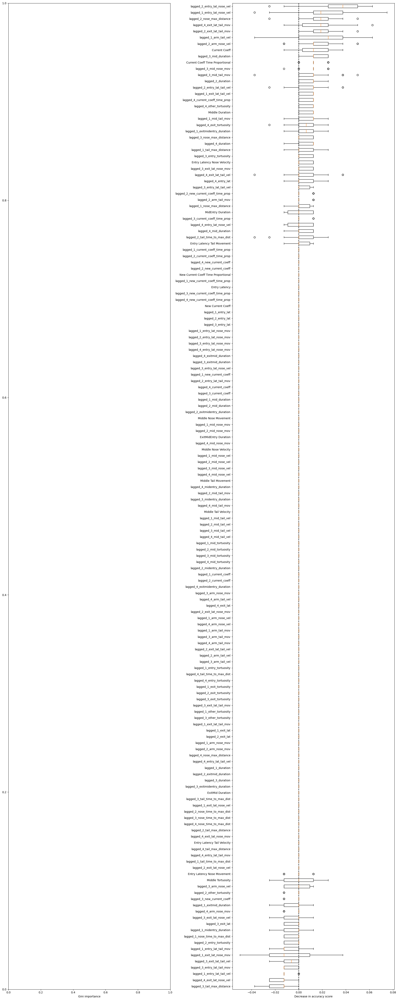

In [7969]:
#mdi_importances_bin= pd.Series(mod_bin.feature_importances_, index=x_binary_main.columns)
#tree_importance_sorted_idx_bin = np.argsort(mod_bin.feature_importances_)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 50))
#mdi_importances_bin.sort_values().plot.barh(ax=ax1)
ax1.set_xlabel("Gini importance")
plot_permutation_importance(tuned_model_23v45TT2, X_test_23v45TT2, y_test_23v45TT2, x_main_23v45,ax2)
ax2.set_xlabel("Decrease in accuracy score")
#fig.suptitle(
#    "Impurity-based vs. permutation importances on multicollinear features (train set)"
#)
_ = fig.tight_layout()


#plt.savefig('Impurity-based_vs_permutation importances.png')